# Проект: 
# Обучение с учителем: качество модели

**Проект: Оптимизация клиентской активности интернет-магазина**

**Описание бизнеса:** Интернет-магазин «В один клик» специализируется на продаже широкого ассортимента товаров, включая детские товары, товары для дома, мелкую бытовую технику, косметику и продукты питания.

**Текущая ситуация:** Наблюдается снижение покупательской активности существующих клиентов при высокой узнаваемости бренда среди целевой аудитории. Стратегия привлечения новых клиентов показала снижение эффективности.

**Цель проекта:** Разработка системы персонализированных предложений для повышения активности постоянных клиентов.

**Задача стажёра:** В рамках отдела цифровых технологий необходимо создать решение по персонализации клиентских предложений на основе анализа данных и бизнес-моделирования для увеличения покупательской активности.

**Контекст:** Проект реализуется в современной технологической компании с акцентом на data-driven подход к принятию решений.

* Разработайте модель, которая предскажет вероятность снижения покупательской активности.
* Выделите сегмент покупателей, проанализируйте его и предложите, как увеличить его покупательскую активность. Используйте данные моделирования, данные о прибыли покупателей и исходные данные (если понадобятся). По желанию вы можете проанализировать больше одного сегмента.

Ниже несколько примеров сегментов, но вы также можете выделить свой:

Группа клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.
Группа клиентов, которые покупают только технику, то есть товары с длинным жизненным циклом.
Группа клиентов, которые покупают товары из категории «Товары для себя» (новая категория, которую можно выделить на основе текущих) или «Товары для детей».
Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью.

**import необходимых библиотек для работы**

In [1]:
!pip install phik

In [2]:
!pip install shap

In [3]:
!pip install --upgrade shap

In [4]:
!pip install -U scikit-learn

In [5]:
pip install --upgrade shap matplotlib

  Using cached matplotlib-3.9.4-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.3 MB)
  Using cached matplotlib-3.9.3-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.3 MB)
  Using cached matplotlib-3.9.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.3 MB)
  Using cached matplotlib-3.9.1.post1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.3 MB)
  Using cached matplotlib-3.9.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.3 MB)
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats as st
from datetime import datetime, timedelta
import seaborn as sns
import phik
# import plotly.express as px
# from plotly import graph_objects as go
# import statsmodels.stats.multitest as smm

# Настройка отображения чисел и отображение Pandas
pd.set_option('display.max_columns', None)
pd.set_option("display.float_format", "{:.2f}".format)

# импорт для МО
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder, 
    StandardScaler, 
    MinMaxScaler,
    RobustScaler
)
from sklearn.impute import SimpleImputer
# модели
from sklearn.tree import DecisionTreeClassifier
# from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import (
    LogisticRegression, 
    LinearRegression
)
# метрики
from sklearn.metrics import (
    mean_squared_error, 
    r2_score, 
    mean_absolute_error,
    accuracy_score,
    confusion_matrix,
    recall_score,
    precision_score,
    roc_auc_score
)
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV
)
# пайплайн
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.inspection import permutation_importance

import shap

## Шаг 1. Загрузка данных

### import csv

In [7]:
df_market_file = pd.read_csv('/datasets/market_file.csv', sep=',')

In [8]:
df_market_money = pd.read_csv('/datasets/market_money.csv', sep=',')

In [9]:
df_market_time = pd.read_csv('/datasets/market_time.csv', sep=',')

In [10]:
df_money = pd.read_csv('/datasets/money.csv', sep=';', decimal = ',')

функция предварительного анализа

In [11]:
def first_look(df):
    display(df.head())
    print()
    print('Имена колонок:')
    print(df.columns)
    print()
    print('Info:')
    print(df.info())
    print()
    print('Describe:')
    display(df.describe())

In [12]:
list_of_the_files = [df_market_file, df_market_money, df_market_time, df_money]

In [13]:
for file in list_of_the_files:
    first_look(file)

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2



Имена колонок:
Index(['id', 'Покупательская активность', 'Тип сервиса', 'Разрешить сообщать',
       'Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность',
       'Акционные_покупки', 'Популярная_категория',
       'Средний_просмотр_категорий_за_визит',
       'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса',
       'Страниц_за_визит'],
      dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 no

,id,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
count,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00
mean,215997.50,4.25,4.01,601.90,0.32,3.27,2.84,4.19,8.18
std,375.42,1.01,0.70,249.86,0.25,1.36,1.97,1.96,3.98
min,215348.00,0.90,3.00,110.00,0.00,1.00,0.00,0.00,1.00
25%,215672.75,3.70,4.00,405.50,0.17,2.00,1.00,3.00,5.00
50%,215997.50,4.20,4.00,606.00,0.24,3.00,3.00,4.00,8.00
75%,216322.25,4.90,4.00,806.00,0.30,4.00,4.00,6.00,11.00
max,216647.00,6.60,5.00,1079.00,0.99,6.00,10.00,9.00,20.00


,id,Период,Выручка
0,215348,препредыдущий_месяц,0.00
1,215348,текущий_месяц,3293.10
2,215348,предыдущий_месяц,0.00
3,215349,препредыдущий_месяц,4472.00
4,215349,текущий_месяц,4971.60



Имена колонок:
Index(['id', 'Период', 'Выручка'], dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   Период   3900 non-null   object 
 2   Выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB
None

Describe:


,id,Выручка
count,3900.00,3900.00
mean,215997.50,5025.70
std,375.33,1777.70
min,215348.00,0.00
25%,215672.75,4590.15
50%,215997.50,4957.50
75%,216322.25,5363.00
max,216647.00,106862.20


,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13



Имена колонок:
Index(['id', 'Период', 'минут'], dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB
None

Describe:


,id,минут
count,2600.00,2600.00
mean,215997.50,13.34
std,375.35,4.08
min,215348.00,4.00
25%,215672.75,10.00
50%,215997.50,13.00
75%,216322.25,16.00
max,216647.00,23.00


,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21



Имена колонок:
Index(['id', 'Прибыль'], dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB
None

Describe:


,id,Прибыль
count,1300.00,1300.00
mean,215997.50,4.00
std,375.42,1.01
min,215348.00,0.86
25%,215672.75,3.30
50%,215997.50,4.04
75%,216322.25,4.67
max,216647.00,7.43


In [14]:
first_look(df_market_file)

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2



Имена колонок:
Index(['id', 'Покупательская активность', 'Тип сервиса', 'Разрешить сообщать',
       'Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность',
       'Акционные_покупки', 'Популярная_категория',
       'Средний_просмотр_категорий_за_визит',
       'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса',
       'Страниц_за_визит'],
      dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 no

,id,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
count,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00
mean,215997.50,4.25,4.01,601.90,0.32,3.27,2.84,4.19,8.18
std,375.42,1.01,0.70,249.86,0.25,1.36,1.97,1.96,3.98
min,215348.00,0.90,3.00,110.00,0.00,1.00,0.00,0.00,1.00
25%,215672.75,3.70,4.00,405.50,0.17,2.00,1.00,3.00,5.00
50%,215997.50,4.20,4.00,606.00,0.24,3.00,3.00,4.00,8.00
75%,216322.25,4.90,4.00,806.00,0.30,4.00,4.00,6.00,11.00
max,216647.00,6.60,5.00,1079.00,0.99,6.00,10.00,9.00,20.00


In [15]:
first_look(df_market_money)

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.00
1,215348,текущий_месяц,3293.10
2,215348,предыдущий_месяц,0.00
3,215349,препредыдущий_месяц,4472.00
4,215349,текущий_месяц,4971.60



Имена колонок:
Index(['id', 'Период', 'Выручка'], dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   Период   3900 non-null   object 
 2   Выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB
None

Describe:


,id,Выручка
count,3900.00,3900.00
mean,215997.50,5025.70
std,375.33,1777.70
min,215348.00,0.00
25%,215672.75,4590.15
50%,215997.50,4957.50
75%,216322.25,5363.00
max,216647.00,106862.20


In [16]:
first_look(df_market_time)

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13



Имена колонок:
Index(['id', 'Период', 'минут'], dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB
None

Describe:


,id,минут
count,2600.00,2600.00
mean,215997.50,13.34
std,375.35,4.08
min,215348.00,4.00
25%,215672.75,10.00
50%,215997.50,13.00
75%,216322.25,16.00
max,216647.00,23.00


In [17]:
first_look(df_money)

,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21



Имена колонок:
Index(['id', 'Прибыль'], dtype='object')

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB
None

Describe:


,id,Прибыль
count,1300.00,1300.00
mean,215997.50,4.00
std,375.42,1.01
min,215348.00,0.86
25%,215672.75,3.30
50%,215997.50,4.04
75%,216322.25,4.67
max,216647.00,7.43


**Вывод:** 
На исследование передано 4 файла в формате csv.

* Потенциальное использование данных

**Данные могут быть использованы для:**

    * персонализировать предложения постоянным клиентам
    * Разработки модели МО
    * дополнительные предложения для выбранного сегмента покупателей.

Данные имеют четкую структуру и содержат всю необходимую информацию для работы на проекте.

## Шаг 2. Предобработка данных

Проведите необходимую предобработку данных. Названия столбцов можно оставить кириллическими.

Избавимся от пробелов и переведём всё в нижнижний регистр

все типы колонок совпали, дополнительно ничего переводить не надо

### переводим все колонки в нижний регистр и заменяем пробелы на "_"

In [18]:
for df in list_of_the_files:
    df.columns = df.columns.str.lower().str.replace(' ', '_')
        

### проверка на дуликаты

#### начнём с df_market_file

In [19]:
for c in df_market_file.columns:
    print('Колонка в обработке:', c)
    display(df_market_file[c].value_counts().head())
    print()

Колонка в обработке: id


215348    1
216202    1
216220    1
216219    1
216218    1
Name: id, dtype: int64


Колонка в обработке: покупательская_активность


Прежний уровень    802
Снизилась          498
Name: покупательская_активность, dtype: int64


Колонка в обработке: тип_сервиса


стандарт     914
премиум      376
стандартт     10
Name: тип_сервиса, dtype: int64


Колонка в обработке: разрешить_сообщать


да     962
нет    338
Name: разрешить_сообщать, dtype: int64


Колонка в обработке: маркет_актив_6_мес


4.10    94
3.90    83
4.40    82
4.00    71
5.50    68
Name: маркет_актив_6_мес, dtype: int64


Колонка в обработке: маркет_актив_тек_мес


4    669
5    323
3    308
Name: маркет_актив_тек_мес, dtype: int64


Колонка в обработке: длительность


627    7
600    7
449    7
503    6
511    6
Name: длительность, dtype: int64


Колонка в обработке: акционные_покупки


0.24    93
0.30    85
0.28    83
0.17    79
0.25    72
Name: акционные_покупки, dtype: int64


Колонка в обработке: популярная_категория


Товары для детей                        330
Домашний текстиль                       251
Косметика и аксесуары                   223
Техника для красоты и здоровья          184
Мелкая бытовая техника и электроника    174
Name: популярная_категория, dtype: int64


Колонка в обработке: средний_просмотр_категорий_за_визит


3    356
2    312
4    263
5    177
1    106
Name: средний_просмотр_категорий_за_визит, dtype: int64


Колонка в обработке: неоплаченные_продукты_штук_квартал


1    261
2    261
3    218
4    197
5    135
Name: неоплаченные_продукты_штук_квартал, dtype: int64


Колонка в обработке: ошибка_сервиса


4    257
3    226
5    208
2    189
6    156
Name: ошибка_сервиса, dtype: int64


Колонка в обработке: страниц_за_визит


6    127
5    115
4    112
8    109
9    108
Name: страниц_за_визит, dtype: int64

#### Необходимо преобразовать некорректное значение в Колонке: тип_сервиса - стандартт

In [20]:
df_market_file['тип_сервиса'] = df_market_file['тип_сервиса'].replace('стандартт', 'стандарт')

Проводим эти работы на остальных 3х файлах

df_market_money - обрабатываем

In [21]:
for c in df_market_money.columns:
    print('Колонка в обработке:', c)
    display(df_market_money[c].value_counts().head())
    print()

Колонка в обработке: id


215349    3
215756    3
215792    3
215790    3
215788    3
Name: id, dtype: int64


Колонка в обработке: период


предыдущий_месяц       1300
препредыдущий_месяц    1300
текущий_месяц          1300
Name: период, dtype: int64


Колонка в обработке: выручка


4729.00    8
5051.00    7
4952.00    7
0.00       6
4974.00    6
Name: выручка, dtype: int64

Некорректно записаны данные внутри колонки "период" - правим

препредыдущий_месяц - для меня это ошибка..., т.к. вроде нет такого слова.. Нужно это править или нет?

* предыдущий месяц — месяц, который шёл перед текущим;
* предпредыдущий месяц (разговорный вариант) или месяц, предшествующий предыдущему (официальная форма) — месяц, который шёл перед предыдущим месяцем.

In [22]:
# df_market_money['период'] = df_market_money['период'].replace('препредыдущий_месяц', 'предыдущий_месяц')

df_market_time - обрабатываем

In [23]:
for c in df_market_time.columns:
    print('Колонка в обработке:', c)
    display(df_market_time[c].value_counts().head())
    print()

Колонка в обработке: id


215349    2
215756    2
215792    2
215790    2
215788    2
Name: id, dtype: int64


Колонка в обработке: период


текущий_месяц       1300
предыдцщий_месяц    1300
Name: период, dtype: int64


Колонка в обработке: минут


14    256
12    237
11    221
13    206
10    204
Name: минут, dtype: int64

Некорректно записаны данные внутри колонки "период" - правим

In [24]:
df_market_time['период'] = df_market_time['период'].replace('предыдцщий_месяц', 'предыдущий_месяц')

df_money - обрабатываем

In [25]:
for c in df_money.columns:
    print('Колонка в обработке:', c)
    display(df_money[c].value_counts().head())
    print()

Колонка в обработке: id


215348    1
216202    1
216220    1
216219    1
216218    1
Name: id, dtype: int64


Колонка в обработке: прибыль


3.89    11
4.28     9
5.10     9
4.18     9
2.93     8
Name: прибыль, dtype: int64

#### Убираем дубликаты если они есть

In [26]:
# print(list_of_the_files[0])

In [27]:
# for i, df in enumerate(list_of_the_files):
#     file_name = list_of_the_files[i]
#     print(f"В обработке {i+1}: {file_name}")
#     df = df.drop_duplicates()
#     print('all duplicate are found:', df.duplicated().sum())
    



In [28]:
for df in list_of_the_files:
#     print(f"В обработке: {df}")
    df = df.drop_duplicates()
    print('all duplicate are found:', df.duplicated().sum())

all duplicate are found: 0
all duplicate are found: 0
all duplicate are found: 0
all duplicate are found: 0


#### проверка на пустоты

In [29]:
for df in list_of_the_files:
#     print(df)
    print('free space are found:', df[df.isna().any(axis=1)])


# df_market_file[df_market_file.isna().any(axis=1)]

free space are found: Empty DataFrame
Columns: [id, покупательская_активность, тип_сервиса, разрешить_сообщать, маркет_актив_6_мес, маркет_актив_тек_мес, длительность, акционные_покупки, популярная_категория, средний_просмотр_категорий_за_визит, неоплаченные_продукты_штук_квартал, ошибка_сервиса, страниц_за_визит]
Index: []
free space are found: Empty DataFrame
Columns: [id, период, выручка]
Index: []
free space are found: Empty DataFrame
Columns: [id, период, минут]
Index: []
free space are found: Empty DataFrame
Columns: [id, прибыль]
Index: []


#### проверка на пропущенные значение

In [30]:
for df in list_of_the_files:
    print(df.isnull().sum())
    print(df.isna().mean()*100)
    print('---')

id                                     0
покупательская_активность              0
тип_сервиса                            0
разрешить_сообщать                     0
маркет_актив_6_мес                     0
маркет_актив_тек_мес                   0
длительность                           0
акционные_покупки                      0
популярная_категория                   0
средний_просмотр_категорий_за_визит    0
неоплаченные_продукты_штук_квартал     0
ошибка_сервиса                         0
страниц_за_визит                       0
dtype: int64
id                                    0.00
покупательская_активность             0.00
тип_сервиса                           0.00
разрешить_сообщать                    0.00
маркет_актив_6_мес                    0.00
маркет_актив_тек_мес                  0.00
длительность                          0.00
акционные_покупки                     0.00
популярная_категория                  0.00
средний_просмотр_категорий_за_визит   0.00
неоплаченные_продукты_шт

** Выводы **
* имена колонок - убраны пробелы и всё в нижнем регистре
1. df_market_file:
    * Явных дубликатов не выявлено
    * Пустых значений нет
    * колонка "период" произведено преобразование ('стандартт' в ->  'стандарт')
2. df_market_money:
    * Явных дубликатов не выявлено
    * Пустых значений нет
    * стоит ли преобразовать значение колонки "период" ('препредыдущий_месяц' в -> 'предыдущий_месяц') - ?
3. df_market_time:
    * колонка "период" произведено преобразование ('предыдцщий_месяц' в ->  'предыдущий_месяц')
    * Явных дубликатов не выявлено
    * Пустых значений нет
4. df_money:
    * Явных дубликатов не выявлено
    * Пустых значений нет

## Шаг 3. Исследовательский анализ данных

In [31]:
# def plot_two_graf(df,name_column):
#     # Создаем фигуру с двумя осями
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

#     # Гистограмма на первой оси
#     grouped = df[name_column]
#     grouped.plot(kind='hist', ax=ax1, bins=50)

#     # Настройка первого графика
#     ax1.set_title('Распределение: {}'.format(name_column))
#     ax1.set_xlabel('#')
#     ax1.set_ylabel('Общее количество')
#     ax1.grid(axis='y')
#     ax1.tick_params(axis='x', rotation=45)

#     # Дополнительные улучшения для первого графика
#     ax1.set_axisbelow(True)
#     ax1.spines['right'].set_visible(False)
#     ax1.spines['top'].set_visible(False)

#     # Боксплот на второй оси
#     # Просто используем весь DataFrame без фильтрации
#     df.boxplot(column=name_column, ax=ax2)

#     # Настройка второго графика
#     ax2.set_title('Диаграмма размаха: {}'.format(name_column))

#     # Получаем описание столбца
#     describe = df[name_column].describe()
#     print(describe)

#     # Отображение графиков
#     plt.tight_layout()
#     plt.show()

#     return #describe

In [32]:
def plot_two_graf(df, name_column):
    # Проверяем, является ли признак дискретным
    is_discrete = (
        name_column != 'длительность' and  # исключаем специальную колонку
        (df[name_column].nunique() <= 20 or  # мало уникальных значений
         df[name_column].dtype == 'int64')  # целочисленный тип
    )
    
    # Создаем фигуру с двумя осями
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Обработка дискретных признаков
    if is_discrete:
        # countplot для дискретных значений
        sns.countplot(data=df, x=name_column, ax=ax1, order=df[name_column].value_counts().index)
        ax1.set_title('Распределение значений: {}'.format(name_column))
        ax1.set_xlabel('Уникальные значения')
        ax1.set_ylabel('Количество')
        ax1.tick_params(axis='x', rotation=45)
        
        # Удаляем второй график (боксплот не нужен для дискретных)
        ax2.axis('off')  # скрываем вторую ось
        
    else:
        # Гистограмма для непрерывных признаков
        df[name_column].plot(kind='hist', ax=ax1, bins=50)
        ax1.set_title('Распределение: {}'.format(name_column))
        ax1.set_xlabel('Значение')
        ax1.set_ylabel('Частота')
        ax1.grid(axis='y')
        ax1.tick_params(axis='x', rotation=45)
        
        # Боксплот для непрерывных признаков
        sns.boxplot(data=df, x=name_column, ax=ax2)
        ax2.set_title('Диаграмма размаха: {}'.format(name_column))
        ax2.set_xlabel('Значение')
    
    # Общие настройки графиков
    for ax in [ax1, ax2]:
        ax.set_axisbelow(True)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    # Получаем описание столбца
    describe = df[name_column].describe()
    print(describe)
    return describe

In [33]:
def distribution_of_columns(df,name_column):
    # Группировка и построение графика
    grouped = df.groupby(name_column).size()

    # Создание круговой диаграммы
    fig, ax = plt.subplots(figsize=(15, 8))
    wedges, labels, autotexts = ax.pie(grouped, 
        autopct='%1.1f%%',  # Отображение процентов
        startangle=90,      # Начало с верхней точки
        wedgeprops=dict(width=0.5),  # Толщина сектора
    )

    # Настройка внешнего вида текста
    plt.setp(autotexts, size=10, weight="bold")
    plt.setp(labels, size=10)

    # Добавление легенды
    ax.legend(labels=grouped.index, 
        title=name_column, 
        loc="center left", 
        bbox_to_anchor=(1, 0, 0.5, 1))

    # Настройка параметров графика
    plt.title('Распределение ')
    plt.axis('equal')  # Равномерное масштабирование

    plt.show()

    return df[name_column].unique()

### df_market_file

In [34]:
# df = df_market_file

# non_object_columns = [col for col in df.columns if df[col].dtype != 'object']

# for c in non_object_columns:
#     plot_two_graf(df,c)
    

In [35]:
df_market_file['длительность'].nunique()

658

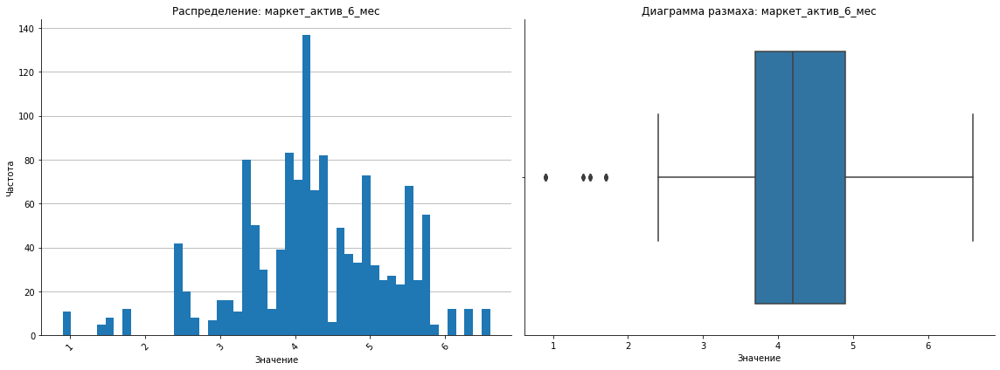

count   1300.00
mean       4.25
std        1.01
min        0.90
25%        3.70
50%        4.20
75%        4.90
max        6.60
Name: маркет_актив_6_мес, dtype: float64


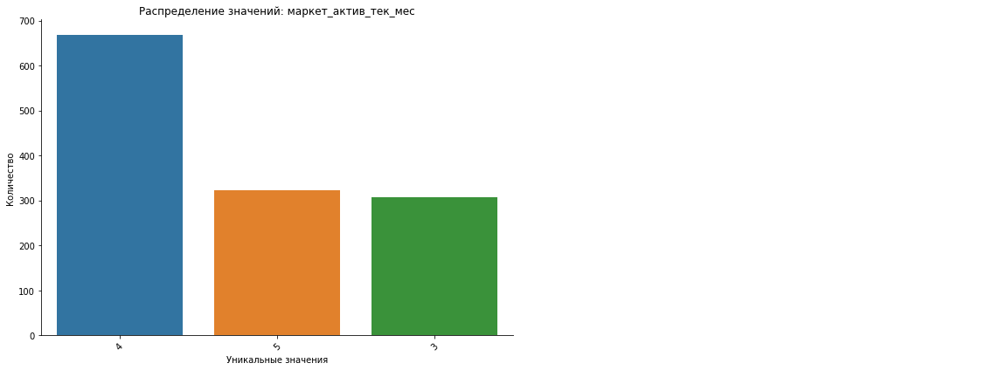

count   1300.00
mean       4.01
std        0.70
min        3.00
25%        4.00
50%        4.00
75%        4.00
max        5.00
Name: маркет_актив_тек_мес, dtype: float64


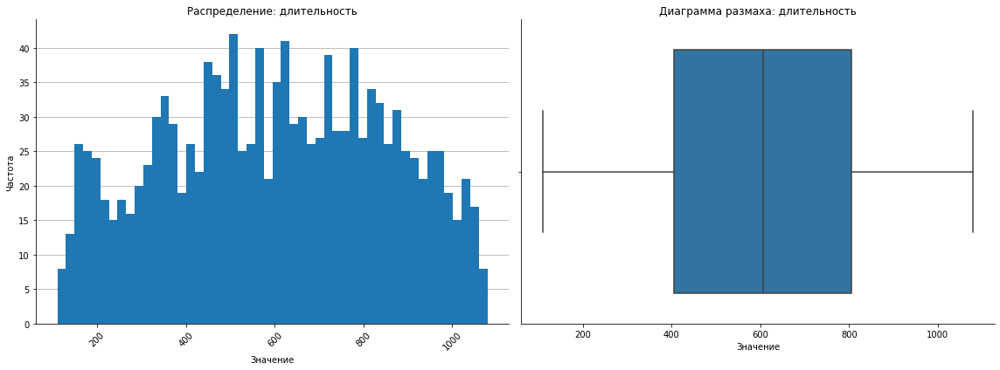

count   1300.00
mean     601.90
std      249.86
min      110.00
25%      405.50
50%      606.00
75%      806.00
max     1079.00
Name: длительность, dtype: float64


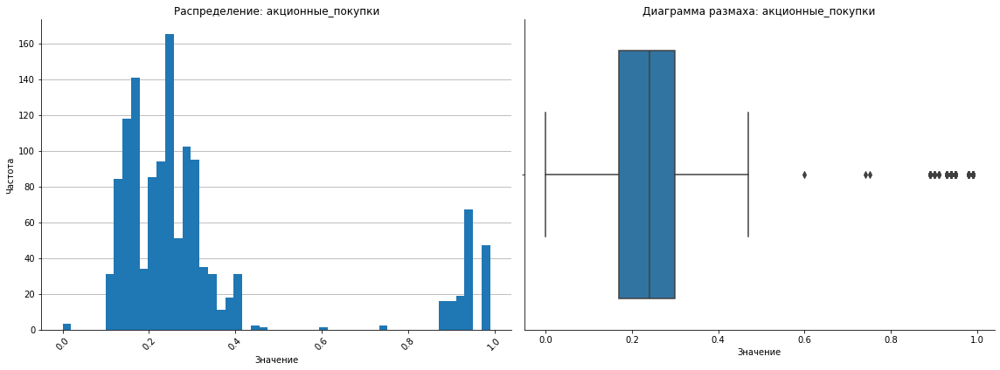

count   1300.00
mean       0.32
std        0.25
min        0.00
25%        0.17
50%        0.24
75%        0.30
max        0.99
Name: акционные_покупки, dtype: float64


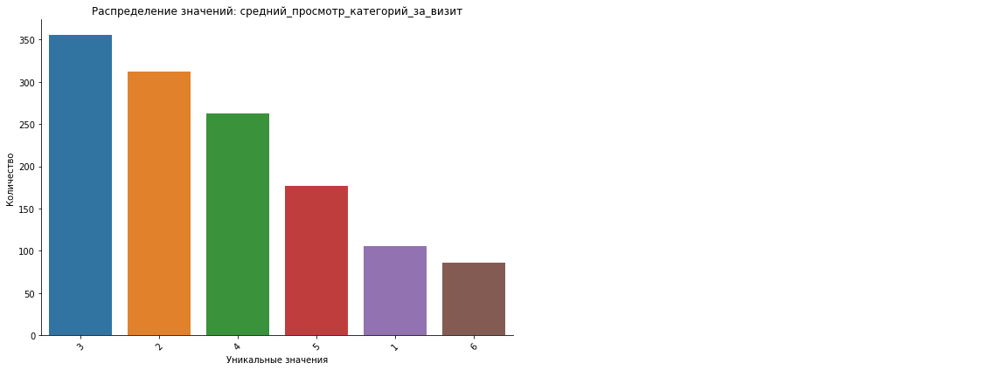

count   1300.00
mean       3.27
std        1.36
min        1.00
25%        2.00
50%        3.00
75%        4.00
max        6.00
Name: средний_просмотр_категорий_за_визит, dtype: float64


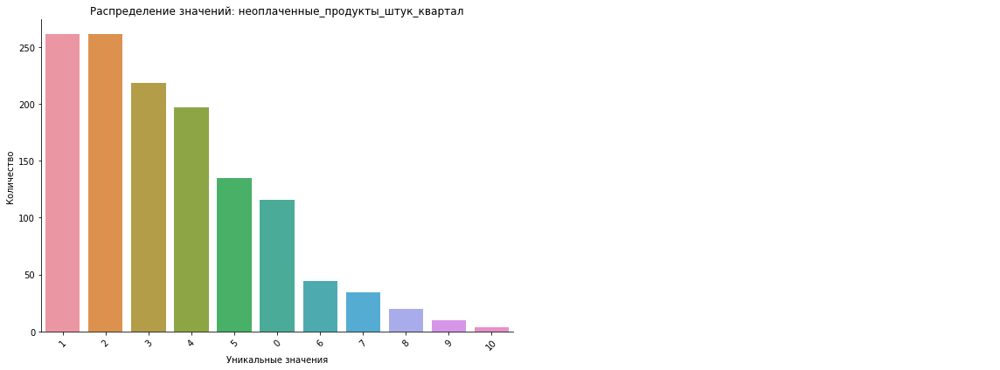

count   1300.00
mean       2.84
std        1.97
min        0.00
25%        1.00
50%        3.00
75%        4.00
max       10.00
Name: неоплаченные_продукты_штук_квартал, dtype: float64


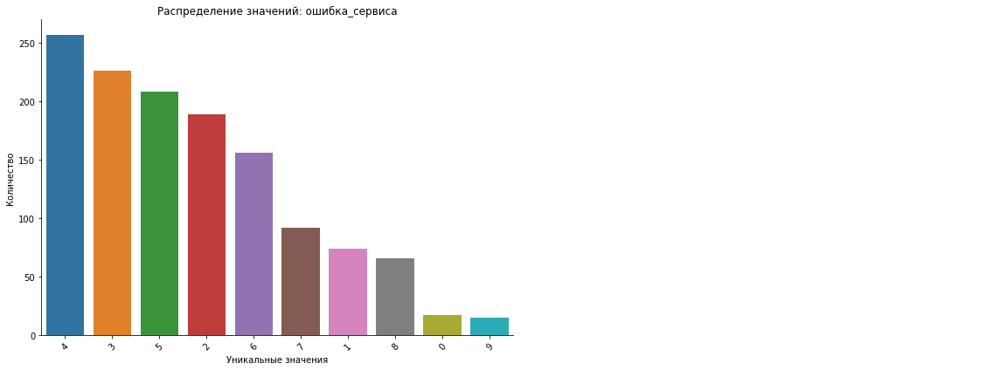

count   1300.00
mean       4.19
std        1.96
min        0.00
25%        3.00
50%        4.00
75%        6.00
max        9.00
Name: ошибка_сервиса, dtype: float64


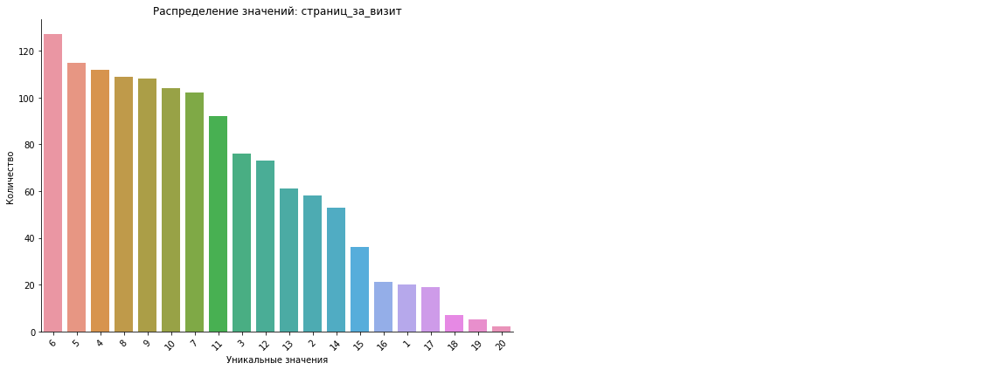

count   1300.00
mean       8.18
std        3.98
min        1.00
25%        5.00
50%        8.00
75%       11.00
max       20.00
Name: страниц_за_визит, dtype: float64


In [36]:
df = df_market_file

# Исключаем id из анализа и категориальные признаки
non_object_columns = [
    col for col in df.columns 
    if df[col].dtype != 'object' and 'id' not in col.lower()
]

for c in non_object_columns:
    plot_two_graf(df, c)

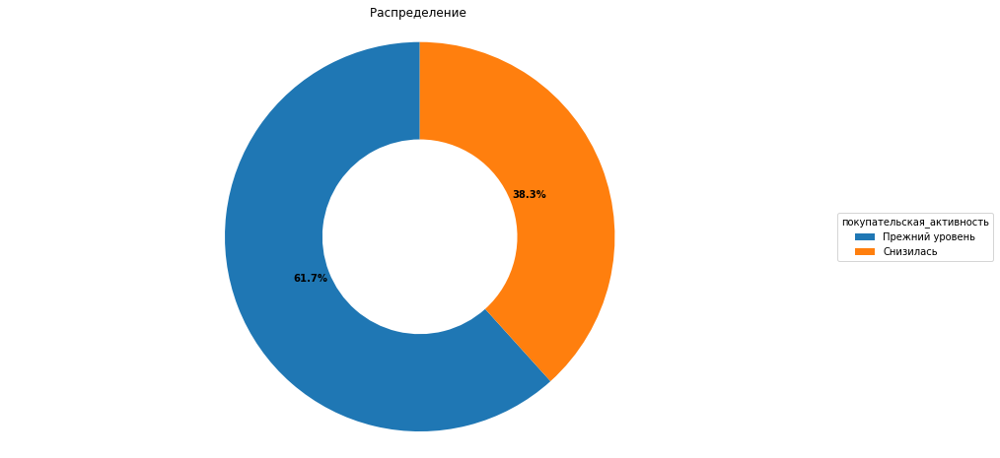

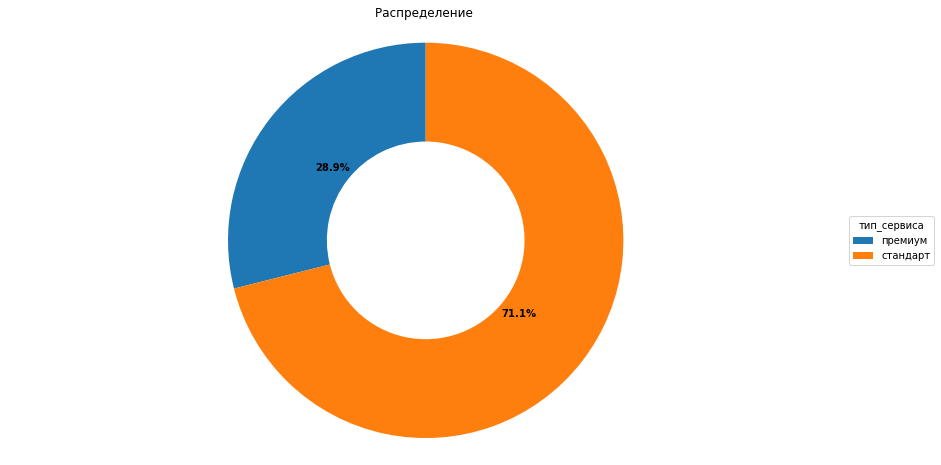

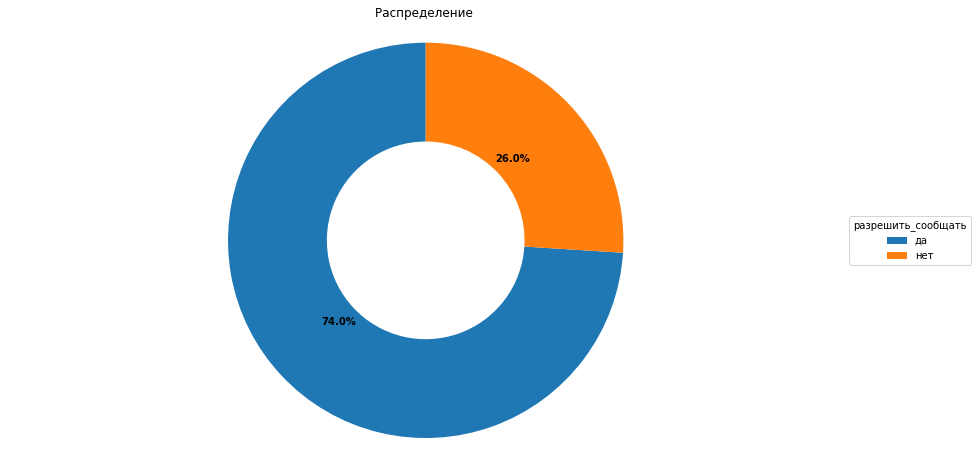

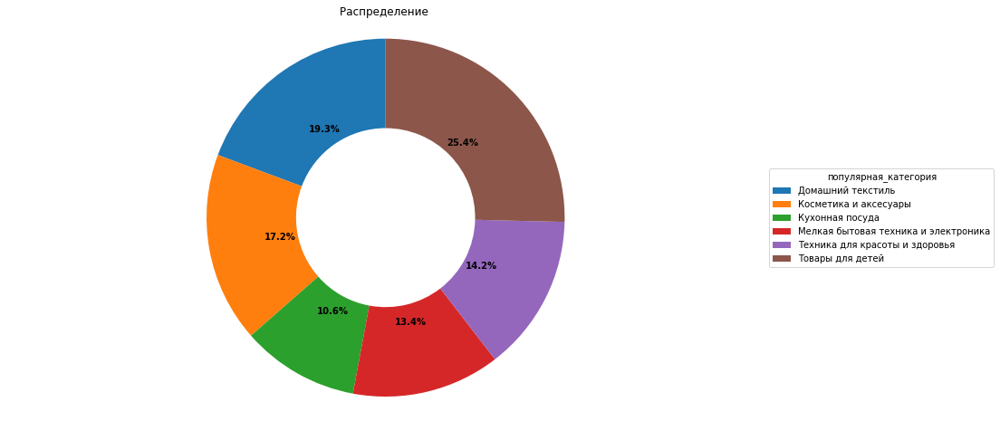

In [37]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        distribution_of_columns(df,c)

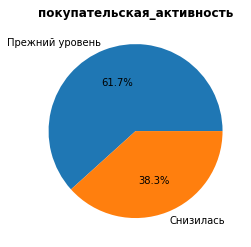

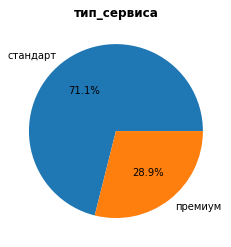

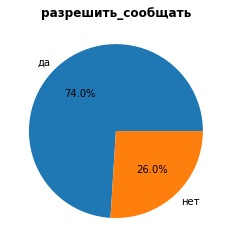

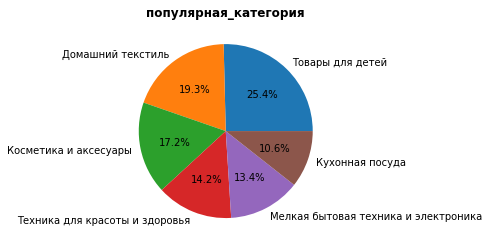

In [38]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        df[c].value_counts().plot.pie(autopct='%1.1f%%')
        plt.title(f'{c}', fontweight='bold')
        plt.axis('off')  # убирает все оси и подписи
        plt.show()

не выбрал как лучше отображать кругу, может скажите по опыту.., а то рисовал по разному в разных проектах....

### df_market_money

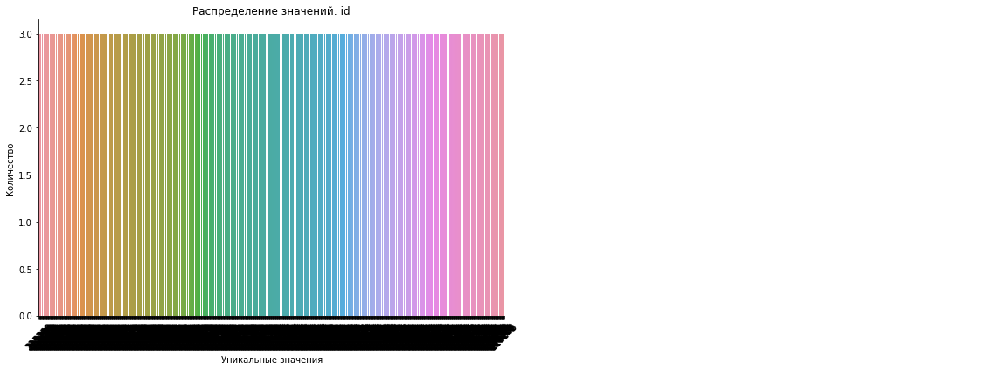

count     3900.00
mean    215997.50
std        375.33
min     215348.00
25%     215672.75
50%     215997.50
75%     216322.25
max     216647.00
Name: id, dtype: float64


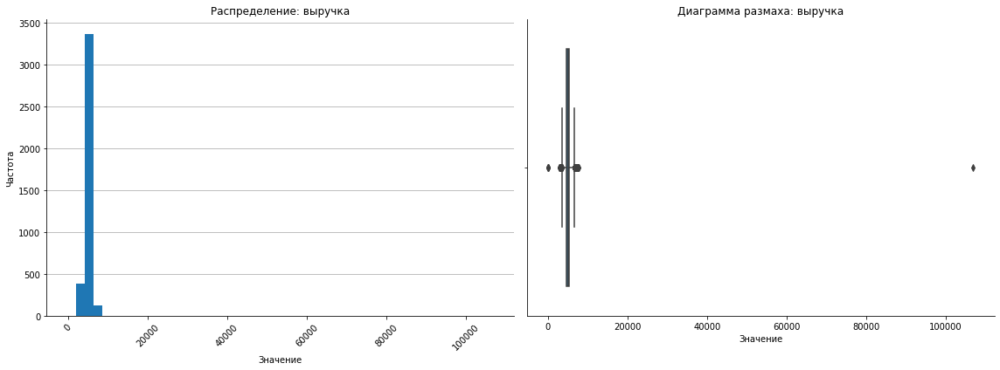

count     3900.00
mean      5025.70
std       1777.70
min          0.00
25%       4590.15
50%       4957.50
75%       5363.00
max     106862.20
Name: выручка, dtype: float64


In [39]:
df = df_market_money

non_object_columns = [col for col in df.columns if df[col].dtype != 'object']

for c in non_object_columns:
    plot_two_graf(df,c)

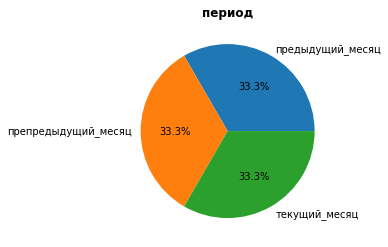

In [40]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        df[c].value_counts().plot.pie(autopct='%1.1f%%')
        plt.title(f'{c}', fontweight='bold')
        plt.axis('off')  # убирает все оси и подписи
        plt.show()

в выручке есть явный выброс...

In [41]:
df_market_money[df_market_money['выручка'] > 10000]

,id,период,выручка
98,215380,текущий_месяц,106862.20


удаляем

In [42]:
df_market_money = df_market_money[df_market_money['выручка'] < 10000]

### df_market_time

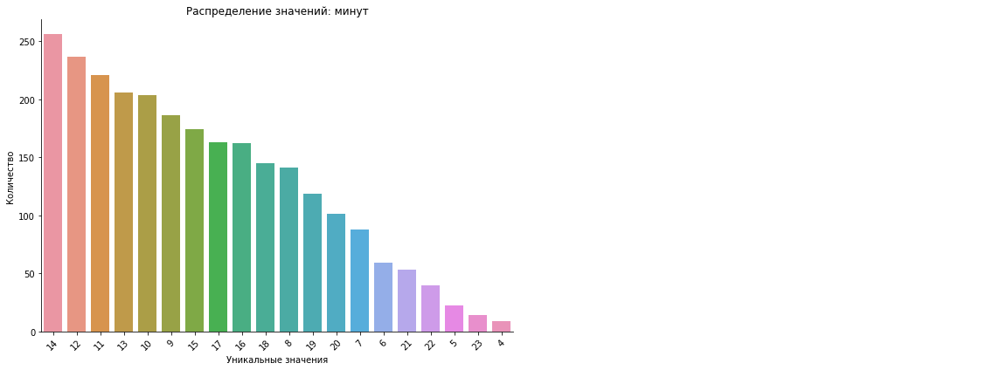

count   2600.00
mean      13.34
std        4.08
min        4.00
25%       10.00
50%       13.00
75%       16.00
max       23.00
Name: минут, dtype: float64


In [43]:
df = df_market_time

non_object_columns = [
    col for col in df.columns 
    if df[col].dtype != 'object' and 'id' not in col.lower()
]

for c in non_object_columns:
    plot_two_graf(df,c)

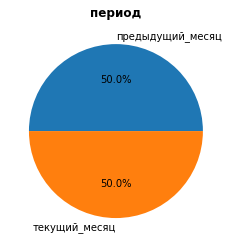

In [44]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        df[c].value_counts().plot.pie(autopct='%1.1f%%')
        plt.title(f'{c}', fontweight='bold')
        plt.axis('off')  # убирает все оси и подписи
        plt.show()

### df_money

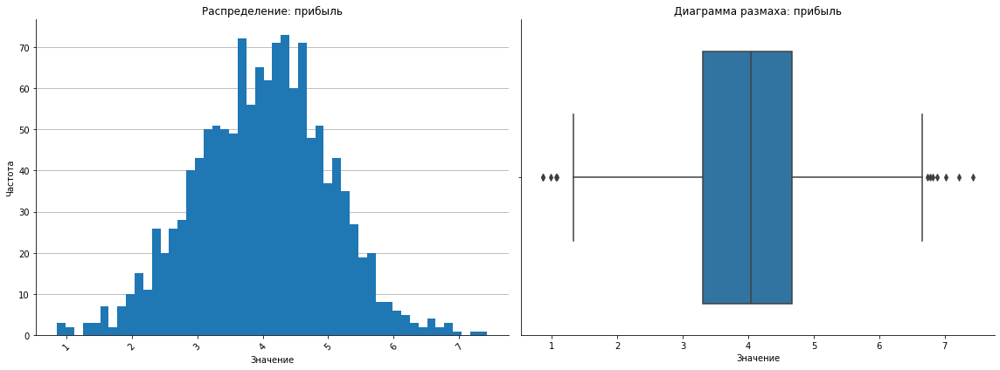

count   1300.00
mean       4.00
std        1.01
min        0.86
25%        3.30
50%        4.04
75%        4.67
max        7.43
Name: прибыль, dtype: float64


In [45]:
df = df_money

non_object_columns = [
    col for col in df.columns 
    if df[col].dtype != 'object' and 'id' not in col.lower()
]

for c in non_object_columns:
    plot_two_graf(df,c)

In [46]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        df[c].value_counts().plot.pie(autopct='%1.1f%%')
        plt.title(f'{c}', fontweight='bold')
        plt.axis('off')  # убирает все оси и подписи
        plt.show()

** Выводы **
1. df_market_file:
    * Выбросов нет
2. df_market_money:
    * обноружен выброс id = 215380. Выручка более 106862.20, что привышает ближайшее высокое значение более чем в 10 раз. Удаляем
    * после удаления видим близкое к нормальному распределению поля выручка
3. df_market_time:
    * Выбросов нет
4. df_money:
    * Выбросов нет

## Шаг 4. Объединение таблиц

### 4.1 Объедините таблицы market_file.csv, market_money.csv, market_time.csv. Данные о прибыли из файла money.csv при моделировании вам не понадобятся. 

- оказывается это рекомендация а не отдельный пункт в 4ом шаге... 4.2 Учитывайте, что данные о выручке и времени на сайте находятся в одном столбце для всех периодов. В итоговой таблице сделайте отдельный столбец для каждого периода.

#### df_market_file

In [47]:
display(df_market_file.head())
df_market_file.shape


,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандарт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандарт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандарт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2


(1300, 13)

In [48]:
df_market_file.set_index('id', inplace=True)
display(df_market_file.head())
df_market_file.shape

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
id,,,,,,,,,,,,
215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5
215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5
215350,Снизилась,стандарт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5
215351,Снизилась,стандарт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4
215352,Снизилась,стандарт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2


(1300, 12)

#### df_market_money

In [49]:
display(df_market_money.head())
df_market_money.shape

,id,период,выручка
0,215348,препредыдущий_месяц,0.00
1,215348,текущий_месяц,3293.10
2,215348,предыдущий_месяц,0.00
3,215349,препредыдущий_месяц,4472.00
4,215349,текущий_месяц,4971.60


(3899, 3)

для объединения 2х файлов, нам необходимо построить pivot таблицу, и превести всё к id. добавим к каждому полю прошлую колонку "выручка_"

далее сделаем ресет идексов на id и уже по индексу будем объединять , т.к. это не нужно для предсказания

In [50]:
df_market_money = df_market_money.pivot_table(index='id', columns='период', values='выручка')
df_market_money.columns = ['выручка_препредыдущий_месяц', 'выручка_текущий_месяц', 'выручка_предыдущий_месяц']
df_market_money.head()

,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц
id,,,
215348,0.00,0.00,3293.10
215349,5216.00,4472.00,4971.60
215350,5457.50,4826.00,5058.40
215351,6158.00,4793.00,6610.40
215352,5807.50,4594.00,5872.50


#### df_market_time

Тоже самое надо сделать и для df_market_time, Пивот и далее сет индекс для id

In [51]:
df_market_time = df_market_time.pivot_table(index='id', columns='период', values='минут')
df_market_time.columns = ['минут_предыдущий_месяц', 'минут_текущий_месяц']
df_market_time.head()

,минут_предыдущий_месяц,минут_текущий_месяц
id,,
215348,13,14
215349,12,10
215350,8,13
215351,11,13
215352,8,11


объединяем - используем "inner" для отброса данных, где нет информации по выручке или минут посещения

In [52]:
df_market = df_market_file.join(df_market_money, how = 'inner')
df_market = df_market.join(df_market_time, how = 'inner')
df_market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
id,,,,,,,,,,,,,,,,,
215348,Снизилась,премиум,да,3.40,5,121,0.00,Товары для детей,6,2,1,5,0.00,0.00,3293.10,13,14
215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5,5216.00,4472.00,4971.60,12,10
215350,Снизилась,стандарт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5,5457.50,4826.00,5058.40,8,13
215351,Снизилась,стандарт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4,6158.00,4793.00,6610.40,11,13
215352,Снизилась,стандарт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2,5807.50,4594.00,5872.50,8,11


In [53]:
print(df_market.shape)
print()
df_market.info()

(1300, 17)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1300 entries, 215348 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   покупательская_активность            1300 non-null   object 
 1   тип_сервиса                          1300 non-null   object 
 2   разрешить_сообщать                   1300 non-null   object 
 3   маркет_актив_6_мес                   1300 non-null   float64
 4   маркет_актив_тек_мес                 1300 non-null   int64  
 5   длительность                         1300 non-null   int64  
 6   акционные_покупки                    1300 non-null   float64
 7   популярная_категория                 1300 non-null   object 
 8   средний_просмотр_категорий_за_визит  1300 non-null   int64  
 9   неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 10  ошибка_сервиса                       1300 non-null   int64  
 11  страниц_за_

** Выводы **
1. df_market:
    * объединился в себе df_market_file, df_market_money, df_market_time
    * для файлов была проведена предобработка заключающаяся в том, мы превели всё к единому id df_market_money, df_market_time. использую pivot


In [54]:
# Список столбцов с выручкой
revenue_columns = [
    'выручка_препредыдущий_месяц',
    'выручка_текущий_месяц',
    'выручка_предыдущий_месяц'
]

# Находим пользователей с нулевой выручкой 
inactive_users = df_market[
    (df_market[revenue_columns] == 0).any(axis=1)
]

# Удаляем неактивных пользователей из исходного датафрейма
df_market_active = df_market[
    ~(df_market[revenue_columns] == 0).any(axis=1)
]

# Проверяем результат
print(f"Исходное количество пользователей: {len(df_market)}")
print(f"Количество неактивных пользователей: {len(inactive_users)}")
print(f"Количество активных пользователей: {len(df_market_active)}")

# Если нужно заменить исходный датафрейм на очищенный
df_market = df_market_active.copy()

Исходное количество пользователей: 1300
Количество неактивных пользователей: 3
Количество активных пользователей: 1297


## Шаг 5. Корреляционный анализ

Проведите корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования. Сделайте выводы о мультиколлинеарности и при необходимости устраните её.

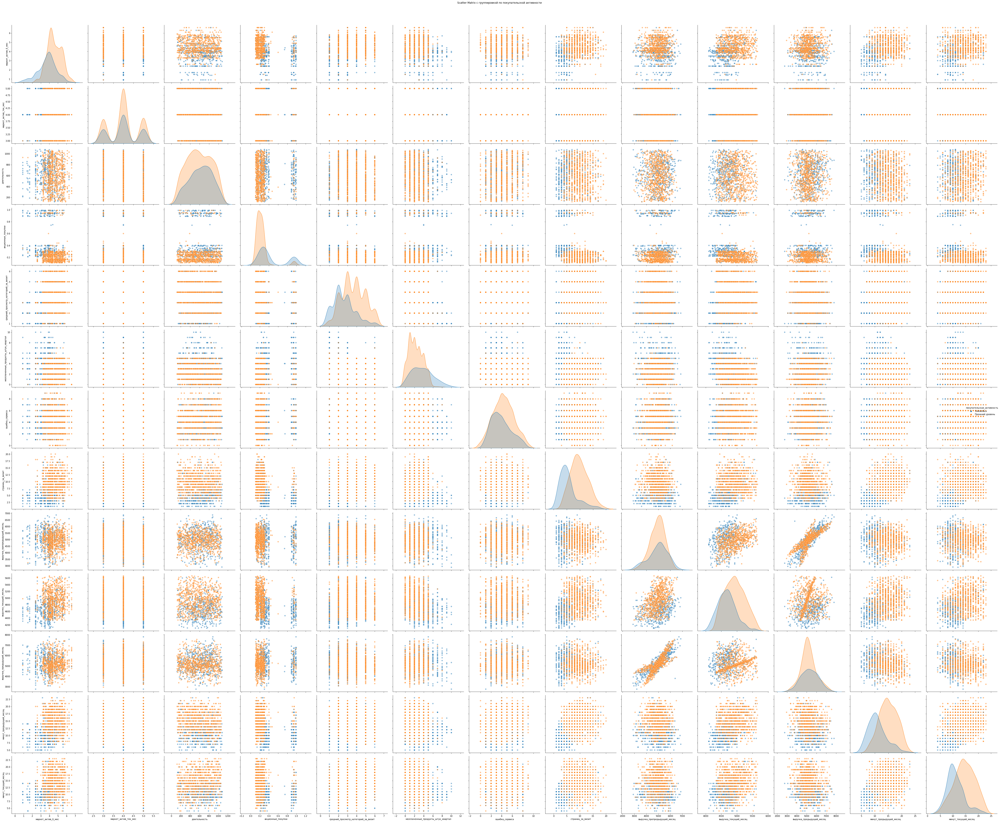

,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
маркет_актив_6_мес,1.00,0.06,-0.04,-0.24,0.20,-0.16,0.03,0.31,0.02,0.24,0.01,0.29,0.22
маркет_актив_тек_мес,0.06,1.00,-0.13,-0.01,-0.02,0.05,0.09,0.01,-0.03,-0.04,-0.02,0.01,-0.07
длительность,-0.04,-0.13,1.00,0.01,-0.05,-0.09,0.11,-0.04,0.01,-0.05,0.02,-0.12,0.09
акционные_покупки,-0.24,-0.01,0.01,1.00,-0.17,0.19,-0.02,-0.31,-0.00,-0.20,0.01,-0.27,-0.22
средний_просмотр_категорий_за_визит,0.20,-0.02,-0.05,-0.17,1.00,-0.27,0.01,0.24,-0.04,0.14,-0.07,0.14,0.23
неоплаченные_продукты_штук_квартал,-0.16,0.05,-0.09,0.19,-0.27,1.00,-0.09,-0.19,-0.01,-0.26,0.04,-0.18,-0.21
ошибка_сервиса,0.03,0.09,0.11,-0.02,0.01,-0.09,1.00,0.09,0.04,0.08,0.03,0.19,0.07
страниц_за_визит,0.31,0.01,-0.04,-0.31,0.24,-0.19,0.09,1.00,-0.04,0.29,-0.03,0.43,0.25
выручка_препредыдущий_месяц,0.02,-0.03,0.01,-0.00,-0.04,-0.01,0.04,-0.04,1.00,0.33,0.84,-0.07,-0.05
выручка_текущий_месяц,0.24,-0.04,-0.05,-0.20,0.14,-0.26,0.08,0.29,0.33,1.00,0.12,0.35,0.30


In [55]:
# Создаем pairplot с группировкой по 'покупательская_активность'
sns.pairplot(
    df_market[df_market.columns[df_market.columns != 'id']],
    hue='покупательская_активность',
    diag_kind='kde',  # тип диаграммы на диагонали
    plot_kws={'alpha': 0.5, 's': 40},  # настройки точек
    height=4,  # высота каждого подграфика
    aspect=1.2  # соотношение сторон
)

# Дополнительные настройки визуализации
plt.suptitle('Scatter Matrix с группировкой по покупательской активности', y=1.02)
plt.tight_layout()
plt.show()

# Корреляционная матрица
corr = df_market.corr()
display(corr)

In [56]:
# pd.plotting.scatter_matrix(
#     df_market[df_market.columns[df_market.columns != 'id']], 
#     figsize=(15, 15),          
#     diagonal='kde',            
#     alpha=0.5,                 
#     color='blue',              
#     s=40
# )

# # Поворот подписей
# for ax in plt.gcf().get_axes():
#     ax.tick_params(axis='x', rotation=90)
#     ax.tick_params(axis='y', rotation=0)

# plt.tight_layout()
# plt.show()

In [57]:
# # Создаем фигуру с увеличенным размером
# plt.figure(figsize=(15, 8))  # Ширина и высота в дюймах
# # Добавляем название графика
# plt.title('Матрица корреляции (Спирман)', fontsize=16)

# sns.heatmap(df_market.corr(method='spearman'), annot=True, cmap='cividis') 

# plt.show()

Мультиколлинераность не обнаружена

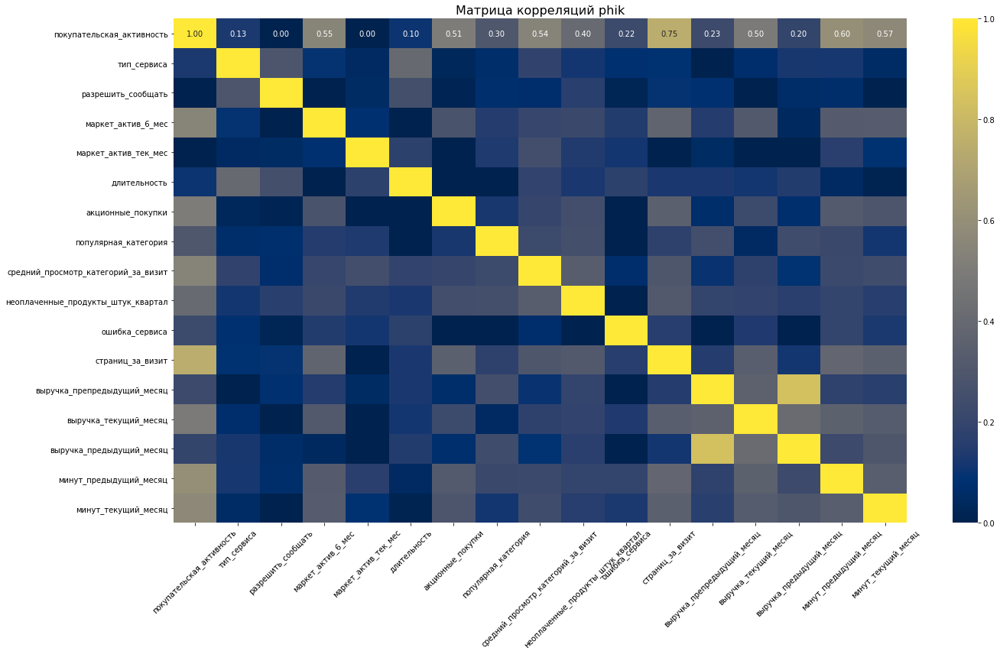

In [58]:
# Определяем список непрерывных признаков
interval_columns = [
    'маркет_актив_6_мес',
    'длительность',
    'акционные_покупки',
    'выручка_препредыдущий_месяц',
    'выручка_предыдущий_месяц',
    'выручка_текущий_месяц'
]

# Вычисляем матрицу корреляций phik
phik_matrix = df_market.phik_matrix(interval_cols=interval_columns)

# Визуализация результатов
plt.figure(figsize=(20, 12))  # Увеличиваем размер для лучшей читаемости
plt.title('Матрица корреляций phik', fontsize=16)

# Настраиваем тепловую карту
sns.heatmap(
    phik_matrix,
    annot=True,
    cmap='cividis',
    fmt='.2f',  # Оставляем 2 знака после запятой
    vmin=0,     # Минимальное значение корреляции
    vmax=1      # Максимальное значение корреляции
)

plt.xticks(rotation=45)  # Поворачиваем подписи по оси X
plt.yticks(rotation=0)   # Оставляем вертикальные подписи по оси Y
plt.tight_layout()       # Автоматически настраиваем отступы
plt.show()

Мультиколлинераность не обнаружена

функция для корреляции

In [59]:
def corr_scater_plot(df,name_column_1,name_column_2):
    # Создаем фигуру
    plt.figure(figsize=(15, 8))

    # Создаем scatter plot с цветовой кодировкой
    sns.scatterplot(
        data=df,
        x=name_column_2,
        y=name_column_1,
#         hue='Порода',  # добавляем цветовую кодировку
        alpha=0.5,
        palette='viridis'
    )

    # Дополнительные настройки
    plt.title('Диаграмма рассеивания', fontsize=16)
    plt.xlabel(name_column_2, fontsize=14)
    plt.ylabel(name_column_1, fontsize=14)
    plt.legend(title='подпись', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tick_params(axis='both', labelsize=12)
    plt.tight_layout()

    print(f'Коэфициент корреляции Пирсона между {name_column_1} / {name_column_2}: ', df[name_column_1].corr(df[name_column_2]))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Коэфициент корреляции Пирсона между выручка_текущий_месяц / минут_текущий_месяц:  0.29968717197470385


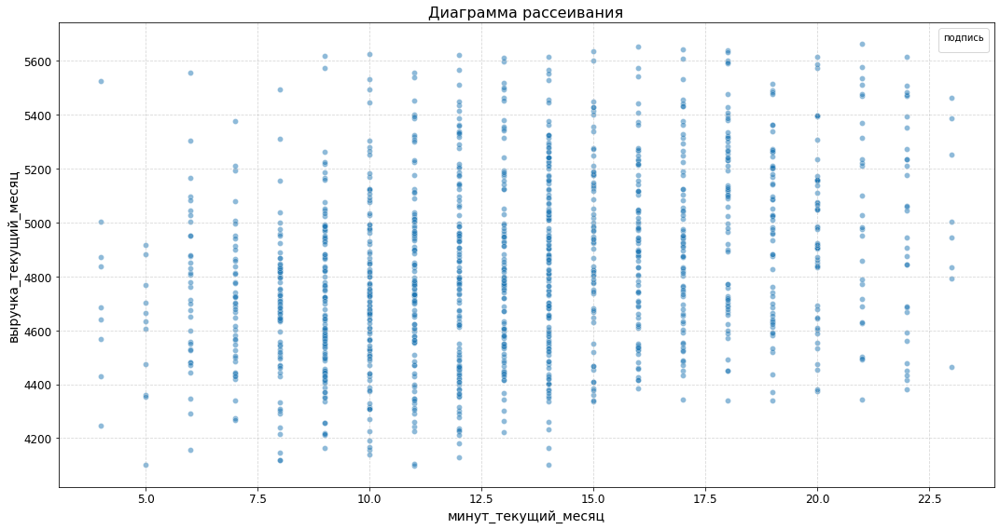

In [60]:
corr_scater_plot(df_market[df_market['выручка_текущий_месяц'] != 0], 'выручка_текущий_месяц', 'минут_текущий_месяц')

## Шаг 6. Использование пайплайнов

Примените все изученные модели. Для этого используйте пайплайны.

создади отдельную переменную для МО

In [61]:
df_market_mo = df_market

In [62]:
df_market_mo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1297 entries, 215349 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   покупательская_активность            1297 non-null   object 
 1   тип_сервиса                          1297 non-null   object 
 2   разрешить_сообщать                   1297 non-null   object 
 3   маркет_актив_6_мес                   1297 non-null   float64
 4   маркет_актив_тек_мес                 1297 non-null   int64  
 5   длительность                         1297 non-null   int64  
 6   акционные_покупки                    1297 non-null   float64
 7   популярная_категория                 1297 non-null   object 
 8   средний_просмотр_категорий_за_визит  1297 non-null   int64  
 9   неоплаченные_продукты_штук_квартал   1297 non-null   int64  
 10  ошибка_сервиса                       1297 non-null   int64  
 11  страниц_за_визит       

In [63]:
df_market_mo['тип_сервиса'].unique()

array(['премиум', 'стандарт'], dtype=object)

In [64]:
df_market_mo['покупательская_активность'].unique()

array(['Снизилась', 'Прежний уровень'], dtype=object)

In [65]:
df_market_mo['разрешить_сообщать'].unique()

array(['да', 'нет'], dtype=object)

In [66]:
df_market_mo['популярная_категория'].unique()

array(['Товары для детей', 'Домашний текстиль', 'Косметика и аксесуары',
       'Кухонная посуда', 'Техника для красоты и здоровья',
       'Мелкая бытовая техника и электроника'], dtype=object)

In [67]:
df_market_mo['выручка_предыдущий_месяц'].isna()

id
215349    False
215350    False
215351    False
215352    False
215353    False
          ...  
216643    False
216644    False
216645    False
216646    False
216647    False
Name: выручка_предыдущий_месяц, Length: 1297, dtype: bool

In [68]:
null_rows = df_market_mo[df_market_mo['выручка_предыдущий_месяц'].isna()]
print("Строки с пропущенными значениями:")
display(null_rows)

Строки с пропущенными значениями:


,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
id,,,,,,,,,,,,,,,,,
215380,Снизилась,премиум,нет,1.70,4,637,0.94,Техника для красоты и здоровья,3,2,4,7,6077.00,5051.00,NaN,12,14


одно значение с пустой выручкой, необходимо удалить значение, т.к. по условию задачи должны быть не нулевая выручка

In [69]:
# Удаляем строку с пропущенным значением
df_market_mo = df_market_mo.dropna(subset=['выручка_предыдущий_месяц'])

In [70]:
null_rows = df_market_mo[df_market_mo['выручка_предыдущий_месяц'].isna()]
print("Строки с пропущенными значениями:")
display(null_rows)

Строки с пропущенными значениями:


,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
id,,,,,,,,,,,,,,,,,


### 6.1 Во время подготовки данных используйте ColumnTransformer. Количественные и категориальные признаки обработайте в пайплайне раздельно. Для кодирования категориальных признаков используйте как минимум два кодировщика, для масштабирования количественных — как минимум два скейлера.

* Напоминаем, что для каждой модели можно подготовить данные с разным кодированием и масштабированием.

In [71]:
RANDOM_STATE = 42
TEST_SIZE = 0.25

X_train, X_test, y_train, y_test = train_test_split(
    df_market_mo.drop(
        [
             'покупательская_активность'
        ], 
        axis=1
    ),
    df_market_mo['покупательская_активность'],
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE,
    stratify = df_market_mo['покупательская_активность']
)


In [72]:
# создаём списки с названиями признаков
ohe_columns = [
    'популярная_категория'
]
ord_columns = [
    'тип_сервиса', 'разрешить_сообщать'
]

In [73]:
df_market_mo['разрешить_сообщать'].unique() 

array(['да', 'нет'], dtype=object)

In [74]:
num_columns = ['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
                      'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал',
                      'ошибка_сервиса', 'страниц_за_визит',
                      'выручка_препредыдущий_месяц', 'выручка_текущий_месяц', 'выручка_предыдущий_месяц', 
                       'минут_предыдущий_месяц', 'минут_текущий_месяц']

In [75]:
# берем код из уроков по пайплайнам

# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe', 
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ohe', 
            OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
        )
    ]
)

# ohe_pipe = Pipeline(
#     [
#         (
#             'simpleImputer_ohe', 
#             SimpleImputer(missing_values=np.nan, strategy='most_frequent')
#         ),
#         (
#             'ohe', 
#             OneHotEncoder(drop='first', sparse=False)  # Убрали handle_unknown
#         )
#     ]
# )

# cоздаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE

In [76]:
ord_pipe = Pipeline(
    [
        (
            'simpleImputer_before_ord', 
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ord',
            OrdinalEncoder(
                categories=[
                    ['премиум', 'стандарт'],
                    ['да', 'нет']             # новое поле 'разрешить_сообщать'
                ], 
                handle_unknown='use_encoded_value',
                unknown_value=np.nan
            )
        ),
        (
            'simpleImputer_after_ord', 
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        )
    ]
)

data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),  # Пайплайн для категориальных признаков
        ('ord', ord_pipe, ord_columns),  # Пайплайн для порядковых признаков
        ('num', MinMaxScaler(), num_columns) 
    ], 
    remainder='passthrough'
)
print(data_preprocessor)

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['популярная_категория']),
                                ('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                                  Or...
                                 ['тип_сервиса', 'разрешит

Мы объединили все запланированные шаги подготовки данных в один пайплайн. 

### 6.2 Обучите четыре модели: KNeighborsClassifier(), DecisionTreeClassifier(), LogisticRegression() и  SVC(). Для каждой из них подберите как минимум один гиперпараметр. Выберите подходящую для задачи метрику, аргументируйте свой выбор. Используйте эту метрику при подборе гиперпараметров.

In [77]:
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])

In [ ]:
param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 10), #параметры из примеров
        'models__max_features': range(2, 10), #параметры из примеров
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    },
    
    # # словарь для модели KNeighborsClassifier() 
    # {
    #     'models': [KNeighborsClassifier()],
    #     'models__n_neighbors': range(2, 5), #параметры из примеров
    #     'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']   
    # },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE, 
            solver='liblinear', 
            penalty='l1'
        )],
        'models__C': range(1, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    },
    
    {
        'models': [SVC(random_state=RANDOM_STATE, probability=True)],  # Установите probability=True для использования predict_proba
        'models__C': [0.1, 1, 20],  # Список значений параметра C
        'models__kernel': ['linear', 'rbf'],  # Список ядер
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    }
]

### 6.3 Выберите лучшую модель, используя заданную метрику. Для этого примените одну из стратегий:
* использовать пайплайны и инструменты подбора гиперпараметров для каждой модели отдельно, чтобы выбрать лучшую модель самостоятельно;
* использовать один общий пайплайн для всех моделей и инструмент подбора гиперпараметров, который вернёт вам лучшую модель.

**Выбор метрики для оценки моделей
Для задачи классификации покупательской активности наиболее подходящей метрикой является ROC-AUC по следующим причинам:

* Неравномерность классов: В задачах классификации покупательского поведения часто встречается дисбаланс классов (мало активных клиентов против большинства неактивных). ROC-AUC не чувствителен к дисбалансу классов.

* Порог классификации: Метрика позволяет оценить качество модели без привязки к конкретному порогу классификации, что важно при анализе вероятностей покупательской активности.

* Общая производительность: ROC-AUC показывает способность модели различать классы по всему диапазону порогов, что критично для бизнес-приложений.

* Интерпретируемость: Значение метрики легко интерпретировать:

    * 0.5 — случайное угадывание
    * 1.0 — идеальное разделение классов

In [79]:
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    cv=5,
    scoring='roc_auc',
    random_state=RANDOM_STATE,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train)

print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели по кросс валидации:', randomized_search.best_score_)

# проверьте работу модели на тестовой выборке
# рассчитайте прогноз на тестовых данных
y_test_pred_proba = randomized_search.predict_proba(X_test)

# Взять в качестве предсказания класс с наибольшей вероятностью
y_test_pred = y_test_pred_proba[:, 1]

# Рассчитать ROC-AUC на тестовой выборке
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(y_test, y_test_pred)}')

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
           

лучшая модель - ('models', SVC(C=10, probability=True, random_state=42))])

Модель SVC
Гиперпараметр С = 10

## Шаг 7. Анализ важности признаков

### 7.1 Оцените важность признаков для лучшей модели и постройте график важности с помощью метода SHAP.

SHAP
Однозначную оценку вклада признака в каждый прогноз показывают значения Шепли, их оценивают методом SHAP (SHapley Additive exPlanations). Он вычисляет, как отдельный признак помог присвоить модели итоговое значение целевого.

In [80]:
best_model = randomized_search.best_estimator_.named_steps['models']

preprocessor = randomized_search.best_estimator_.named_steps['preprocessor']

X_train_processed = preprocessor.transform(X_train)

explainer = shap.Explainer(best_model.predict_proba, X_train_processed) 

shap_values = explainer(X_train_processed)

PermutationExplainer explainer: 973it [13:50,  1.16it/s]                         


In [81]:
# Получаем имена признаков после препроцессинга
feature_names = []

# Для OHE признаков
if 'ohe' in preprocessor.named_transformers_:
    ohe_transformer = preprocessor.named_transformers_['ohe']
    if hasattr(ohe_transformer, 'named_steps') and 'ohe' in ohe_transformer.named_steps:
        ohe_encoder = ohe_transformer.named_steps['ohe']
        ohe_feature_names = ohe_encoder.get_feature_names_out(ohe_columns)
        feature_names.extend(ohe_feature_names)

# Для порядковых признаков
if 'ord' in preprocessor.named_transformers_:
    feature_names.extend(ord_columns)

# Для числовых признаков
feature_names.extend(num_columns)



In [82]:
print(f"Количество классов: {shap_values.shape[-1]}")
print(f"Размерность shap_values: {shap_values.shape}")

Количество классов: 2
Размерность shap_values: (972, 20, 2)


In [83]:
# Узнаем общее количество признаков
print(f"Всего признаков: {len(feature_names)}")
print(f"Размерность SHAP значений: {shap_values.shape}")

# Выведем все имена признаков
for i, name in enumerate(feature_names):
    print(f"{i}: {name}")

Всего признаков: 20
Размерность SHAP значений: (972, 20, 2)
0: популярная_категория_Косметика и аксесуары
1: популярная_категория_Кухонная посуда
2: популярная_категория_Мелкая бытовая техника и электроника
3: популярная_категория_Техника для красоты и здоровья
4: популярная_категория_Товары для детей
5: тип_сервиса
6: разрешить_сообщать
7: маркет_актив_6_мес
8: маркет_актив_тек_мес
9: длительность
10: акционные_покупки
11: средний_просмотр_категорий_за_визит
12: неоплаченные_продукты_штук_квартал
13: ошибка_сервиса
14: страниц_за_визит
15: выручка_препредыдущий_месяц
16: выручка_текущий_месяц
17: выручка_предыдущий_месяц
18: минут_предыдущий_месяц
19: минут_текущий_месяц


/tmp/ipykernel_183/960176122.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap_plot = shap.summary_plot(


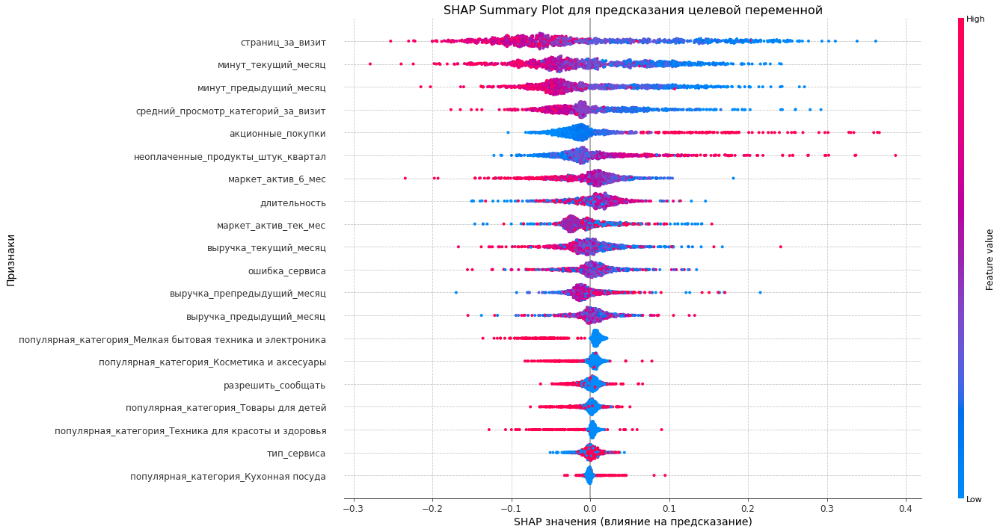

<Figure size 432x288 with 0 Axes>

In [84]:
# Создаем график SHAP с отключением автоматического отображения
shap_plot = shap.summary_plot(
    shap_values[:,:,1], 
    X_train_processed,
    feature_names=feature_names,
    plot_size=(20, 10),
    show=False  # отображение
)

# Получаем текущий объект оси
ax = plt.gca()

# Добавляем кастомизацию графика
plt.title('SHAP Summary Plot для предсказания целевой переменной', fontsize=16)
plt.xlabel('SHAP значения (влияние на предсказание)', fontsize=14)
plt.ylabel('Признаки', fontsize=14)

# Дополнительные настройки визуализации
ax.tick_params(axis='both', which='major', labelsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Обновляем параметры отображения
plt.tight_layout()
plt.show()  # Теперь показываем график один раз

# Сохраняем график (опционально)
plt.savefig('shap_summary_plot.png', dpi=300)

In [85]:
# shap.summary_plot(shap_values[:,:,1], X_train_processed, 
#                   feature_names=feature_names, plot_size=(20, 10))

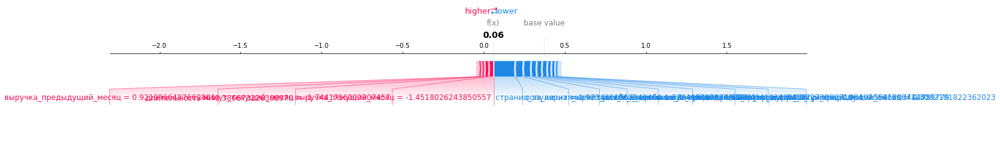

In [86]:
# 3. Force plot для одного наблюдения
shap.plots.force(shap_values[0,:,1], feature_names=feature_names, matplotlib=True)

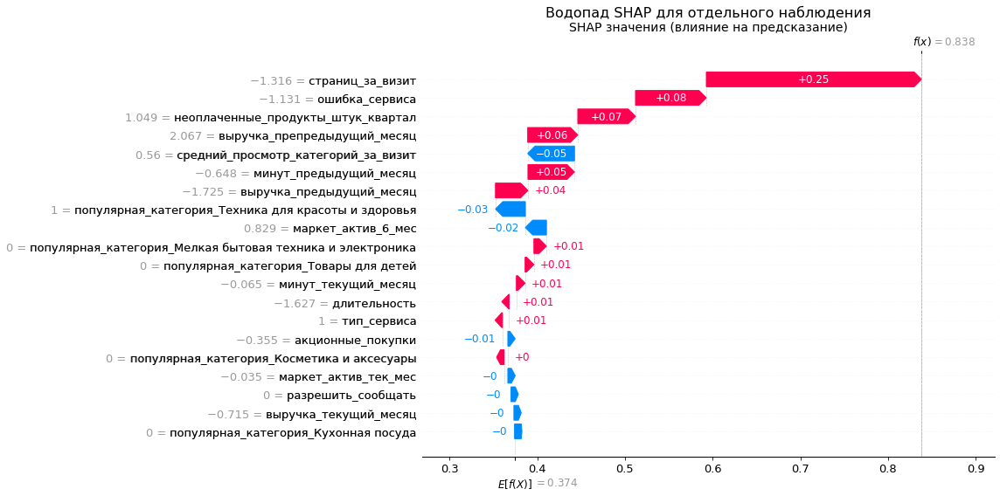

<Figure size 432x288 with 0 Axes>

In [87]:

# Создаем объяснение SHAP
shap_exp = shap.Explanation(
    values=shap_values[:,:,1].values,
    base_values=shap_values[:,:,1].base_values,
    data=X_train_processed,
    feature_names=feature_names
)

# Создаем фигуру большего размера
plt.figure(figsize=(16, 8))

# Устанавливаем текущие оси
plt.sca(plt.gca())

# Строим водопад с отключенным автоматическим отображением
shap.plots.waterfall(
    shap_exp[1], 
    max_display=20,
    show=False
)

# Добавляем заголовок
plt.title('Водопад SHAP для отдельного наблюдения', fontsize=16)

# Добавляем подписи осей
plt.xlabel('SHAP значения (влияние на предсказание)', fontsize=14)
plt.gca().set_ylabel('Признаки', fontsize=14)  # Используем set_ylabel()

# Дополнительные настройки визуализации
plt.gca().tick_params(axis='both', which='major', labelsize=12)
plt.gca().grid(True, linestyle='--', alpha=0.7)

# Корректируем размер
plt.gcf().set_size_inches(16, 8)

plt.tight_layout()
plt.show()

# Сохранение графика
plt.savefig('shap_waterfall_plot.png', dpi=300)


In [88]:
# shap_exp = shap.Explanation(
#     values=shap_values[:,:,1].values,
#     base_values=shap_values[:,:,1].base_values,
#     data=X_train_processed,
#     feature_names=feature_names  # имена задаются здесь
# )
# shap.plots.waterfall(shap_exp[1], max_display=20)

/tmp/ipykernel_183/2859304866.py:5: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:,:,1],


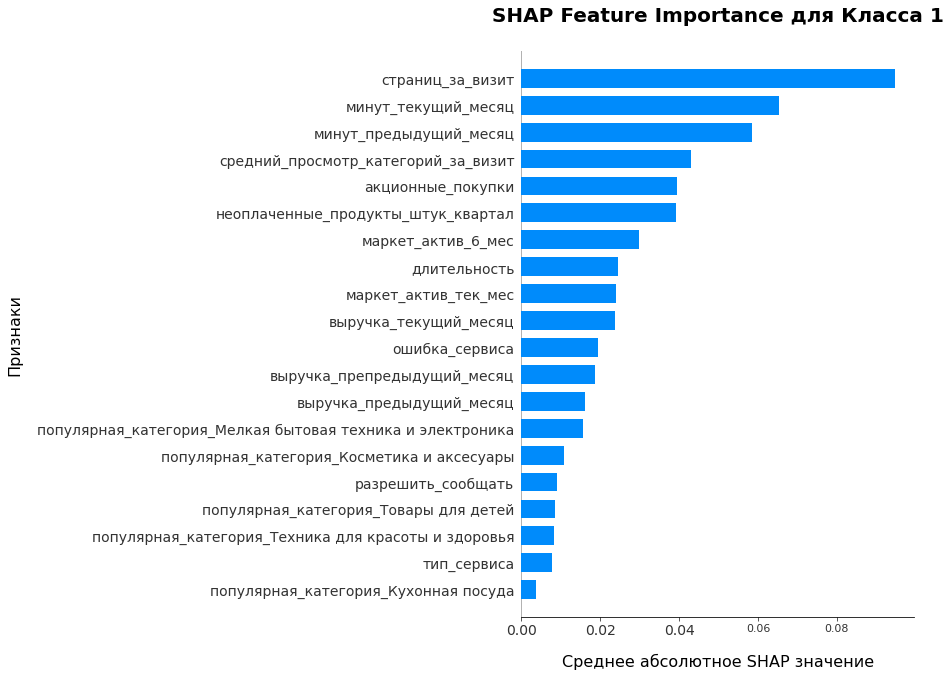

In [89]:
# Увеличиваем размер фигуры и настраиваем соотношение сторон
plt.figure(figsize=(25, 15))  # Увеличиваем ширину и высоту

# Строим SHAP bar plot
shap.summary_plot(shap_values[:,:,1], 
                  X_train_processed, 
                  feature_names=feature_names, 
                  plot_type="bar", 
                  show=False,
                  max_display=20)  # Ограничиваем количество признаков для лучшей читаемости

# Кастомизация графика
plt.title("SHAP Feature Importance для Класса 1", 
          fontsize=20, fontweight='bold', pad=30)
plt.xlabel("Среднее абсолютное SHAP значение", fontsize=16, labelpad=15)
plt.ylabel("Признаки", fontsize=16, labelpad=15)

# Увеличиваем размер шрифта подписей
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Добавляем сетку
# plt.grid(axis='x', alpha=0.3, linestyle='--')
# plt.grid(axis='y', alpha=0.3, linestyle='--')

# Увеличиваем отступы и делаем график более широким
plt.tight_layout()
plt.subplots_adjust(left=0.3)  # Увеличиваем левый отступ для длинных названий признаков
plt.show()

In [90]:
# plt.figure(figsize=(30, 20))
# shap.summary_plot(shap_values[:,:,1], X_train_processed, 
#                   feature_names=feature_names, plot_type="bar", show=False)
# plt.title("SHAP Feature Importance", fontsize=20)
# plt.xlabel("SHAP значения (влияние на предсказание)", fontsize=20)
# plt.ylabel("Важность признаков", fontsize=20)
# plt.tight_layout()
# plt.show()


In [91]:
X_train.columns

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_препредыдущий_месяц',
       'выручка_текущий_месяц', 'выручка_предыдущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц'],
      dtype='object')

### 7.2 Сделайте выводы о значимости признаков:
* какие признаки мало значимы для модели;
* какие признаки сильнее всего влияют на целевой признак;
* как можно использовать эти наблюдения при моделировании и принятии бизнес-решений.

Ключевые выводы по анализу значимости признаков


1. Наиболее влиятельные признаки:

‘страниц_за_визит’ — главный драйвер предсказаний. Чем выше значение, тем ниже вероятность сохранения прежнего уровня покупательской активности.

‘минут_текущий_месяц’ — второе по значимости влияние. Увеличение времени, проведенного на сайте, также снижает вероятность сохранения активности.

‘минут_предыдущий_месяц’ — третий ключевой фактор. Высокие значения этого параметра повышают вероятность принадлежности к классу “Прежний уровень”.

2. Рекомендации для бизнеса:

Оптимизация пользовательского опыта:

Уменьшение числа страниц за визит (упрощение навигации) может повысить лояльность.

Сокращение времени сессий (например, за счет улучшения поиска) — потенциальный инструмент удержания клиентов.

Стратегия акционных кампаний:

Акционные покупки положительно коррелируют с сохранением активности. Целесообразно увеличить частоту и релевантность акций.

Малозначимые признаки:

Признаки с наименьшим вкладом в модель (например, “тип_сервиса”, “ популярная_категория”) могут быть исключены из финальной модели без существенной потери качества. Это упростит модель и сократит вычислительные ресурсы.

## Шаг 8. Сегментация покупателей

### 8.1 Выполните сегментацию покупателей. Используйте результаты моделирования и данные о прибыльности покупателей.

категория для Сегментации - Финансовое поведение

Реомендуется провести анализ по выручка за текущий и прошлые месяца

Для этого возьмём выборку - x_test - для ускорения работы

In [92]:
# len(X_test)

In [93]:
# len(X_train)

In [94]:
# y_test

In [95]:
# df_market.head()

In [ ]:
# df_money.head()

In [96]:
df_money.set_index('id', inplace=True)
df_market = df_market.join(df_money, how = 'inner')
df_market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,прибыль
id,,,,,,,,,,,,,,,,,,
215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5,5216.00,4472.00,4971.60,12,10,4.16
215350,Снизилась,стандарт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5,5457.50,4826.00,5058.40,8,13,3.13
215351,Снизилась,стандарт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4,6158.00,4793.00,6610.40,11,13,4.87
215352,Снизилась,стандарт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2,5807.50,4594.00,5872.50,8,11,4.21
215353,Снизилась,стандарт,да,3.30,4,762,0.26,Домашний текстиль,4,1,1,4,4738.50,5124.00,5388.50,10,10,3.95


In [97]:
X_test_segment = preprocessor.transform(X_test)
# X_test_segment = X_test.copy()
X_test_segment

array([[ 0.        ,  0.        ,  0.        , ..., -2.32046299,
         0.62405133,  0.89466847],
       [ 0.        ,  0.        ,  0.        , ..., -1.27157192,
        -0.64760044, -1.02448795],
       [ 0.        ,  0.        ,  0.        , ...,  1.30466638,
         1.64137274, -0.54469884],
       ...,
       [ 0.        ,  0.        ,  0.        , ..., -2.25537582,
        -0.13893973,  0.17498481],
       [ 1.        ,  0.        ,  0.        , ...,  1.45554487,
         0.11539062, -0.78459339],
       [ 0.        ,  1.        ,  0.        , ...,  0.57561867,
        -1.15626114, -0.54469884]])

In [98]:
predictions = best_model.predict_proba(X_test_segment)[:, 1]
predictions

array([0.02675018, 0.91957946, 0.72512504, 0.83816173, 0.22313468,
       0.15110944, 0.01049989, 0.03520464, 0.13780756, 0.02496672,
       0.66918252, 0.42071572, 0.98542818, 0.13146907, 0.07686109,
       0.03316025, 0.03618801, 0.04130822, 0.95535575, 0.04203725,
       0.04935345, 0.98358627, 0.84031641, 0.04377237, 0.05910546,
       0.15083399, 0.07964564, 0.22811703, 0.83526408, 0.01563746,
       0.0573899 , 0.12564224, 0.56726168, 0.02321428, 0.04077812,
       0.01027691, 0.4888024 , 0.06137356, 0.98938243, 0.11710917,
       0.12761158, 0.46631569, 0.18547282, 0.14575915, 0.64733355,
       0.10680027, 0.58186846, 0.96054141, 0.90295361, 0.03214186,
       0.39547276, 0.98487001, 0.68410389, 0.016949  , 0.0932574 ,
       0.94470013, 0.94897684, 0.97413188, 0.06723966, 0.07532752,
       0.98571262, 0.05856482, 0.92956759, 0.97378519, 0.67749501,
       0.07790645, 0.72595721, 0.18973471, 0.22452454, 0.58090348,
       0.0125591 , 0.05382426, 0.7497043 , 0.08508333, 0.27037

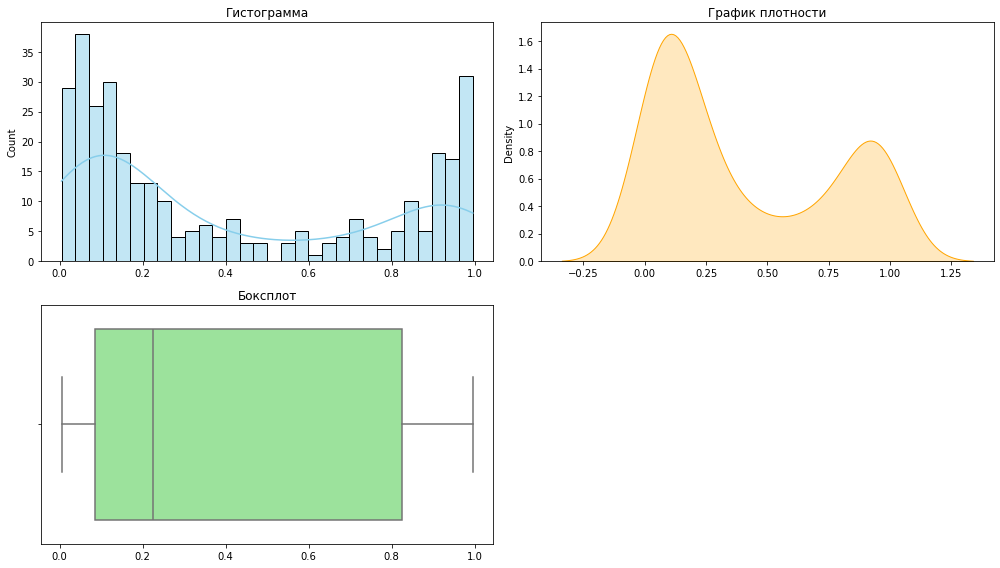

In [99]:
plt.figure(figsize=(14, 8))

# Создание сетки графиков
plt.subplot(2, 2, 1)
sns.histplot(predictions, kde=True, bins=30, color='skyblue')
plt.title('Гистограмма')

plt.subplot(2, 2, 2)
sns.kdeplot(predictions, fill=True, color='orange')
plt.title('График плотности')

plt.subplot(2, 2, 3)
sns.boxplot(x=predictions, color='lightgreen')
plt.title('Боксплот')

plt.tight_layout()
# plt.suptitle('Анализ распределения предсказанных вероятностей', fontsize=16)
plt.show()


На гистограмме видно, что распределение имеет два выраженных пика (бимодальное распределение)

In [100]:
segment_buyer = X_test.copy()
segment_buyer['предсказание_активности'] = predictions
display(segment_buyer)

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,предсказание_активности
id,,,,,,,,,,,,,,,,,
216161,стандарт,да,4.10,4,606,0.15,Техника для красоты и здоровья,6,1,4,12,3973.00,4912.00,3289.20,16,17,0.03
215654,премиум,нет,1.40,4,684,0.94,Товары для детей,3,6,1,6,3548.00,4656.00,4170.70,11,9,0.92
216307,премиум,да,3.30,4,488,0.13,Домашний текстиль,4,2,8,10,5444.00,4565.00,6335.80,20,11,0.73
215501,премиум,да,3.50,3,1057,0.35,Домашний текстиль,4,3,5,6,6604.00,4993.00,6758.70,9,9,0.84
215934,стандарт,нет,5.50,4,147,0.99,Мелкая бытовая техника и электроника,1,2,3,7,5090.00,4451.00,5773.80,15,18,0.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215429,премиум,нет,0.90,4,690,0.24,Домашний текстиль,2,5,7,4,3662.00,4488.00,4158.60,11,10,0.65
216233,премиум,да,3.90,4,1048,0.21,Техника для красоты и здоровья,3,0,6,14,4325.00,4553.00,4257.40,15,17,0.26
215716,стандарт,да,2.40,4,952,0.30,Техника для красоты и здоровья,3,5,2,3,3067.00,4165.00,3343.90,13,14,0.67


In [101]:
segment_buyer['сегмент'] = segment_buyer['предсказание_активности'].apply(
    lambda x: 'снизилась' if x > 0.7 else 'прежний_уровень'
)

In [102]:
segment_buyer = segment_buyer.join(df_money, how = 'inner')
segment_buyer

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,предсказание_активности,сегмент,прибыль
id,,,,,,,,,,,,,,,,,,,
216161,стандарт,да,4.10,4,606,0.15,Техника для красоты и здоровья,6,1,4,12,3973.00,4912.00,3289.20,16,17,0.03,прежний_уровень,4.69
215654,премиум,нет,1.40,4,684,0.94,Товары для детей,3,6,1,6,3548.00,4656.00,4170.70,11,9,0.92,снизилась,2.75
216307,премиум,да,3.30,4,488,0.13,Домашний текстиль,4,2,8,10,5444.00,4565.00,6335.80,20,11,0.73,снизилась,3.16
215501,премиум,да,3.50,3,1057,0.35,Домашний текстиль,4,3,5,6,6604.00,4993.00,6758.70,9,9,0.84,снизилась,3.74
215934,стандарт,нет,5.50,4,147,0.99,Мелкая бытовая техника и электроника,1,2,3,7,5090.00,4451.00,5773.80,15,18,0.22,прежний_уровень,4.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215429,премиум,нет,0.90,4,690,0.24,Домашний текстиль,2,5,7,4,3662.00,4488.00,4158.60,11,10,0.65,прежний_уровень,3.71
216233,премиум,да,3.90,4,1048,0.21,Техника для красоты и здоровья,3,0,6,14,4325.00,4553.00,4257.40,15,17,0.26,прежний_уровень,4.62
215716,стандарт,да,2.40,4,952,0.30,Техника для красоты и здоровья,3,5,2,3,3067.00,4165.00,3343.90,13,14,0.67,прежний_уровень,4.07


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Коэфициент корреляции Пирсона между предсказание_активности / прибыль:  0.03597230198765006


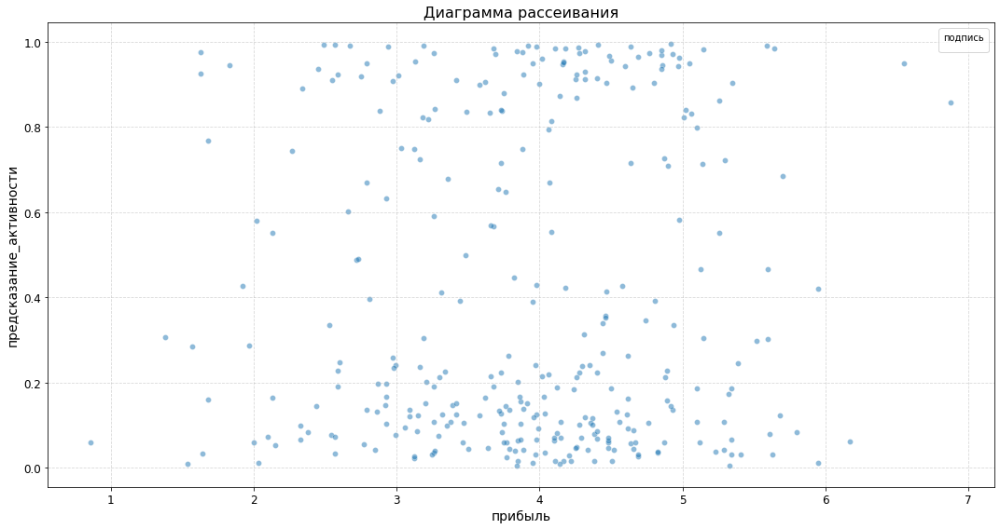

In [103]:
corr_scater_plot(segment_buyer, 'предсказание_активности', 'прибыль')

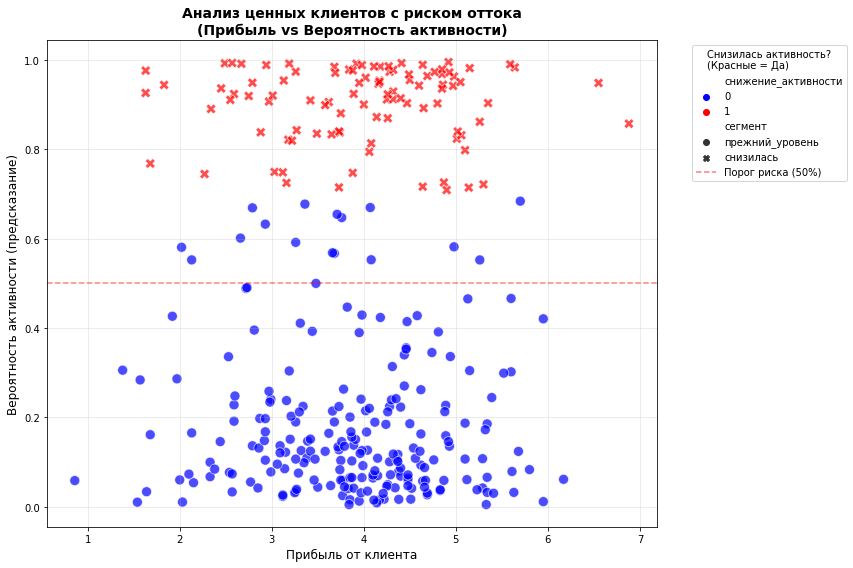

In [104]:

# Создадим бинарную метку для "снижения активности" для цветового кодирования
segment_buyer['снижение_активности'] = (segment_buyer['сегмент'] == 'снизилась').astype(int)

# Создадим диаграмму рассеяния
plt.figure(figsize=(12, 8))

# Используем seaborn для более красивого графика
scatter = sns.scatterplot(
    data=segment_buyer,
    x='прибыль',
    y='предсказание_активности',
    hue='снижение_активности',
    style='сегмент', # Дополнительное разделение по форме точки
    palette=['blue', 'red'],
    s=100, # Размер точек
    alpha=0.7
)

plt.title('Анализ ценных клиентов с риском оттока\n(Прибыль vs Вероятность активности)', fontsize=14, fontweight='bold')
plt.xlabel('Прибыль от клиента', fontsize=12)
plt.ylabel('Вероятность активности (предсказание)', fontsize=12)
plt.axhline(y=0.5, color='red', linestyle='--', alpha=0.5, label='Порог риска (50%)')
plt.legend(title='Снизилась активность?\n(Красные = Да)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [105]:
# Вычислим квартили прибыли, чтобы определить "ценных" клиентов
profit_75 = segment_buyer['прибыль'].quantile(0.75)
print(f"75-й перцентиль по прибыли: {profit_75:.2f}")

activity_threshold = 0.5

# Посмотрим на статистику по клиентам в "опасной зоне"
high_value_at_risk = segment_buyer[
    (segment_buyer['прибыль'] >= profit_75) & 
    (segment_buyer['предсказание_активности'] >= activity_threshold)
#     (segment_buyer['предсказание_активности'] <= activity_threshold)
]
display(high_value_at_risk.head())

print(f"Количество клиентов в зоне высокого риска: {len(high_value_at_risk)}")
print(f"Доля от общего числа: {len(high_value_at_risk) / len(segment_buyer) * 100:.1f}%")

if len(high_value_at_risk) > 0:
    print("\nСтатистика по 'опасной зоне':")
    print(f"Средняя прибыль: {high_value_at_risk['прибыль'].mean():.2f}")
    print(f"Средняя вероятность активности: {high_value_at_risk['предсказание_активности'].mean():.2f}")

75-й перцентиль по прибыли: 4.58


,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,предсказание_активности,сегмент,прибыль,снижение_активности
id,,,,,,,,,,,,,,,,,,,,
215484,премиум,нет,2.90,5,448,0.23,Товары для детей,4,2,6,3,5059.00,4267.00,5018.70,5,7,0.98,снизилась,5.64,1
215496,премиум,да,4.00,4,684,0.40,Техника для красоты и здоровья,1,6,2,4,5020.00,4896.00,5237.10,11,11,0.99,снизилась,4.64,1
215769,стандарт,нет,3.60,3,553,0.23,Домашний текстиль,5,3,3,10,4976.50,4495.00,5523.80,12,9,0.58,прежний_уровень,4.98,0
215737,стандарт,да,0.90,4,225,0.36,Косметика и аксесуары,2,4,2,3,5126.00,4679.00,5291.10,9,10,0.90,снизилась,4.80,1
215390,стандарт,да,3.10,4,152,0.33,Косметика и аксесуары,6,4,2,5,4254.00,4549.00,4612.80,8,12,0.68,прежний_уровень,5.70,0


Количество клиентов в зоне высокого риска: 34
Доля от общего числа: 10.5%

Статистика по 'опасной зоне':
Средняя прибыль: 5.11
Средняя вероятность активности: 0.87


In [106]:
# Анализ характеристик целевой группы
if len(high_value_at_risk) > 0:
    print("ХАРАКТЕРИСТИКИ ЦЕЛЕВОГО СЕГМЕНТА:")
    print("="*50)
    
    # Тип сервиса
    print("\nРаспределение по типу сервиса:")
    print(high_value_at_risk['тип_сервиса'].value_counts(normalize=True))
    
    # Маркетинговая активность
    print(f"\nМаркетинговая активность (6 мес): {high_value_at_risk['маркет_актив_6_мес'].median():.1f}")
    print(f"Маркетинговая активность (тек. мес): {high_value_at_risk['маркет_актив_тек_мес'].median():.0f}")
    
    
    # Популярные категории
    print("\nТоп-5 популярные категории:")
    print(high_value_at_risk['популярная_категория'].value_counts().head())


ХАРАКТЕРИСТИКИ ЦЕЛЕВОГО СЕГМЕНТА:

Распределение по типу сервиса:
стандарт   0.65
премиум    0.35
Name: тип_сервиса, dtype: float64

Маркетинговая активность (6 мес): 3.5
Маркетинговая активность (тек. мес): 4

Топ-5 популярные категории:
Товары для детей                  9
Домашний текстиль                 9
Косметика и аксесуары             8
Кухонная посуда                   3
Техника для красоты и здоровья    3
Name: популярная_категория, dtype: int64


In [107]:

print(f"РАЗМЕР ЦЕЛЕВОГО СЕГМЕНТА ДЛЯ УДЕРЖАНИЯ: {len(high_value_at_risk)} клиентов")
print(f"Доля от общей базы: {len(high_value_at_risk) / len(segment_buyer) * 100:.1f}%")


РАЗМЕР ЦЕЛЕВОГО СЕГМЕНТА ДЛЯ УДЕРЖАНИЯ: 34 клиентов
Доля от общей базы: 10.5%


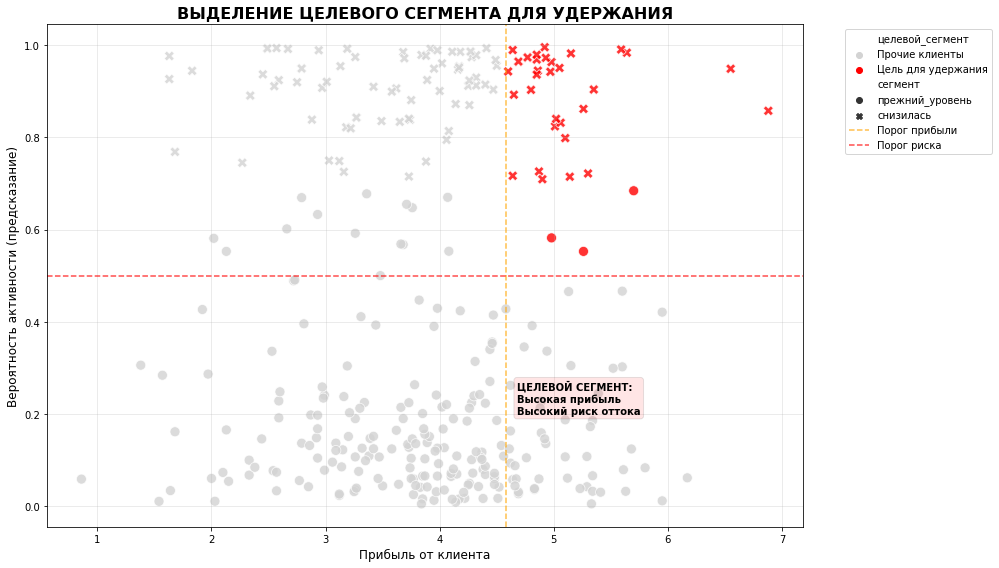

In [108]:
# Финальная визуализация с выделением целевого сегмента
plt.figure(figsize=(14, 8))

# Создаем столбец для выделения целевого сегмента
segment_buyer['целевой_сегмент'] = 'Прочие клиенты'
segment_buyer.loc[high_value_at_risk.index, 'целевой_сегмент'] = 'Цель для удержания'

# Диаграмма рассеяния с выделением целевой группы
scatter = sns.scatterplot(
    data=segment_buyer,
    x='прибыль',
    y='предсказание_активности',
    hue='целевой_сегмент',
    style='сегмент',
    palette={'Цель для удержания': 'red', 'Прочие клиенты': 'lightgray'},
    s=100,
    alpha=0.8
)

# Добавляем линии порогов
plt.axvline(x=profit_75, color='orange', linestyle='--', alpha=0.7, label='Порог прибыли')
plt.axhline(y=activity_threshold, color='red', linestyle='--', alpha=0.7, label='Порог риска')

plt.title('ВЫДЕЛЕНИЕ ЦЕЛЕВОГО СЕГМЕНТА ДЛЯ УДЕРЖАНИЯ', fontsize=16, fontweight='bold')
plt.xlabel('Прибыль от клиента', fontsize=12)
plt.ylabel('Вероятность активности (предсказание)', fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

# Аннотируем целевой сегмент
plt.text(
    profit_75 * 1.02, 
    activity_threshold * 0.4, 
    'ЦЕЛЕВОЙ СЕГМЕНТ:\nВысокая прибыль\nВысокий риск оттока', 
    bbox=dict(boxstyle="round,pad=0.3", facecolor="red", alpha=0.1),
    fontweight='bold'
)

plt.tight_layout()
plt.show()

Выделен целевой сегмент по порогу предсказания_активности больше 50% и Прибыли больше 75% от прибыли

* Топ-5 популярные категории:
- Товары для детей                  9
- Домашний текстиль                 9
- Косметика и аксесуары             8
- Кухонная посуда                   3
- Техника для красоты и здоровья    3



In [109]:
high_value_at_risk

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,предсказание_активности,сегмент,прибыль,снижение_активности
id,,,,,,,,,,,,,,,,,,,,
215484,премиум,нет,2.90,5,448,0.23,Товары для детей,4,2,6,3,5059.00,4267.00,5018.70,5,7,0.98,снизилась,5.64,1
215496,премиум,да,4.00,4,684,0.40,Техника для красоты и здоровья,1,6,2,4,5020.00,4896.00,5237.10,11,11,0.99,снизилась,4.64,1
215769,стандарт,нет,3.60,3,553,0.23,Домашний текстиль,5,3,3,10,4976.50,4495.00,5523.80,12,9,0.58,прежний_уровень,4.98,0
215737,стандарт,да,0.90,4,225,0.36,Косметика и аксесуары,2,4,2,3,5126.00,4679.00,5291.10,9,10,0.90,снизилась,4.80,1
215390,стандарт,да,3.10,4,152,0.33,Косметика и аксесуары,6,4,2,5,4254.00,4549.00,4612.80,8,12,0.68,прежний_уровень,5.70,0
215604,стандарт,нет,3.10,5,458,0.99,Косметика и аксесуары,1,5,3,4,4449.00,4308.00,4459.40,8,10,0.94,снизилась,4.86,1
215351,стандарт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4,6158.00,4793.00,6610.40,11,13,0.73,снизилась,4.87,1
215600,стандарт,да,2.40,4,446,0.29,Кухонная посуда,1,6,3,4,6134.00,4646.00,5781.70,13,14,0.89,снизилась,4.65,1
215473,стандарт,нет,4.10,3,336,0.22,Домашний текстиль,2,7,2,3,4246.50,4224.00,3987.80,8,13,0.96,снизилась,4.69,1


In [110]:
# df_sb = segment_buyer

# # Анализ финансового поведения по выделенным колонкам
# financial_columns = ['выручка_препредыдущий_месяц', 'выручка_предыдущий_месяц', 
#                     'выручка_текущий_месяц', 'прибыль', 'предсказание_активности']

# # Основные статистики по финансовым показателям
# print("=== ОСНОВНЫЕ СТАТИСТИКИ ПО ФИНАНСОВЫМ ПОКАЗАТЕЛЯМ ===")
# financial_stats = df_sb[financial_columns].describe()
# print(financial_stats)

In [111]:
# # Анализ динамики выручки по месяцам
# print("\n=== ДИНАМИКА ВЫРУЧКИ ===")
# revenue_columns = ['выручка_препредыдущий_месяц', 'выручка_предыдущий_месяц', 'выручка_текущий_месяц']
# revenue_trend = df_sb[revenue_columns].mean()
# print("Средняя выручка по месяцам:")
# print(revenue_trend)

# # Расчет изменения выручки
# df_sb['изменение_выручки_предыдущий'] = ((df_sb['выручка_предыдущий_месяц'] - df_sb['выручка_препредыдущий_месяц']) / df_sb['выручка_препредыдущий_месяц']) * 100
# df_sb['изменение_выручки_текущий'] = ((df_sb['выручка_текущий_месяц'] - df_sb['выручка_предыдущий_месяц']) / df_sb['выручка_предыдущий_месяц']) * 100

# print("\nИзменение выручки (%):")
# print(f"Среднее изменение предыдущий месяц: {df_sb['изменение_выручки_предыдущий'].mean():.2f}%")
# print(f"Среднее изменение текущий месяц: {df_sb['изменение_выручки_текущий'].mean():.2f}%")

In [112]:
# # Анализ по уровням предсказания активности
# print("\n=== АНАЛИЗ ПО УРОВНЯМ ПРЕДСКАЗАНИЯ АКТИВНОСТИ ===")

# # Создание сегментов по уровню предсказания активности
# df_sb['уровень_активности'] = pd.cut(df_sb['предсказание_активности'], 
#                                  bins=[0, 0.33, 0.66, 1],
#                                  labels=['низкая', 'средняя', 'высокая'])

# # Статистики по уровням активности
# activity_analysis = df_sb.groupby('уровень_активности')[financial_columns].agg(['mean', 'median', 'std', 'count'])
# print(activity_analysis)

In [113]:
# # Анализ прибыльности по уровням активности
# print("\n=== ПРИБЫЛЬНОСТЬ ПО УРОВНЯМ АКТИВНОСТИ ===")
# profit_by_activity = df_sb.groupby('уровень_активности')['прибыль'].agg(['mean', 'median', 'std'])
# print(profit_by_activity)

In [114]:
# # Анализ сегментов 
# if 'сегмент' in df.columns:
#     print("\n=== АНАЛИЗ ПО ПРЕДСКАЗАНИЮ ===")
#     segment_analysis = df_sb.groupby('сегмент')[financial_columns].mean()
#     display(segment_analysis)

# # Визуализации
# plt.style.use('seaborn-v0_8')
# fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# # 1. Распределение предсказания активности
# axes[0, 0].hist(df_sb['предсказание_активности'], bins=20, alpha=0.7, color='skyblue')
# axes[0, 0].set_title('Распределение предсказания активности')
# axes[0, 0].set_xlabel('Вероятность активности')
# axes[0, 0].set_ylabel('Количество пользователей')

# # 2. Динамика средней выручки по месяцам
# months = ['Препредыдущий', 'Предыдущий', 'Текущий']
# axes[0, 1].plot(months, revenue_trend.values, marker='o', linewidth=2)
# axes[0, 1].set_title('Динамика средней выручки по месяцам')
# axes[0, 1].set_ylabel('Средняя выручка')

# # 3. Прибыль по уровням активности
# df_sb.boxplot(column='прибыль', by='уровень_активности', ax=axes[1, 0])
# axes[1, 0].set_title('Распределение прибыли по уровням активности')

# # Дополнительный анализ: топ пользователей по прибыльности
# print("\n=== ТОП-10 ПОЛЬЗОВАТЕЛЕЙ ПО ПРИБЫЛЬНОСТИ ===")
# top_profit_users = df_sb.nlargest(10, 'прибыль')[['прибыль', 'предсказание_активности'] + revenue_columns]
# display(top_profit_users)

# print("\n=== ТОП-10 ПОЛЬЗОВАТЕЛЕЙ ПО ВЕРОЯТНОСТИ АКТИВНОСТИ ===")
# top_active_users = df_sb.nlargest(10, 'предсказание_активности')[['предсказание_активности', 'прибыль'] + revenue_columns]
# display(top_active_users)


In [115]:
# df_sb

In [116]:
# # Анализ разницы между месяцами
# print("=== ДЕТАЛЬНЫЙ АНАЛИЗ РАЗНИЦЫ МЕЖДУ МЕСЯЦАМИ ===")

# # Расчет абсолютных разниц
# df_sb['абс_разница_предыдущий_препредыдущий'] = df_sb['выручка_предыдущий_месяц'] - df_sb['выручка_препредыдущий_месяц']
# df_sb['абс_разница_текущий_предыдущий'] = df_sb['выручка_текущий_месяц'] - df_sb['выручка_предыдущий_месяц']
# # df_sb['абс_разница_текущий_препредыдущий'] = df_sb['выручка_текущий_месяц'] - df_sb['выручка_препредыдущий_месяц']

# # Расчет относительных разниц (%)
# df_sb['отн_разница_предыдущий_препредыдущий_%'] = ((df_sb['выручка_предыдущий_месяц'] - df_sb['выручка_препредыдущий_месяц']) / df_sb['выручка_препредыдущий_месяц']) * 100
# df_sb['отн_разница_текущий_предыдущий_%'] = ((df_sb['выручка_текущий_месяц'] - df_sb['выручка_предыдущий_месяц']) / df_sb['выручка_предыдущий_месяц']) * 100
# # df_sb['отн_разница_текущий_препредыдущий_%'] = ((df_sb['выручка_текущий_месяц'] - df_sb['выручка_препредыдущий_месяц']) / df_sb['выручка_препредыдущий_месяц']) * 100

# # Создаем список колонок с разницами
# diff_columns_abs = ['абс_разница_предыдущий_препредыдущий', 'абс_разница_текущий_предыдущий']
# diff_columns_rel = ['отн_разница_предыдущий_препредыдущий_%', 'отн_разница_текущий_предыдущий_%']

# # 3. Базовая статистика по разницам
# print("\n=== СТАТИСТИКА ПО АБСОЛЮТНЫМ РАЗНИЦАМ ===")
# abs_diff_stats = df_sb[diff_columns_abs].describe()
# print(abs_diff_stats)

# print("\n=== СТАТИСТИКА ПО ОТНОСИТЕЛЬНЫМ РАЗНИЦАМ (%) ===")
# rel_diff_stats = df_sb[diff_columns_rel].describe()
# print(rel_diff_stats)

# # 4. Анализ направленности изменений
# print("\n=== НАПРАВЛЕННОСТЬ ИЗМЕНЕНИЙ ===")

# # Для абсолютных разниц
# for col in diff_columns_abs:
#     positive = (df_sb[col] > 0).sum()
#     negative = (df_sb[col] < 0).sum()
#     zero = (df_sb[col] == 0).sum()
#     total = len(df_sb)
    
#     print(f"\n{col}:")
#     print(f"  Рост: {positive} ({positive/total*100:.1f}%)")
#     print(f"  Снижение: {negative} ({negative/total*100:.1f}%)")
#     print(f"  Без изменений: {zero} ({zero/total*100:.1f}%)")

In [117]:
# # Анализ по уровням активности
# print("\n=== РАЗНИЦЫ ПО УРОВНЯМ АКТИВНОСТИ ===")

# if 'уровень_активности' not in df_sb.columns:
#     df_sb['уровень_активности'] = pd.cut(df_sb['предсказание_активности'], 
#                                      bins=[0, 0.33, 0.66, 1],
#                                      labels=['низкая', 'средняя', 'высокая'])

# activity_diff_analysis = df_sb.groupby('уровень_активности')[diff_columns_abs + diff_columns_rel].mean()
# activity_diff_analysis


In [118]:
# # Анализ экстремальных изменений
# print("\n=== ЭКСТРЕМАЛЬНЫЕ ИЗМЕНЕНИЯ ===")

# # Определяем пороги для экстремальных изменений (верхние и нижние 10%)
# for col in diff_columns_rel:
#     upper_threshold = df_sb[col].quantile(0.9)
#     lower_threshold = df_sb[col].quantile(0.1)
    
#     extreme_growth = df_sb[df_sb[col] >= upper_threshold]
#     extreme_decline = df_sb[df_sb[col] <= lower_threshold]
    
#     print(f"\n{col}:")
#     print(f"  Экстремальный рост (> {upper_threshold:.1f}%): {len(extreme_growth)} пользователей")
#     print(f"  Экстремальное снижение (< {lower_threshold:.1f}%): {len(extreme_decline)} пользователей")
    
#     # Средняя активность для экстремальных групп
#     if len(extreme_growth) > 0:
#         print(f"  Средняя активность при росте: {extreme_growth['предсказание_активности'].mean():.3f}")
#     if len(extreme_decline) > 0:
#         print(f"  Средняя активность при снижении: {extreme_decline['предсказание_активности'].mean():.3f}")

In [119]:
# # Визуализация разниц
# fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# # Абсолютные разницы
# for i, col in enumerate(diff_columns_abs):
#     axes[0, i].hist(df_sb[col], bins=30, alpha=0.7, color='lightblue', edgecolor='black')
#     axes[0, i].axvline(df_sb[col].mean(), color='red', linestyle='--', label=f'Среднее: {df_sb[col].mean():.0f}')
#     axes[0, i].set_title(f'Распределение {col}')
#     axes[0, i].set_xlabel('Абсолютная разница')
#     axes[0, i].set_ylabel('Количество пользователей')
#     axes[0, i].legend()

# # Относительные разницы
# for i, col in enumerate(diff_columns_rel):
#     axes[1, i].hist(df_sb[col], bins=30, alpha=0.7, color='lightgreen', edgecolor='black')
#     axes[1, i].axvline(df_sb[col].mean(), color='red', linestyle='--', label=f'Среднее: {df_sb[col].mean():.1f}%')
#     axes[1, i].set_title(f'Распределение {col}')
#     axes[1, i].set_xlabel('Относительная разница (%)')
#     axes[1, i].set_ylabel('Количество пользователей')
#     axes[1, i].legend()

# plt.tight_layout()
# plt.show()


In [ ]:
# нам необходимо поработать с сегментом где выручка падает Текущий месяц - Предыдуший месяц и где у нас по предсказанию снижение покупательской активности.

# Необходимо действовать чтоб не начать терять выручку.

In [120]:
# # 1. Выделяем сегмент со снижением выручки
# segment_snizhenie = df_sb[df_sb['абс_разница_текущий_предыдущий'] < 0].copy()
# print(f"=== СЕГМЕНТ СО СНИЖЕНИЕМ ВЫРУЧКИ ===")
# print(f"Размер сегмента: {len(segment_snizhenie)} пользователей ({len(segment_snizhenie)/len(df_sb)*100:.1f}% от общей базы)")


In [121]:
# # Анализ распределения по уровням активности
# print(f"\n=== РАСПРЕДЕЛЕНИЕ ПО УРОВНЯМ АКТИВНОСТИ ===")
# activity_distribution = segment_snizhenie['уровень_активности'].value_counts()
# print(activity_distribution)

# # Анализ прибыли по уровням активности
# print(f"\n=== ПРИБЫЛЬ ПО УРОВНЯМ АКТИВНОСТИ ===")
# profit_by_activity = segment_snizhenie.groupby('уровень_активности')['прибыль'].agg(['mean', 'median', 'sum', 'count'])
# print(profit_by_activity)

In [122]:
# # Анализ популярных категорий
# print(f"\n=== АНАЛИЗ ПОПУЛЯРНЫХ КАТЕГОРИЙ В СЕГМЕНТЕ СНИЖЕНИЯ ===")
# popular_categories = segment_snizhenie['популярная_категория'].value_counts().head(16)
# print("Топ популярных категорий:")
# print(popular_categories)

In [123]:
# # Детальный анализ по топ-3 категориям
# top_categories = popular_categories.head(3).index
# print(f"\n=== ДЕТАЛЬНЫЙ АНАЛИЗ ПО ТОП-3 КАТЕГОРИЯМ ===")

# for category in top_categories:
#     category_users = segment_snizhenie[segment_snizhenie['популярная_категория'] == category]
#     print(f"\n--- Категория: {category} ---")
#     print(f"Количество пользователей: {len(category_users)}")
#     print(f"Средняя прибыль: {category_users['прибыль'].mean():.2f}")
#     print(f"Среднее предсказание активности: {category_users['предсказание_активности'].mean():.3f}")
#     print(f"Среднее снижение выручки: {category_users['абс_разница_текущий_предыдущий'].mean():.2f}")
    
#     # Распределение по уровням активности
#     activity_dist = category_users['уровень_активности'].value_counts()
#     print("Распределение по активности:")
#     for level, count in activity_dist.items():
#         print(f"  {level}: {count} пользователей")

In [124]:
# # Анализ дополнительных метрик для понимания поведения
# print(f"\n=== ДОПОЛНИТЕЛЬНЫЕ МЕТРИКИ СЕГМЕНТА СНИЖЕНИЯ ===")
# additional_metrics = segment_snizhenie.agg({
#     'акционные_покупки': 'mean',
#     'средний_просмотр_категорий_за_визит': 'mean',
#     'страниц_за_визит': 'mean',
#     'неоплаченные_продукты_штук_квартал': 'mean',
#     'минут_текущий_месяц': 'mean'
# })
# print(additional_metrics)

In [125]:
# # Визуализации
# fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# # Распределение по уровням активности
# activity_distribution.plot(kind='bar', ax=axes[0,0], color=['#ff9999', '#66b3ff', '#99ff99'])
# axes[0,0].set_title('Распределение сегмента снижения\nпо уровням активности')
# axes[0,0].set_ylabel('Количество пользователей')

# # Прибыль по уровням активности
# segment_snizhenie.boxplot(column='прибыль', by='уровень_активности', ax=axes[0,1])
# axes[0,1].set_title('Распределение прибыли по уровням активности')

# # Популярные категории
# popular_categories.head(8).plot(kind='bar', ax=axes[0,2], color='lightcoral')
# axes[0,2].set_title('Топ-8 популярных категорий\nв сегменте снижения')
# axes[0,2].tick_params(axis='x', rotation=45)

# # Связь снижения выручки и активности
# axes[1,0].scatter(segment_snizhenie['предсказание_активности'], 
#                  segment_snizhenie['абс_разница_текущий_предыдущий'], 
#                  alpha=0.6, c=segment_snizhenie['прибыль'], cmap='viridis')
# axes[1,0].set_xlabel('Предсказание активности')
# axes[1,0].set_ylabel('Снижение выручки')
# axes[1,0].set_title('Связь снижения выручки и активности\n(цвет - прибыль)')

# # Средние показатели по топ категориям
# top_cats_data = []
# for category in top_categories:
#     cat_data = segment_snizhenie[segment_snizhenie['популярная_категория'] == category]
#     top_cats_data.append({
#         'Категория': category,
#         'Средняя прибыль': cat_data['прибыль'].mean(),
#         'Средняя активность': cat_data['предсказание_активности'].mean(),
#         'Количество пользователей': len(cat_data)
#     })

# top_cats_df = pd.DataFrame(top_cats_data)
# x = np.arange(len(top_categories))
# width = 0.35

# axes[1,1].bar(x - width/2, top_cats_df['Средняя прибыль'], width, label='Средняя прибыль', color='orange')
# axes[1,1].bar(x + width/2, top_cats_df['Средняя активность'], width, label='Средняя активность', color='green')
# axes[1,1].set_xlabel('Категории')
# axes[1,1].set_ylabel('Значения')
# axes[1,1].set_title('Сравнение прибыли и активности\nпо топ категориям')
# axes[1,1].set_xticks(x)
# axes[1,1].set_xticklabels(top_categories, rotation=45)
# axes[1,1].legend()

# # Распределение акционных покупок
# segment_snizhenie['акционные_покупки'].hist(bins=20, ax=axes[1,2], alpha=0.7, color='purple')
# axes[1,2].set_xlabel('Доля акционных покупок')
# axes[1,2].set_ylabel('Количество пользователей')
# axes[1,2].set_title('Распределение доли акционных покупок')

# plt.tight_layout()
# plt.show()

анализируем 2 категории где больше всего ожидается снижение в распределении
* Товары для детей
* Домашний текстиль

In [126]:
# # Группируем данные по категориям и рассчитываем необходимые суммы
# df_ratio = df_market.groupby('популярная_категория').agg(
#     выручка_текущий_месяц=('выручка_текущий_месяц', 'sum'),
#     выручка_предыдущий_месяц=('выручка_предыдущий_месяц', 'sum'),
#     минуты_текущий_месяц=('минут_текущий_месяц', 'sum'),
#     минуты_предыдущий_месяц=('минут_предыдущий_месяц', 'sum'),
#     маркет_актив_тек_мес=('маркет_актив_тек_мес', 'mean'),  # среднее значение
#     маркет_актив_6_мес=('маркет_актив_6_мес', 'mean')      # среднее значение
# ).reset_index()

# # Рассчитываем все отношения
# df_ratio['выручка_текущий_к_предыдущему'] = (
#     df_ratio['выручка_текущий_месяц'] / 
#     df_ratio['выручка_предыдущий_месяц']
# )

# df_ratio['минут_текущий_к_предыдущему'] = (
#     df_ratio['минуты_текущий_месяц'] / 
#     df_ratio['минуты_предыдущий_месяц']
# )

# df_ratio['маркет_актив_текущий_к_предыдущему'] = (
#     df_ratio['маркет_актив_тек_мес'] / 
#     df_ratio['маркет_актив_6_мес']
# )

# # Форматируем результаты
# df_ratio['выручка_текущий_к_предыдущему'] = df_ratio['выручка_текущий_к_предыдущему'].round(2)
# df_ratio['минут_текущий_к_предыдущему'] = df_ratio['минут_текущий_к_предыдущему'].round(2)
# df_ratio['маркет_актив_текущий_к_предыдущему'] = df_ratio['маркет_актив_текущий_к_предыдущему'].round(2)

# # Добавляем интерпретацию отношений
# def интерпретировать_отношение(ratio):
#     if ratio > 1:
#         return 'Рост'
#     elif ratio < 0.95:
#         return 'Падение'
#     else:
#         return 'Стабильность'

# # Применяем интерпретацию к каждой метрике
# df_ratio['динамика_выручки'] = df_ratio['выручка_текущий_к_предыдущему'].apply(интерпретировать_отношение)
# df_ratio['динамика_времени'] = df_ratio['минут_текущий_к_предыдущему'].apply(интерпретировать_отношение)
# df_ratio['динамика_активности'] = df_ratio['маркет_актив_текущий_к_предыдущему'].apply(интерпретировать_отношение)

# # Сортируем по убыванию отношения выручки
# df_ratio = df_ratio.sort_values('выручка_текущий_к_предыдущему', ascending=False)

# # Формируем итоговый датафрейм
# result = df_ratio[['популярная_категория',
#                   'выручка_текущий_месяц',
#                   'выручка_предыдущий_месяц',
#                   'выручка_текущий_к_предыдущему',
#                   'динамика_выручки',
#                   'минуты_текущий_месяц',
#                   'минуты_предыдущий_месяц',
#                   'минут_текущий_к_предыдущему',
#                   'динамика_времени',
#                   'маркет_актив_тек_мес',
#                   'маркет_актив_6_мес',
#                   'маркет_актив_текущий_к_предыдущему',
#                   'динамика_активности']]

# result


### 8.2 Выберите группу покупателей и предложите, как увеличить её покупательскую активность: 
* Проведите графическое и аналитическое исследование группы покупателей.
* Сделайте предложения по работе с сегментом для увеличения покупательской активности.

анализ по выделенному сегменту

In [127]:
segment_check = high_value_at_risk.copy()
segment_check.head()

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,предсказание_активности,сегмент,прибыль,снижение_активности
id,,,,,,,,,,,,,,,,,,,,
215484,премиум,нет,2.90,5,448,0.23,Товары для детей,4,2,6,3,5059.00,4267.00,5018.70,5,7,0.98,снизилась,5.64,1
215496,премиум,да,4.00,4,684,0.40,Техника для красоты и здоровья,1,6,2,4,5020.00,4896.00,5237.10,11,11,0.99,снизилась,4.64,1
215769,стандарт,нет,3.60,3,553,0.23,Домашний текстиль,5,3,3,10,4976.50,4495.00,5523.80,12,9,0.58,прежний_уровень,4.98,0
215737,стандарт,да,0.90,4,225,0.36,Косметика и аксесуары,2,4,2,3,5126.00,4679.00,5291.10,9,10,0.90,снизилась,4.80,1
215390,стандарт,да,3.10,4,152,0.33,Косметика и аксесуары,6,4,2,5,4254.00,4549.00,4612.80,8,12,0.68,прежний_уровень,5.70,0


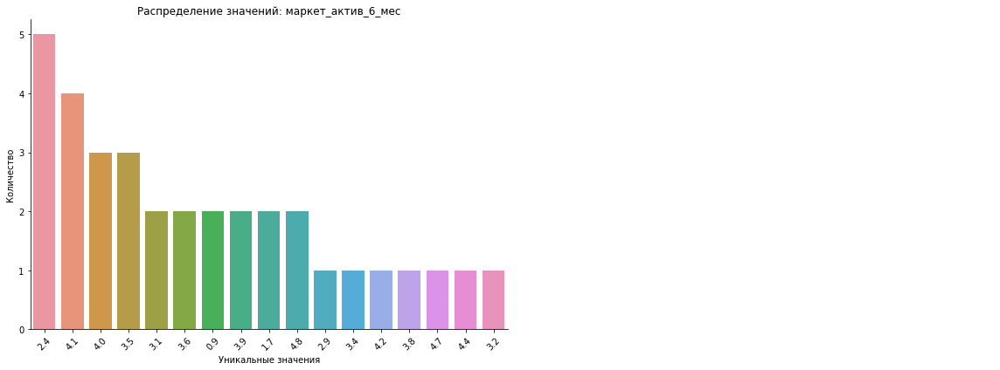

count   34.00
mean     3.34
std      1.03
min      0.90
25%      2.52
50%      3.55
75%      4.07
max      4.80
Name: маркет_актив_6_мес, dtype: float64


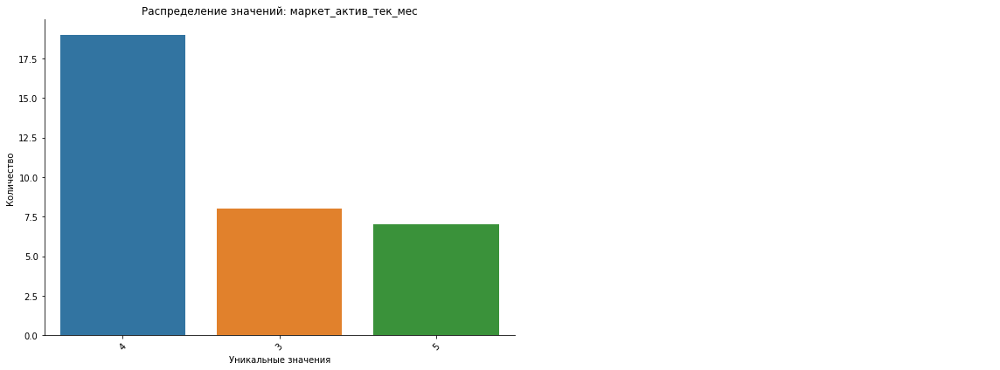

count   34.00
mean     3.97
std      0.67
min      3.00
25%      4.00
50%      4.00
75%      4.00
max      5.00
Name: маркет_актив_тек_мес, dtype: float64


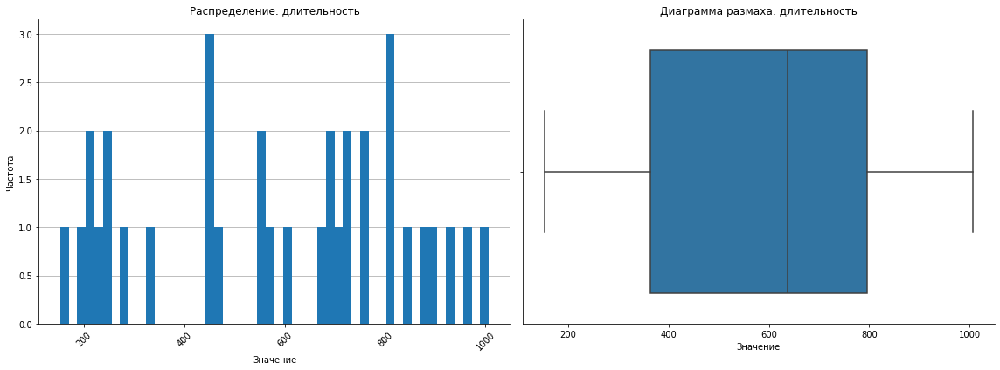

count     34.00
mean     584.88
std      257.16
min      152.00
25%      363.50
50%      637.00
75%      795.25
max     1007.00
Name: длительность, dtype: float64


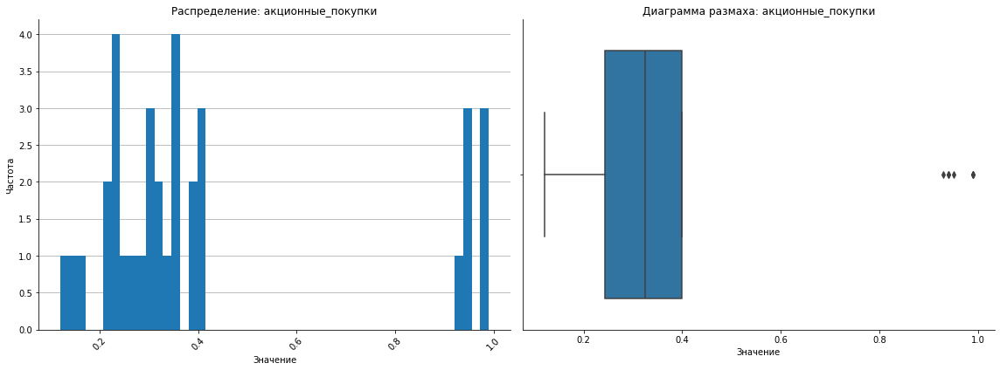

count   34.00
mean     0.43
std      0.28
min      0.12
25%      0.24
50%      0.33
75%      0.40
max      0.99
Name: акционные_покупки, dtype: float64


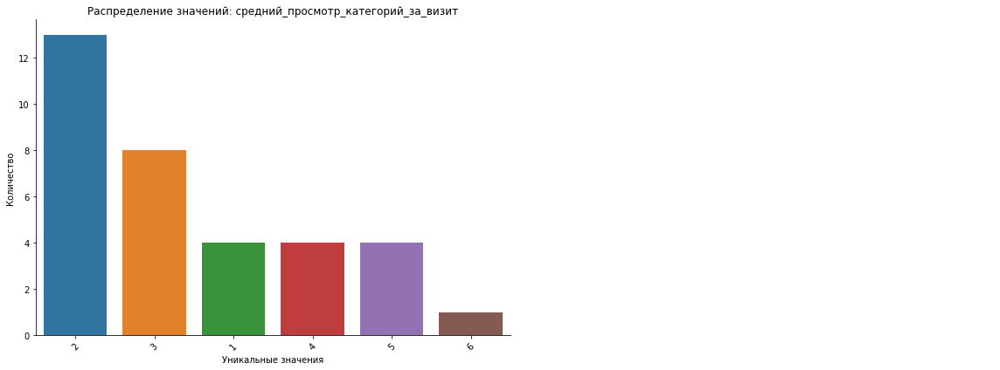

count   34.00
mean     2.82
std      1.31
min      1.00
25%      2.00
50%      2.50
75%      3.75
max      6.00
Name: средний_просмотр_категорий_за_визит, dtype: float64


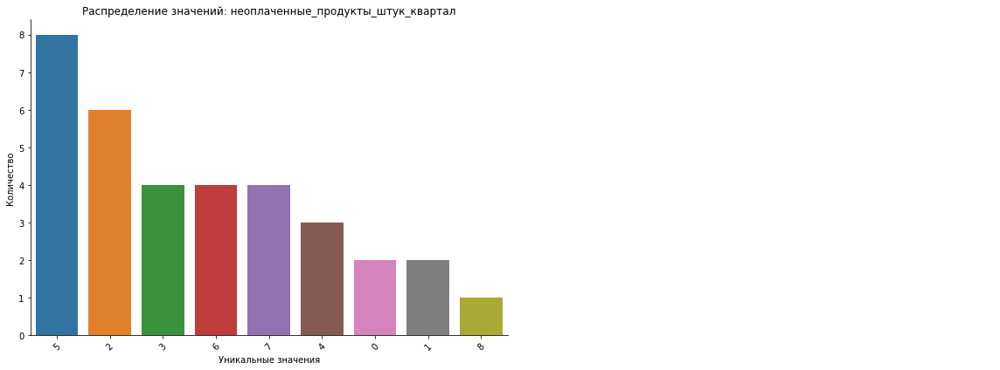

count   34.00
mean     4.06
std      2.16
min      0.00
25%      2.00
50%      4.50
75%      5.75
max      8.00
Name: неоплаченные_продукты_штук_квартал, dtype: float64


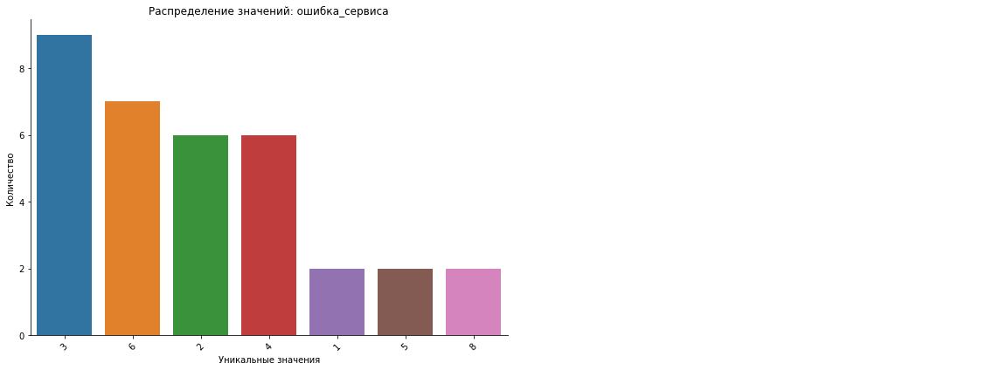

count   34.00
mean     3.91
std      1.85
min      1.00
25%      3.00
50%      3.50
75%      5.75
max      8.00
Name: ошибка_сервиса, dtype: float64


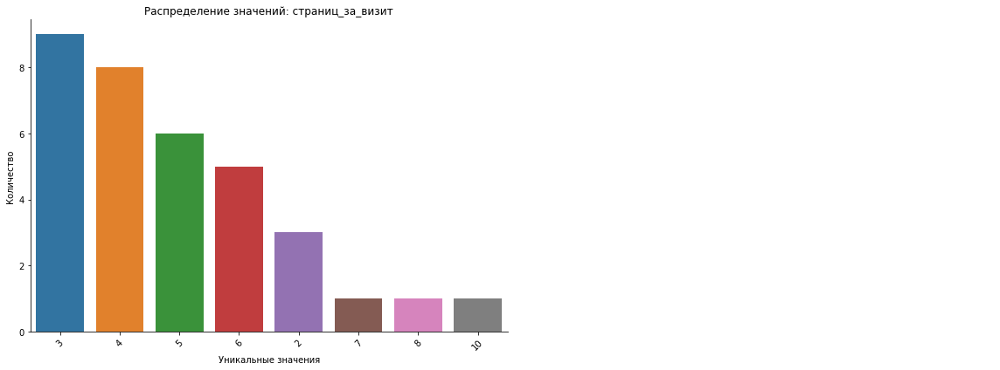

count   34.00
mean     4.41
std      1.76
min      2.00
25%      3.00
50%      4.00
75%      5.00
max     10.00
Name: страниц_за_визит, dtype: float64


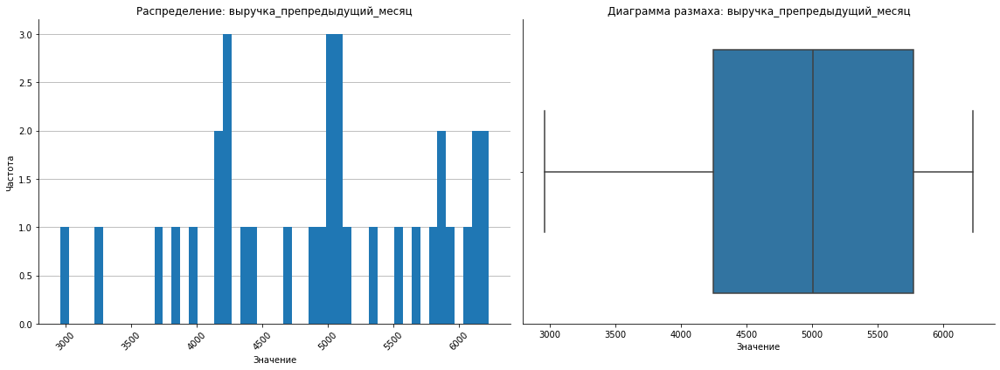

count     34.00
mean    4949.53
std      882.04
min     2960.00
25%     4248.38
50%     5005.25
75%     5776.00
max     6227.00
Name: выручка_препредыдущий_месяц, dtype: float64


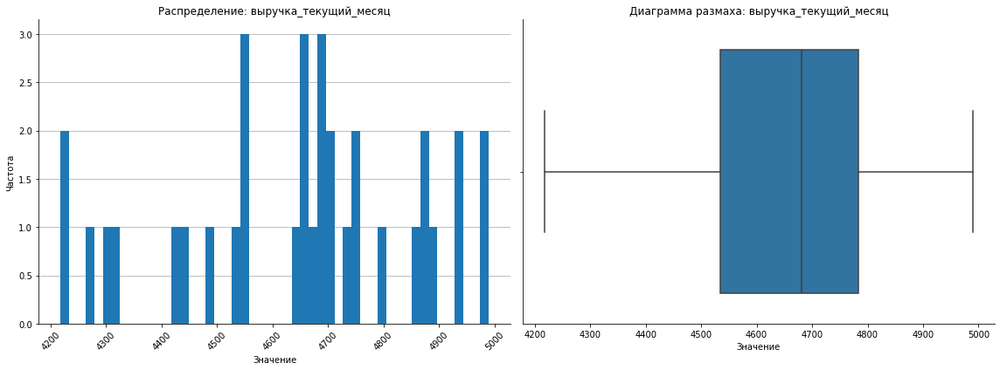

count     34.00
mean    4647.94
std      217.18
min     4217.00
25%     4534.00
50%     4680.50
75%     4783.75
max     4990.00
Name: выручка_текущий_месяц, dtype: float64


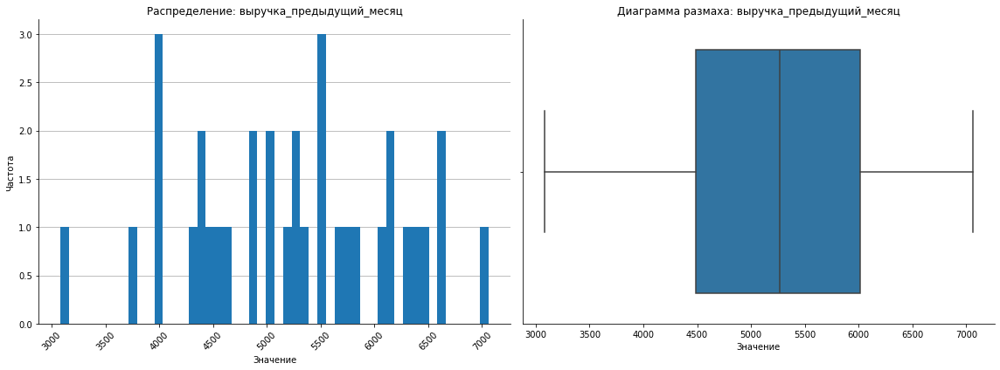

count     34.00
mean    5231.55
std      951.27
min     3078.30
25%     4486.15
50%     5264.10
75%     6011.10
max     7063.00
Name: выручка_предыдущий_месяц, dtype: float64


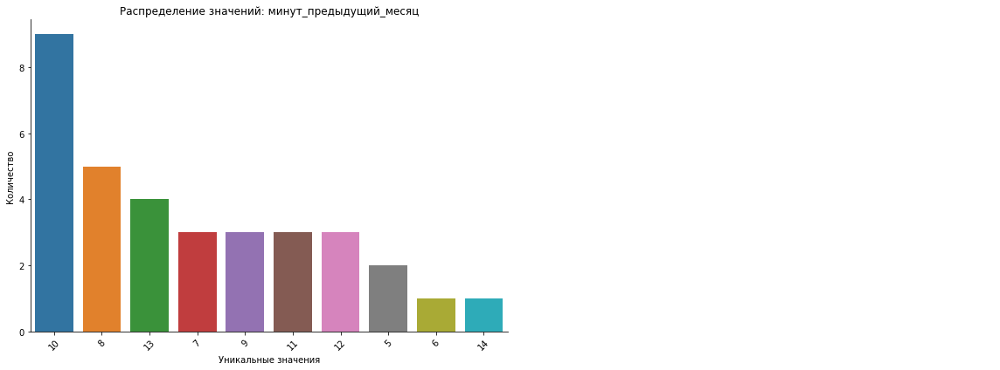

count   34.00
mean     9.68
std      2.33
min      5.00
25%      8.00
50%     10.00
75%     11.00
max     14.00
Name: минут_предыдущий_месяц, dtype: float64


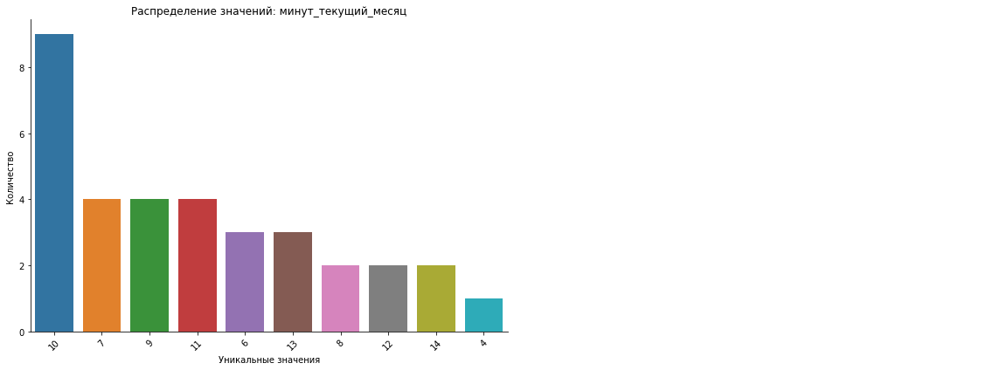

count   34.00
mean     9.62
std      2.45
min      4.00
25%      8.00
50%     10.00
75%     11.00
max     14.00
Name: минут_текущий_месяц, dtype: float64


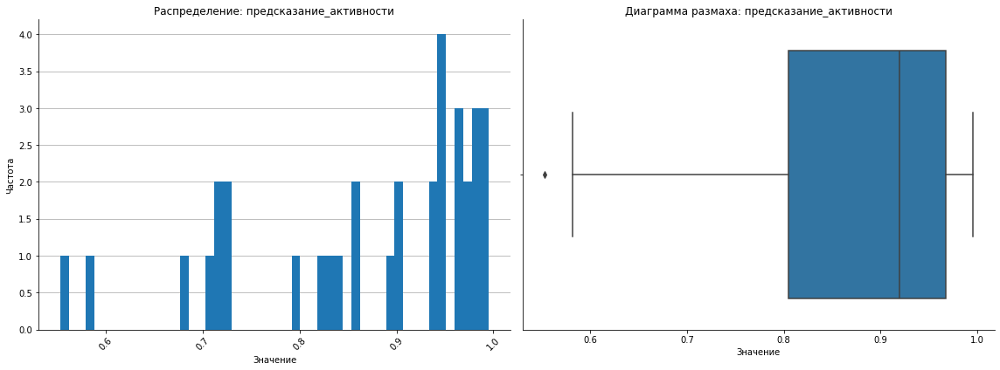

count   34.00
mean     0.87
std      0.12
min      0.55
25%      0.80
50%      0.92
75%      0.97
max      1.00
Name: предсказание_активности, dtype: float64


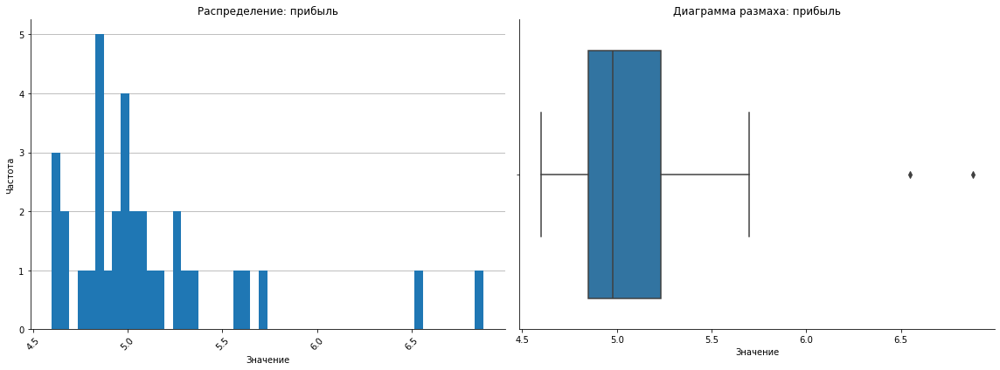

count   34.00
mean     5.11
std      0.49
min      4.60
25%      4.85
50%      4.98
75%      5.23
max      6.88
Name: прибыль, dtype: float64


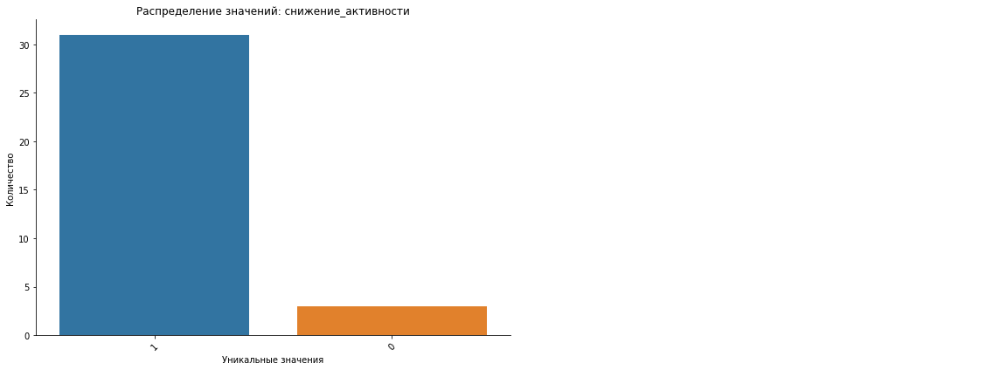

count   34.00
mean     0.91
std      0.29
min      0.00
25%      1.00
50%      1.00
75%      1.00
max      1.00
Name: снижение_активности, dtype: float64


In [128]:
df = segment_check

# Исключаем id из анализа и категориальные признаки
non_object_columns = [
    col for col in df.columns 
    if df[col].dtype != 'object' and 'id' not in col.lower()
]

for c in non_object_columns:
    plot_two_graf(df, c)

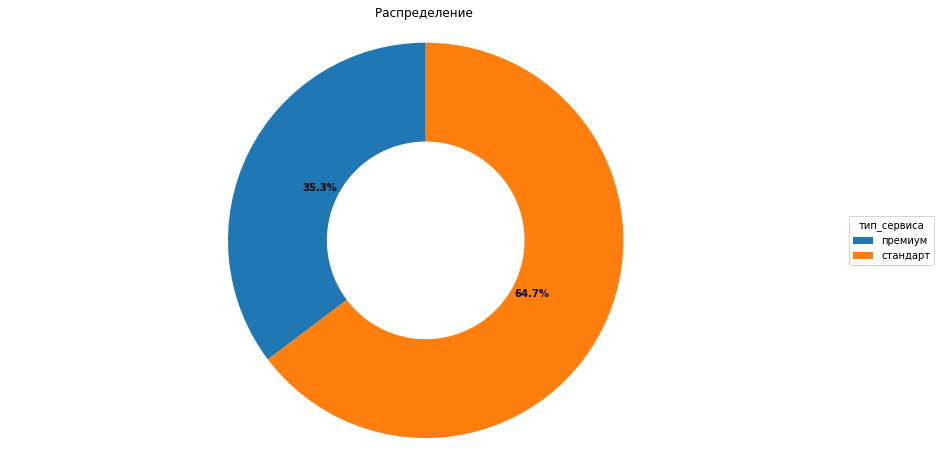

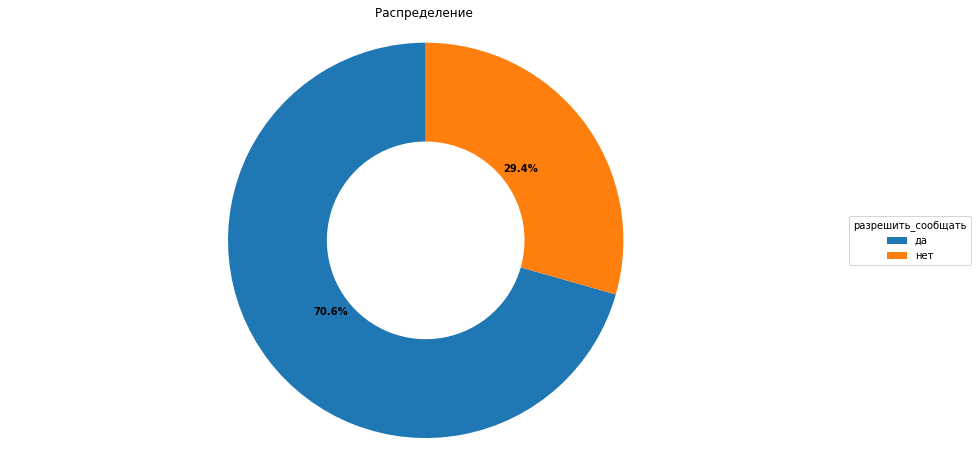

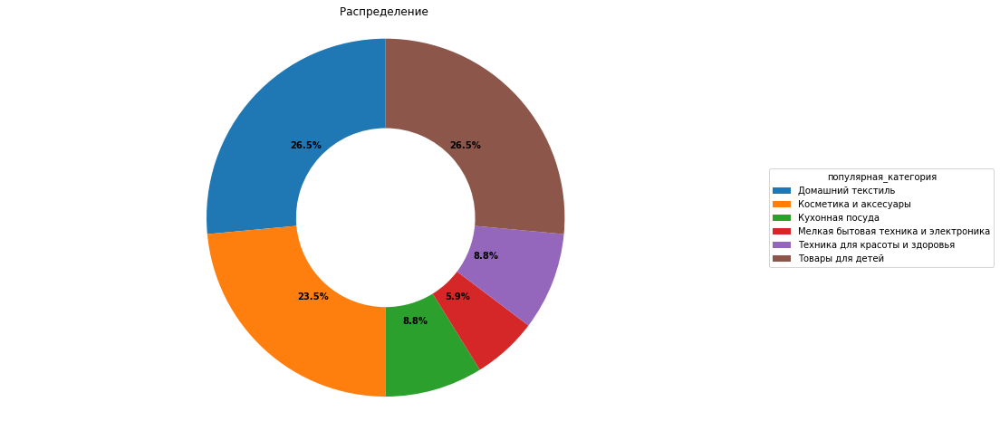

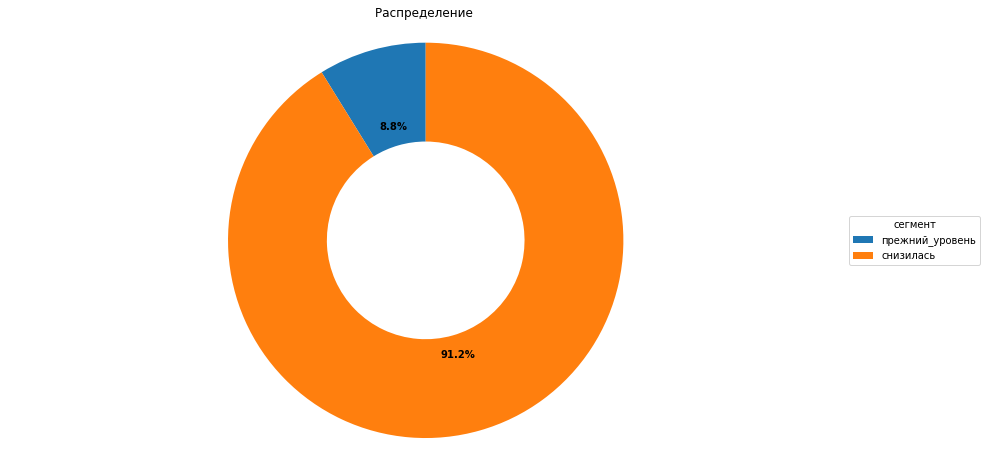

In [129]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        distribution_of_columns(df,c)

Выводы по выделенному сегменту:

ТОП-3 Популярных категории 
- Товары для детей
- Домашний Текстиль
- Косметика и аксесуары

Тип сервиса в 65% случаев - Стандартный

Выручка падает с Предыдущий месяц mean    5231.55 до Текущий месяц mean    4647.94

Акционные пакупки - mean     0.43
Средний просмотр категорий за визит - mean     2.82


В выделенном сегменте, видим низкое значение Акционных покупок и Маленькое значение просмотров других категорий, в среднем не больше 2х.

Предложение: 
    Увеличить количество Акционных предложений в выделенном сегменте, направленных на другие популярные товары.
    Т.е. мы выделяем сегмент популярный у покупателя и Акционные товары будут из други направление, Пример:
        - Если покупать смотрит "Товары для детей" - предложить акционные позиции в связаных товарах "Товары для кухню" и "Домашний Текстиль"
        - "Домашний Текстиль" - предлагаем "Косметика и акксесуары" "Техника для здоровья"
        
К каждой категории необходимо прописать ещё 2 и для выдавать акциионные товары именно при покупке 1+ 2 другие категории, тем самым мы увеличим лояльность клиента, увеличим кол-во покупаймых товаров и разнообразим корзину

### дополнительный анализ по всей выборке

In [130]:
df_market_for_children = df_market[df_market['популярная_категория'] == 'Товары для детей']
df_market_for_children.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,прибыль
id,,,,,,,,,,,,,,,,,,
215349,Снизилась,премиум,да,4.40,4,819,0.75,Товары для детей,4,4,2,5,5216.00,4472.00,4971.60,12,10,4.16
215351,Снизилась,стандарт,да,3.20,5,896,0.99,Товары для детей,5,0,6,4,6158.00,4793.00,6610.40,11,13,4.87
215352,Снизилась,стандарт,нет,5.10,3,1064,0.94,Товары для детей,3,2,3,2,5807.50,4594.00,5872.50,8,11,4.21
215355,Снизилась,стандарт,нет,4.70,4,284,0.17,Товары для детей,5,1,6,4,3263.00,4749.00,3772.60,12,10,5.26
215363,Снизилась,стандарт,нет,4.90,4,923,0.29,Товары для детей,6,0,3,1,6010.00,4633.00,6128.30,8,5,1.83


In [131]:
df_market_home_kitchen = df_market[df_market['популярная_категория'] == 'Домашний текстиль']
df_market_home_kitchen.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_препредыдущий_месяц,выручка_текущий_месяц,выручка_предыдущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,прибыль
id,,,,,,,,,,,,,,,,,,
215350,Снизилась,стандарт,нет,4.90,3,539,0.14,Домашний текстиль,5,2,1,5,5457.50,4826.00,5058.40,8,13,3.13
215353,Снизилась,стандарт,да,3.30,4,762,0.26,Домашний текстиль,4,1,1,4,4738.50,5124.00,5388.50,10,10,3.95
215358,Снизилась,стандарт,да,4.70,4,450,0.13,Домашний текстиль,4,2,6,4,3488.00,4727.00,4209.50,14,10,3.06
215362,Снизилась,премиум,да,4.20,4,438,0.74,Домашний текстиль,3,4,6,4,4314.00,4765.00,4447.90,13,13,3.49
215364,Снизилась,премиум,да,4.30,4,708,0.98,Домашний текстиль,3,3,3,3,5795.50,4942.00,5484.80,11,9,2.67


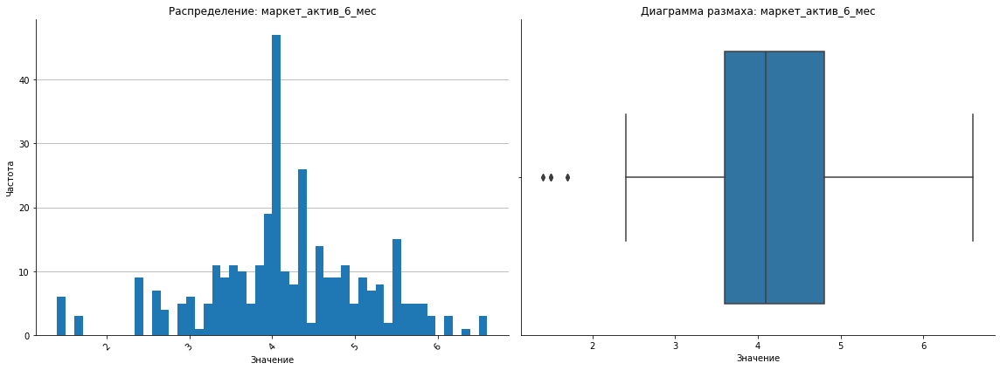

count   329.00
mean      4.19
std       0.98
min       1.40
25%       3.60
50%       4.10
75%       4.80
max       6.60
Name: маркет_актив_6_мес, dtype: float64


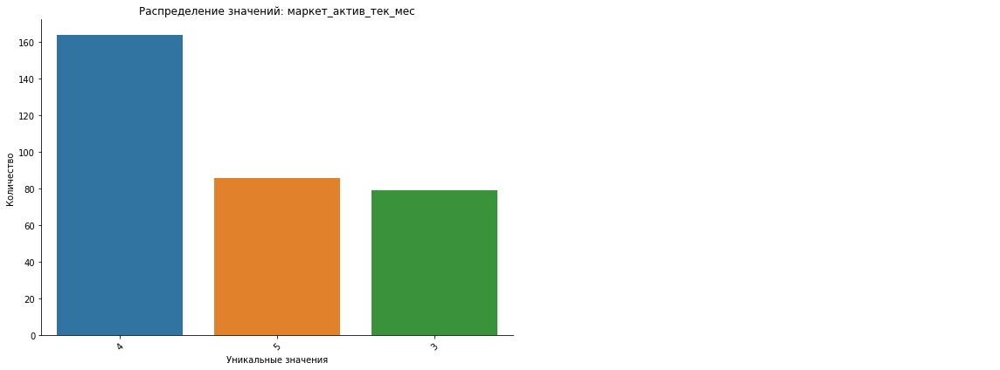

count   329.00
mean      4.02
std       0.71
min       3.00
25%       4.00
50%       4.00
75%       5.00
max       5.00
Name: маркет_актив_тек_мес, dtype: float64


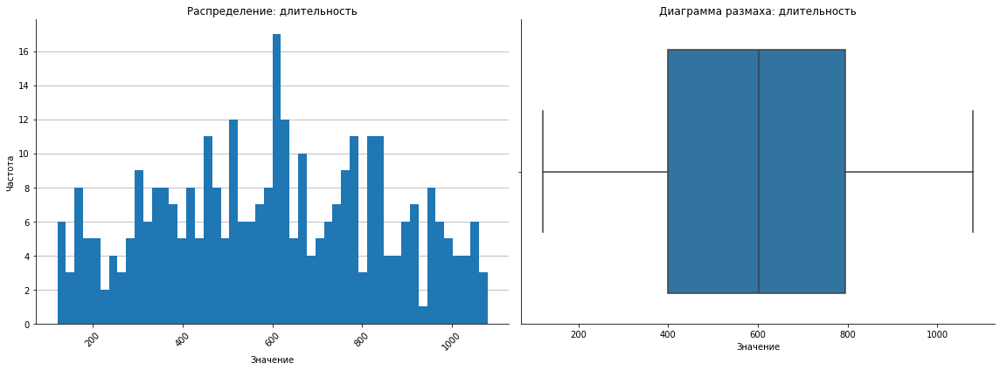

count    329.00
mean     598.74
std      250.40
min      121.00
25%      399.00
50%      602.00
75%      795.00
max     1079.00
Name: длительность, dtype: float64


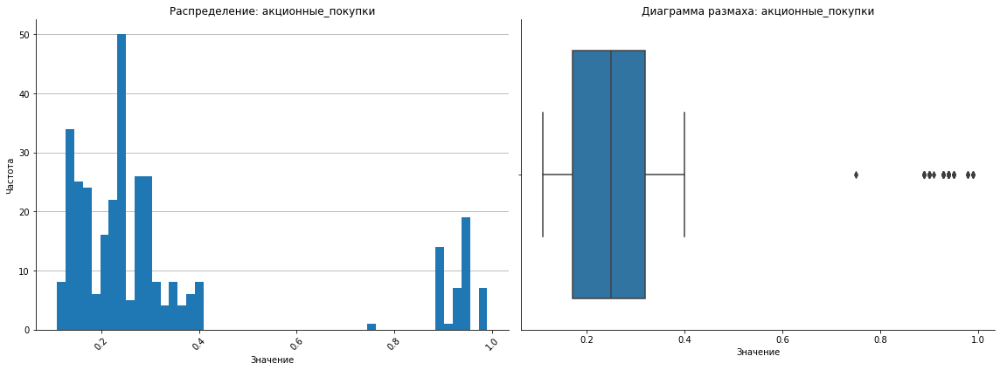

count   329.00
mean      0.34
std       0.26
min       0.11
25%       0.17
50%       0.25
75%       0.32
max       0.99
Name: акционные_покупки, dtype: float64


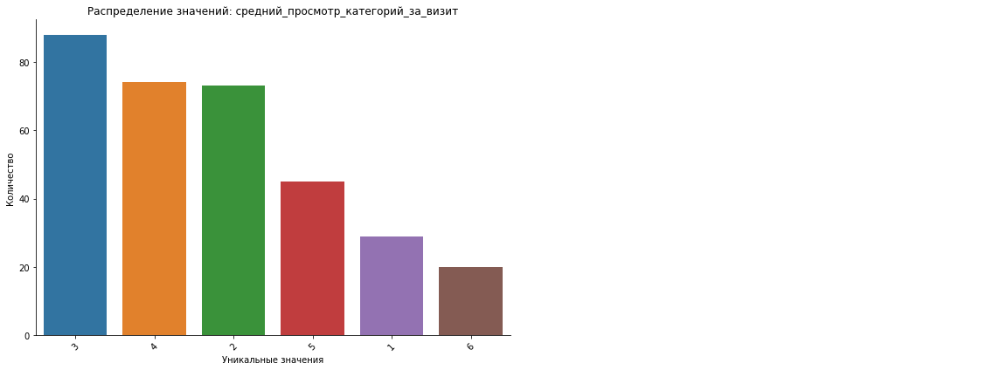

count   329.00
mean      3.28
std       1.35
min       1.00
25%       2.00
50%       3.00
75%       4.00
max       6.00
Name: средний_просмотр_категорий_за_визит, dtype: float64


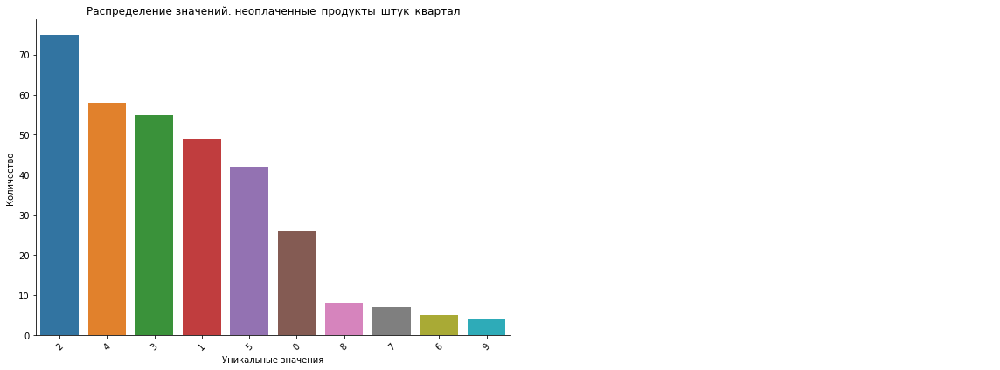

count   329.00
mean      2.99
std       1.94
min       0.00
25%       2.00
50%       3.00
75%       4.00
max       9.00
Name: неоплаченные_продукты_штук_квартал, dtype: float64


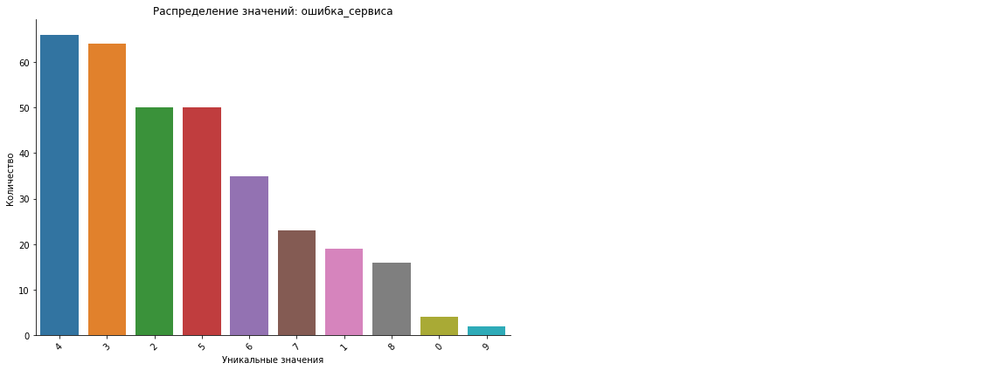

count   329.00
mean      4.08
std       1.91
min       0.00
25%       3.00
50%       4.00
75%       5.00
max       9.00
Name: ошибка_сервиса, dtype: float64


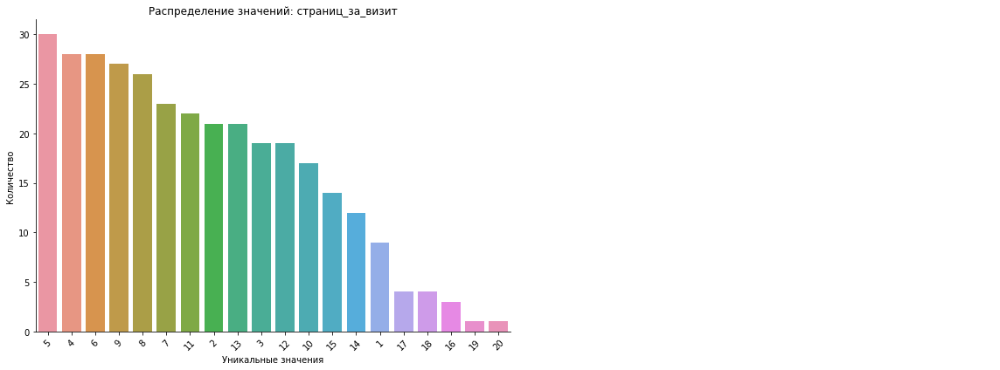

count   329.00
mean      8.11
std       4.26
min       1.00
25%       5.00
50%       8.00
75%      11.00
max      20.00
Name: страниц_за_визит, dtype: float64


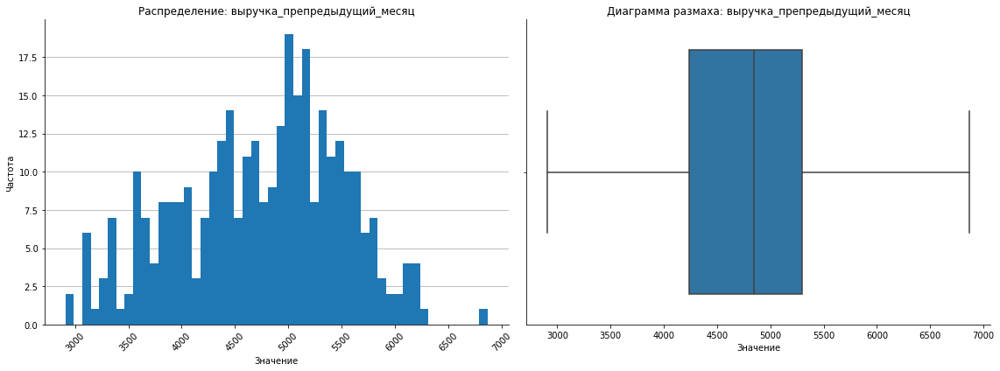

count    329.00
mean    4738.64
std      764.13
min     2909.00
25%     4234.00
50%     4849.00
75%     5298.00
max     6869.50
Name: выручка_препредыдущий_месяц, dtype: float64


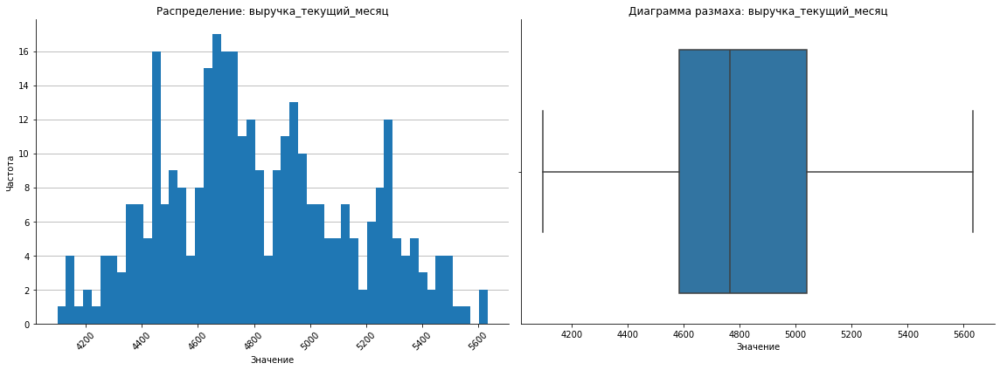

count    329.00
mean    4816.96
std      332.80
min     4098.00
25%     4586.00
50%     4767.00
75%     5039.00
max     5633.00
Name: выручка_текущий_месяц, dtype: float64


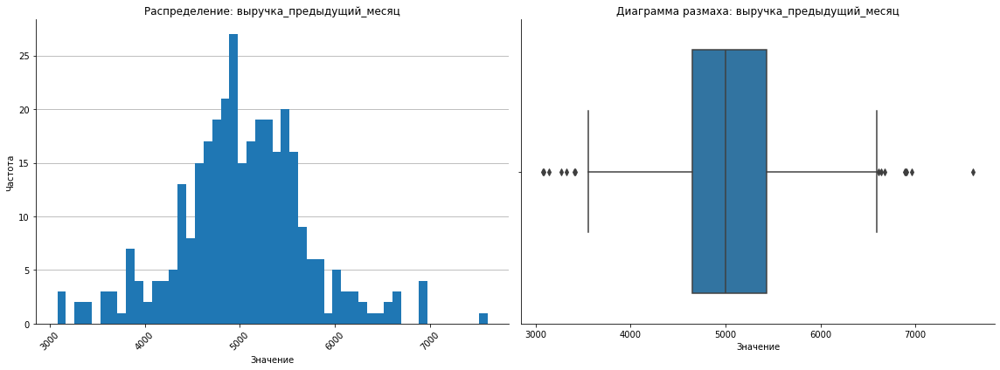

count    329.00
mean    5027.85
std      684.53
min     3078.30
25%     4651.00
50%     5002.00
75%     5433.60
max     7605.30
Name: выручка_предыдущий_месяц, dtype: float64


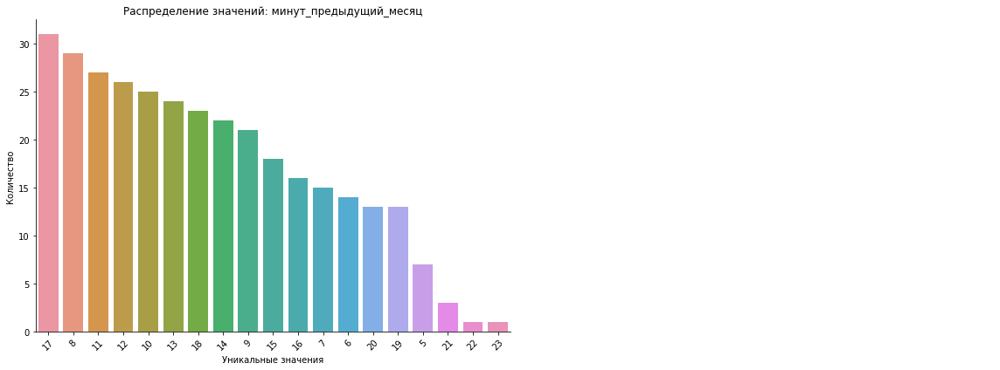

count   329.00
mean     12.78
std       4.23
min       5.00
25%       9.00
50%      13.00
75%      17.00
max      23.00
Name: минут_предыдущий_месяц, dtype: float64


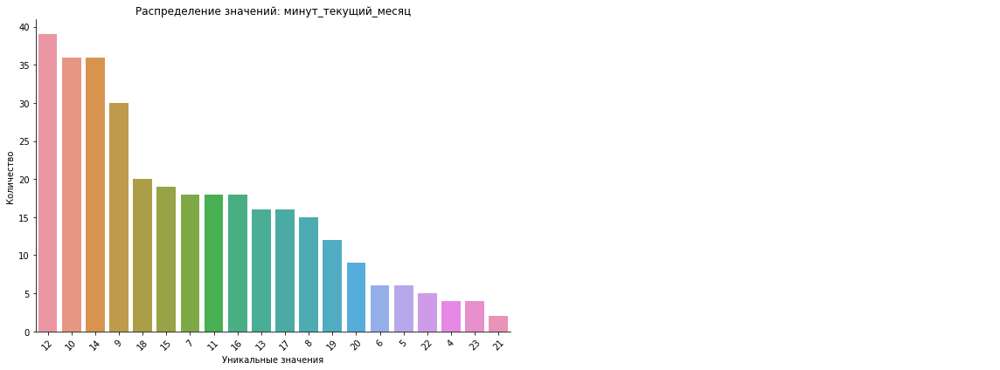

count   329.00
mean     12.74
std       4.19
min       4.00
25%      10.00
50%      12.00
75%      16.00
max      23.00
Name: минут_текущий_месяц, dtype: float64


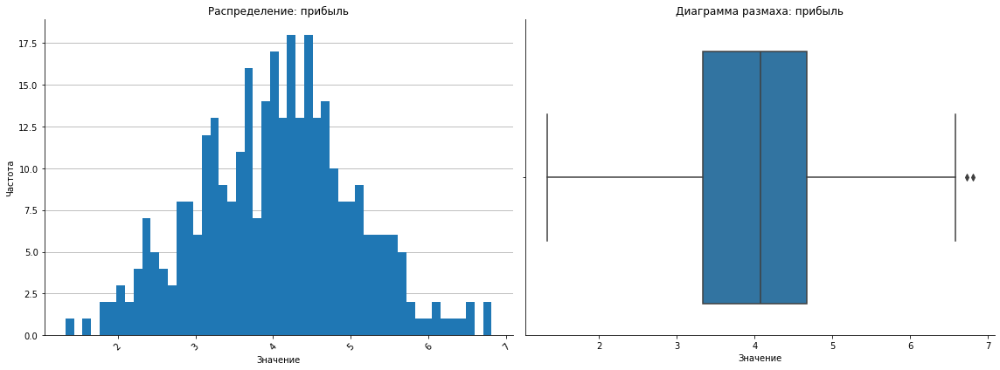

count   329.00
mean      4.04
std       1.01
min       1.33
25%       3.33
50%       4.08
75%       4.67
max       6.81
Name: прибыль, dtype: float64


In [132]:
df = df_market_for_children

# Исключаем id из анализа и категориальные признаки
non_object_columns = [
    col for col in df.columns 
    if df[col].dtype != 'object' and 'id' not in col.lower()
]

for c in non_object_columns:
    plot_two_graf(df, c)

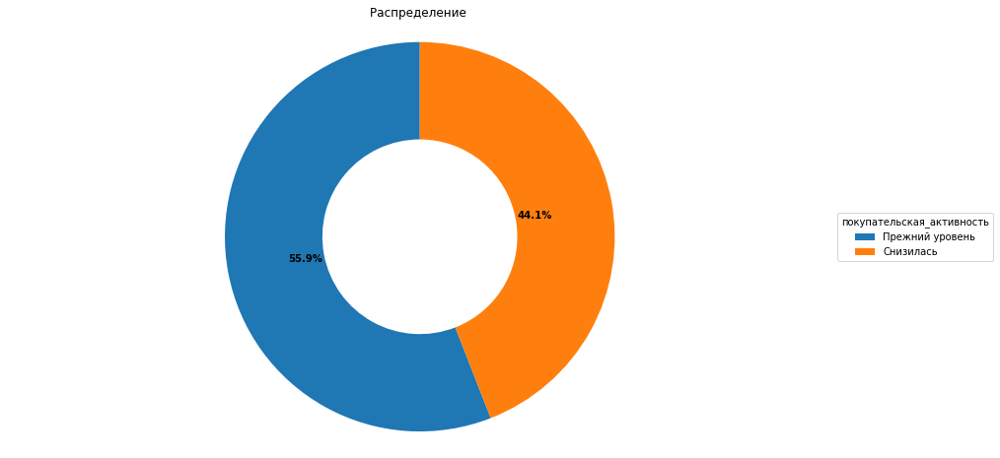

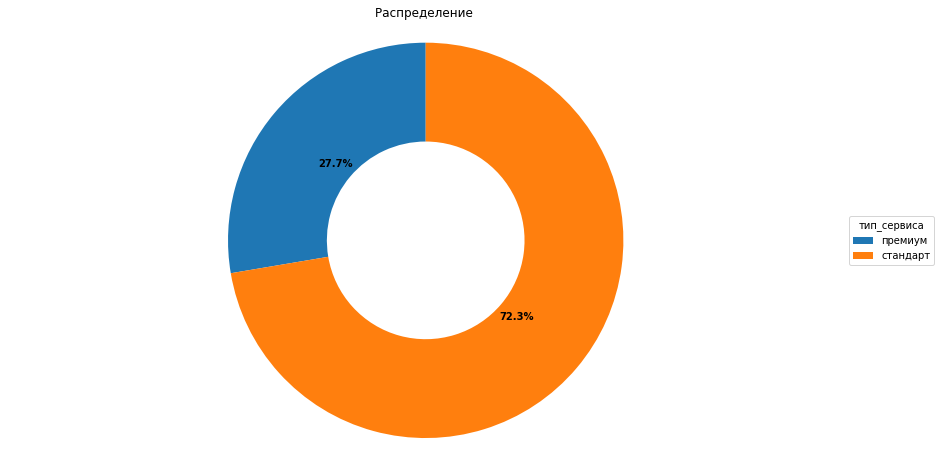

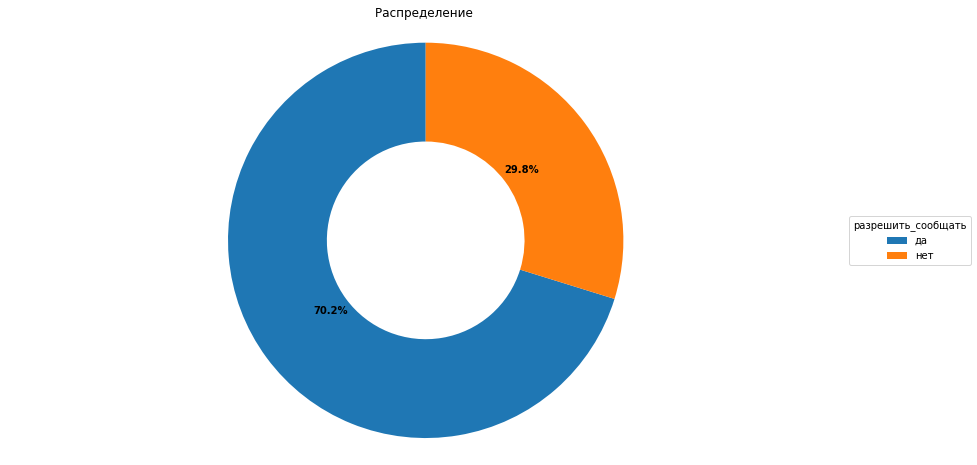

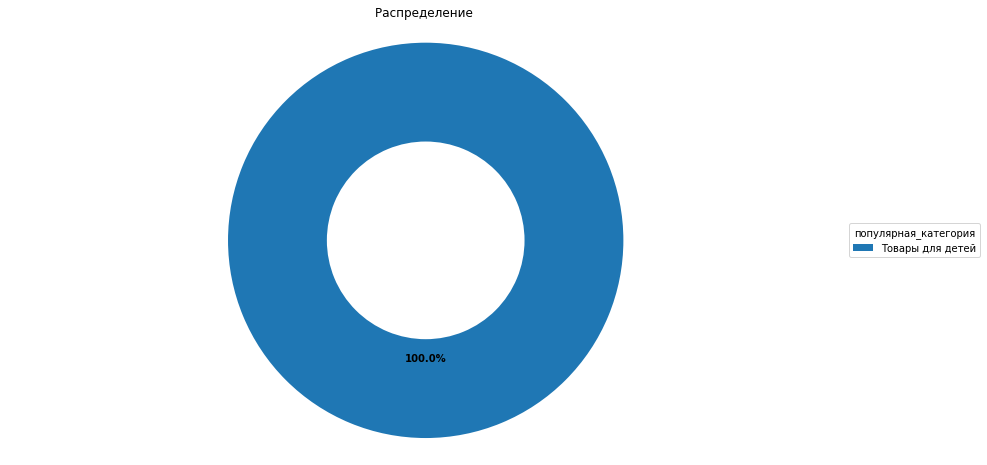

In [133]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        distribution_of_columns(df,c)

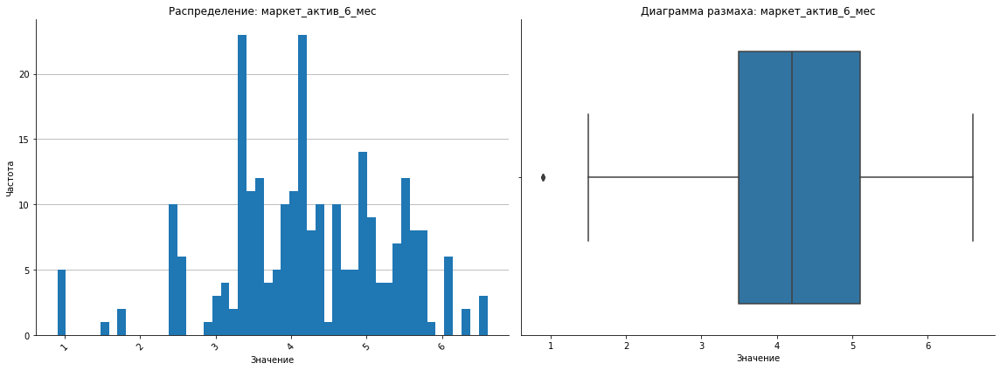

count   250.00
mean      4.21
std       1.12
min       0.90
25%       3.50
50%       4.20
75%       5.10
max       6.60
Name: маркет_актив_6_мес, dtype: float64


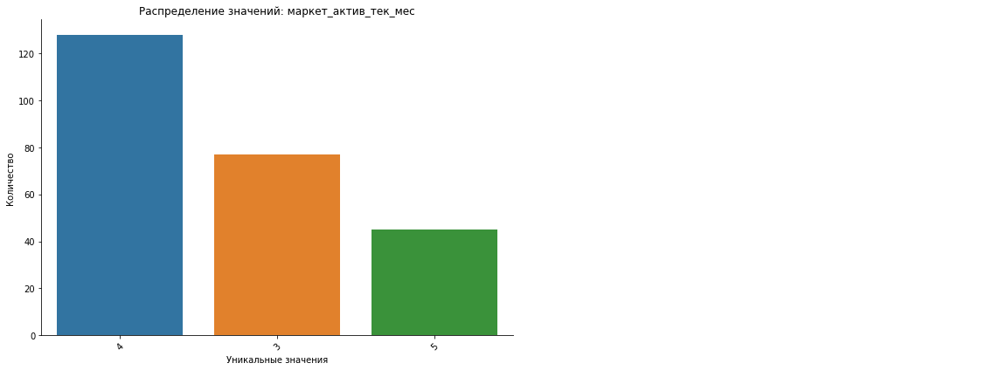

count   250.00
mean      3.87
std       0.69
min       3.00
25%       3.00
50%       4.00
75%       4.00
max       5.00
Name: маркет_актив_тек_мес, dtype: float64


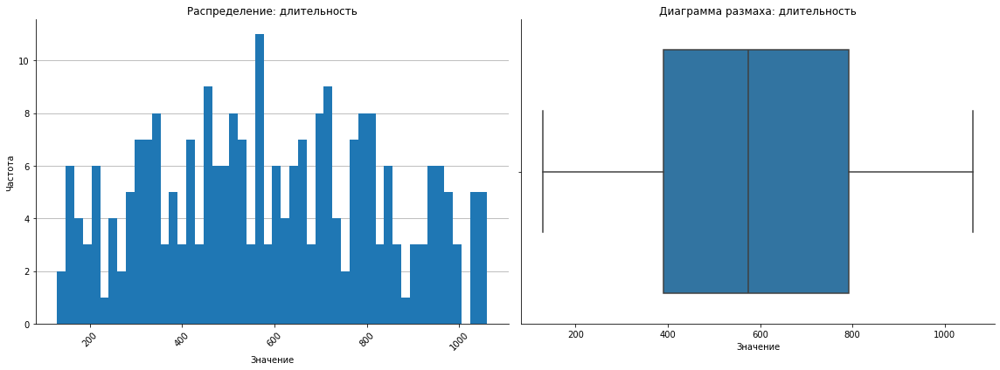

count    250.00
mean     589.06
std      247.55
min      129.00
25%      390.50
50%      574.00
75%      791.25
max     1061.00
Name: длительность, dtype: float64


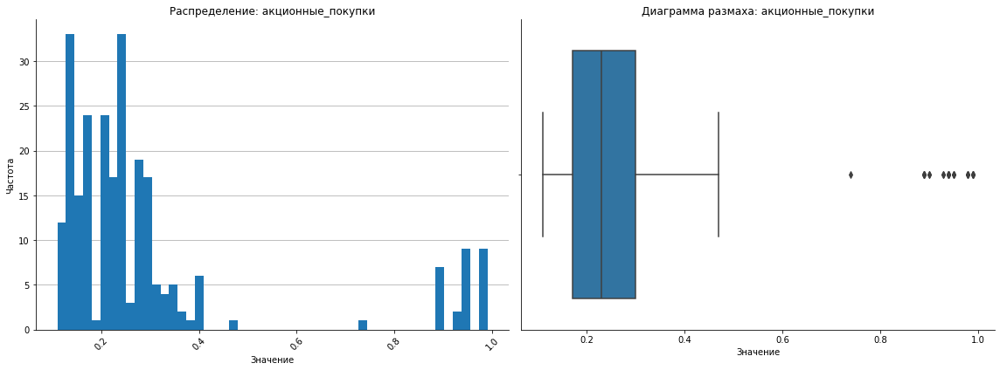

count   250.00
mean      0.30
std       0.24
min       0.11
25%       0.17
50%       0.23
75%       0.30
max       0.99
Name: акционные_покупки, dtype: float64


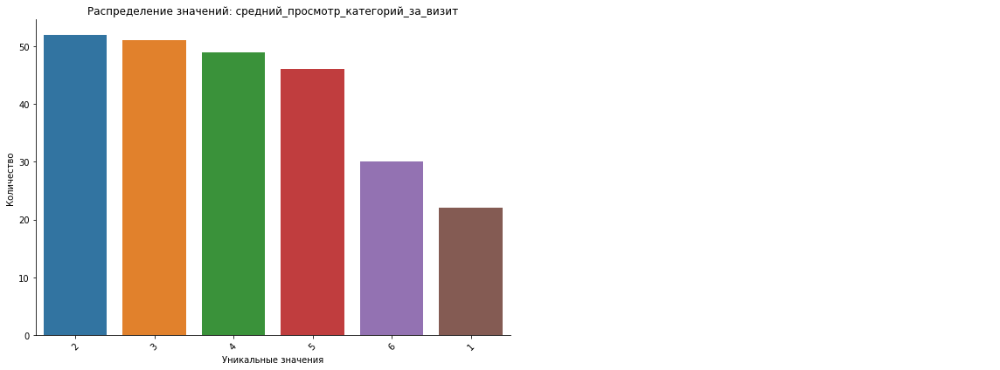

count   250.00
mean      3.54
std       1.51
min       1.00
25%       2.00
50%       3.50
75%       5.00
max       6.00
Name: средний_просмотр_категорий_за_визит, dtype: float64


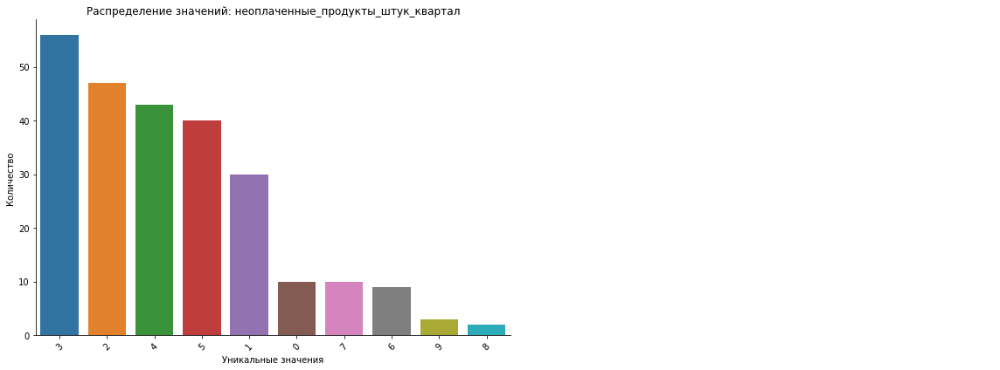

count   250.00
mean      3.32
std       1.83
min       0.00
25%       2.00
50%       3.00
75%       5.00
max       9.00
Name: неоплаченные_продукты_штук_квартал, dtype: float64


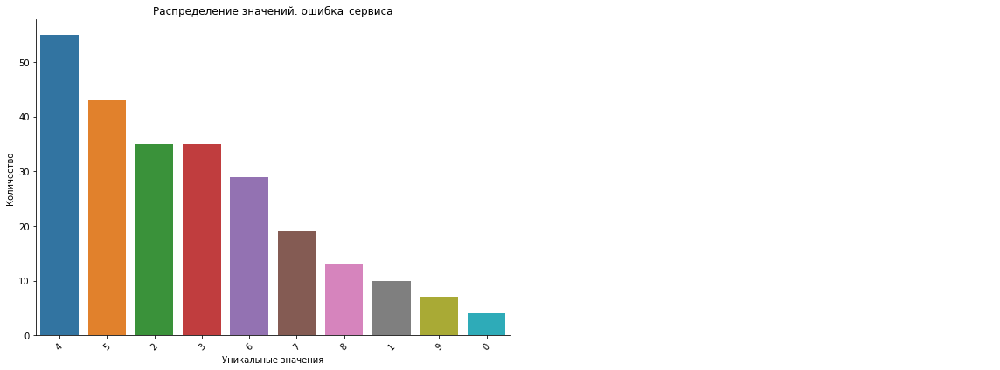

count   250.00
mean      4.38
std       2.01
min       0.00
25%       3.00
50%       4.00
75%       6.00
max       9.00
Name: ошибка_сервиса, dtype: float64


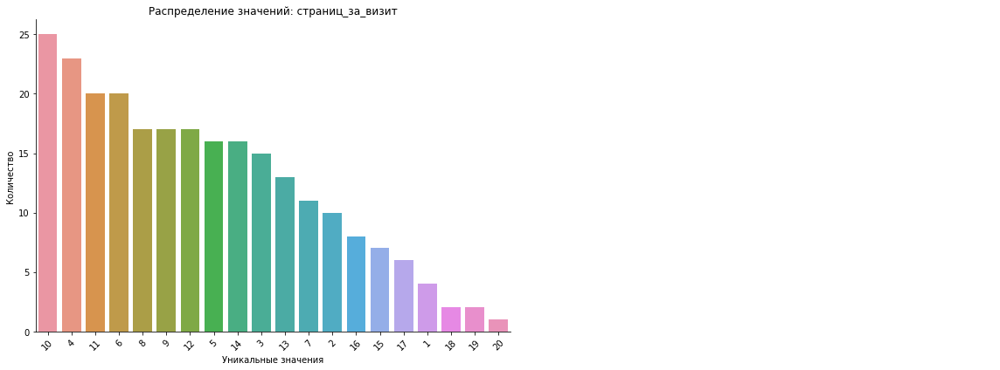

count   250.00
mean      8.89
std       4.36
min       1.00
25%       5.00
50%       9.00
75%      12.00
max      20.00
Name: страниц_за_визит, dtype: float64


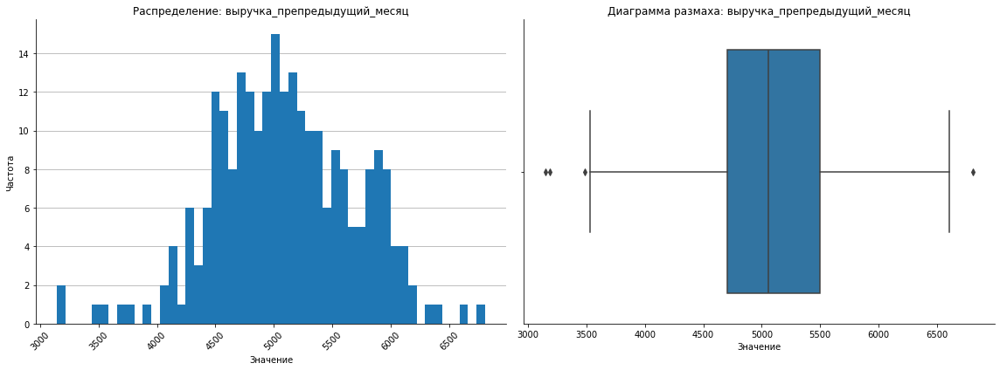

count    250.00
mean    5095.34
std      599.49
min     3146.00
25%     4702.88
50%     5056.75
75%     5501.75
max     6809.00
Name: выручка_препредыдущий_месяц, dtype: float64


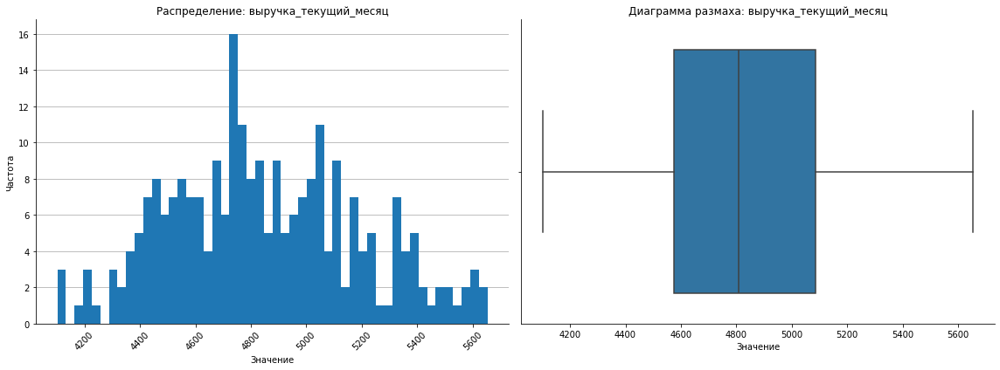

count    250.00
mean    4847.06
std      341.81
min     4102.00
25%     4573.50
50%     4809.00
75%     5085.25
max     5653.00
Name: выручка_текущий_месяц, dtype: float64


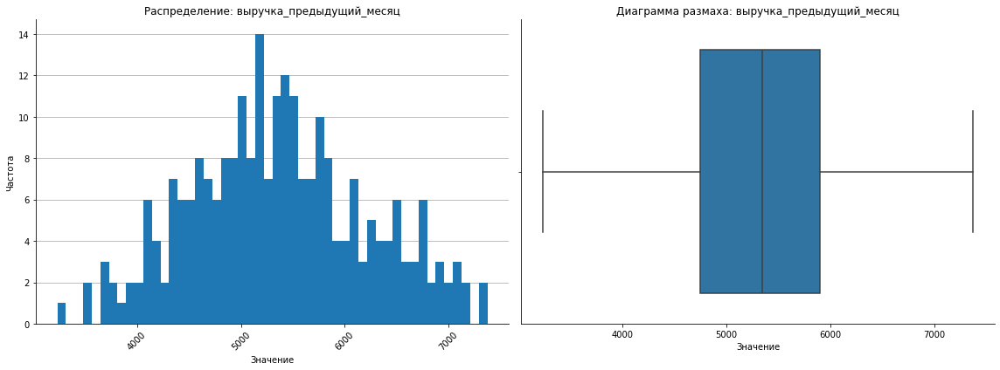

count    250.00
mean    5365.24
std      850.94
min     3232.20
25%     4750.65
50%     5347.40
75%     5899.73
max     7374.00
Name: выручка_предыдущий_месяц, dtype: float64


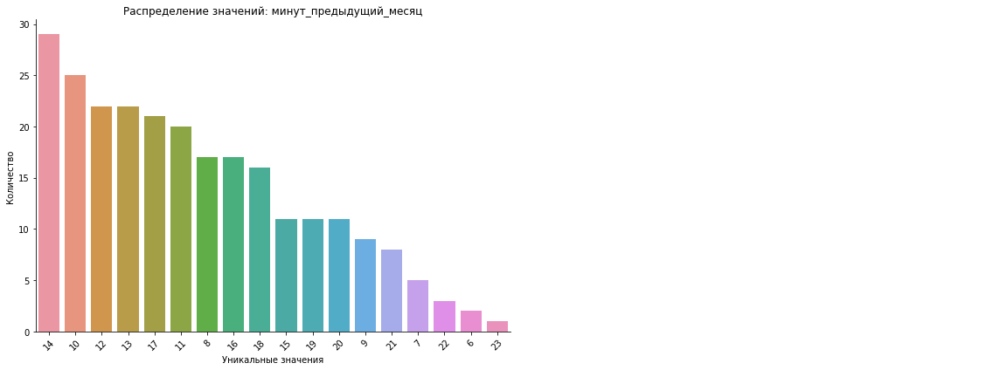

count   250.00
mean     13.83
std       3.88
min       6.00
25%      11.00
50%      14.00
75%      17.00
max      23.00
Name: минут_предыдущий_месяц, dtype: float64


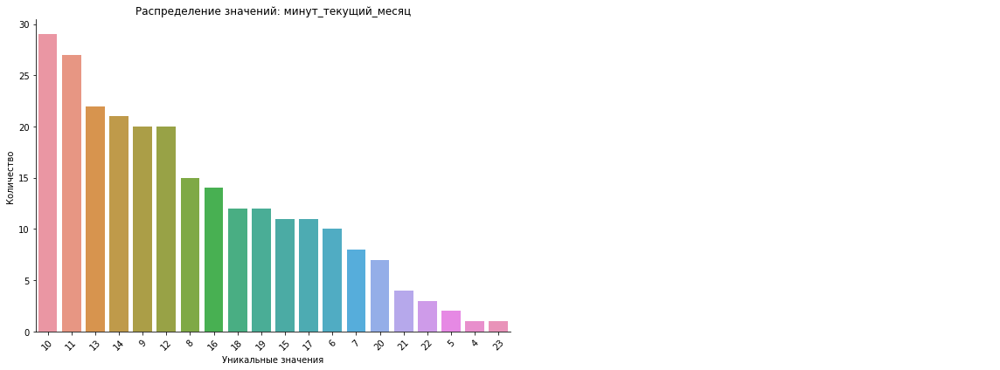

count   250.00
mean     12.68
std       4.05
min       4.00
25%      10.00
50%      12.00
75%      16.00
max      23.00
Name: минут_текущий_месяц, dtype: float64


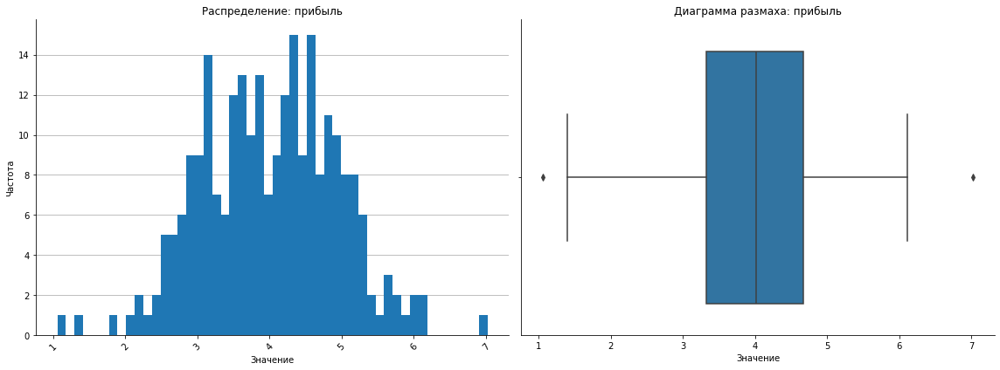

count   250.00
mean      4.01
std       0.93
min       1.06
25%       3.32
50%       4.02
75%       4.67
max       7.02
Name: прибыль, dtype: float64


In [134]:
df = df_market_home_kitchen

# Исключаем id из анализа и категориальные признаки
non_object_columns = [
    col for col in df.columns 
    if df[col].dtype != 'object' and 'id' not in col.lower()
]

for c in non_object_columns:
    plot_two_graf(df, c)

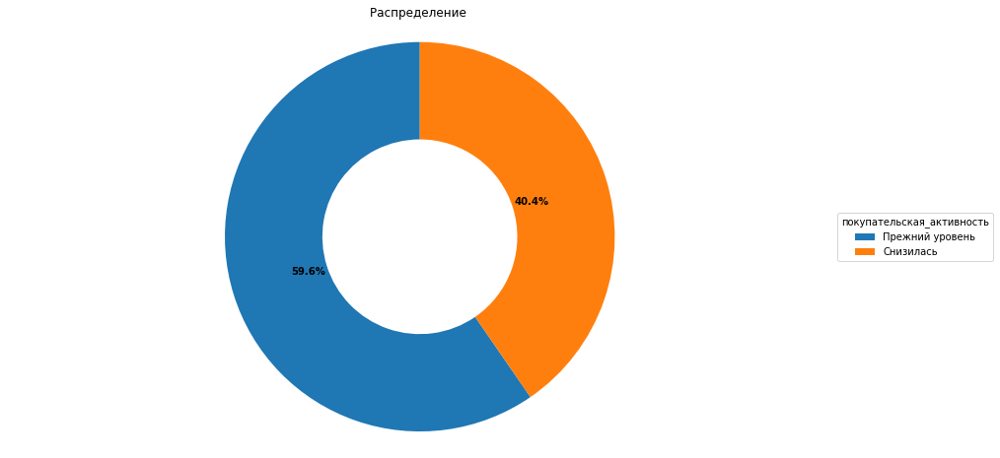

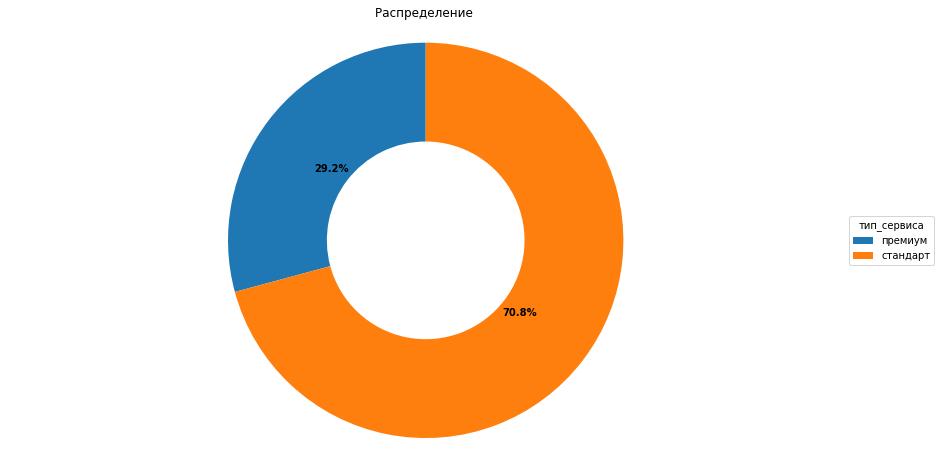

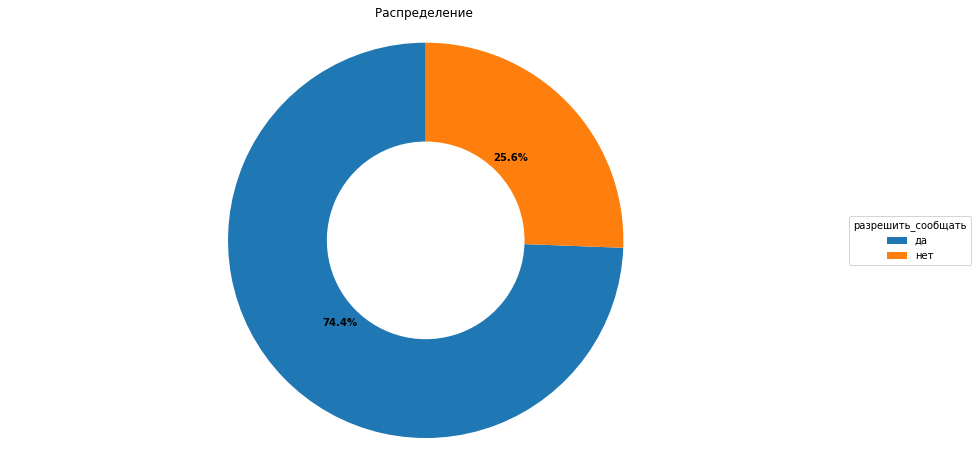

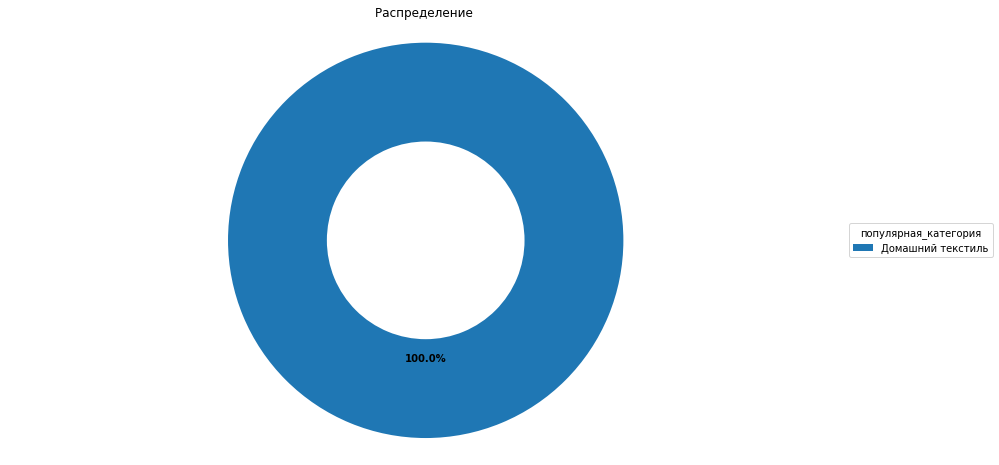

In [135]:
for c in df.columns:
    c_type = df[c].dtype

    if c_type == 'object':
        distribution_of_columns(df,c)

### 8.3 Сделайте выводы о сегментах:
* какой сегмент вы взяли для дополнительного исследования,
* какие предложения вы сделали и почему.


Выводы по выделенному сегменту:

ТОП-3 Популярных категории 
- Товары для детей
- Домашний Текстиль
- Косметика и аксесуары

Тип сервиса в 65% случаев - Стандартный

Выручка падает с Предыдущий месяц mean    5231.55 до Текущий месяц mean    4647.94

Акционные пакупки - mean     0.43
Средний просмотр категорий за визит - mean     2.82


В выделенном сегменте, видим низкое значение Акционных покупок и Маленькое значение просмотров других категорий, в среднем не больше 2х.

Предложение: 
    Увеличить количество Акционных предложений в выделенном сегменте, направленных на другие популярные товары.
    Т.е. мы выделяем сегмент популярный у покупателя и Акционные товары будут из други направление, Пример:
        - Если покупать смотрит "Товары для детей" - предложить акционные позиции в связаных товарах "Товары для кухню" и "Домашний Текстиль"
        - "Домашний Текстиль" - предлагаем "Косметика и акксесуары" "Техника для здоровья"
        
К каждой категории необходимо прописать ещё 2 и для выдавать акциионные товары именно при покупке 1+ 2 другие категории, тем самым мы увеличим лояльность клиента, увеличим кол-во покупаймых товаров и разнообразим корзину у Клиентов.

*Дополнительно проведён анализ по Популярным категориям:*

Рекомендации для категории “Товары для детей”:
Маркетинговые стратегии:
Сезонные акции:

* Распродажи к началу учебного года/праздникам
* бонусы за предзаказы коллекций

Программы лояльности:

* Накопительные баллы за покупки
* Эксклюзивные скидки для постоянных клиентов

Контент-продвижение:
Полезный контент и реклама, выделенные статьи, по которым сразу будут рекоменадции:

* “Как выбрать что-то или для чего-то”
* Видеообзоры товаров, для закупки товаров

Рекламе в Соцсети:

* Конкурсы 

 Стратегии для категории “Кухонная посуда”:
Продажи и упаковка:

Наборы для квартиры и дачи, разное время года:

* “Летний комплект”: посуда для дачи
* “Новогодний декор”: салатники и всё для стола

Объединение в большие покупки:

* “Основной набор”: 2 комлекта ложек + вилки = цена 3 товаров

Сезонное продвижение:
Выделение Трендов:

* Весна
* Зима 

Акции:

* Черная пятница: скидки на премиальные коллекции
* 8 Марта: бесплатная персонализация

## Шаг 9. Общий вывод

** Сделайте общий вывод: **
* опишите задачу;
* опишите исходные данные и проведённую предобработку;
* напишите, что вы сделали для поиска лучшей модели;
* укажите лучшую модель;
* добавьте выводы и дополнительные предложения для выбранного сегмента покупателей.

**Описание задачи**

отделу поручили разработать решение, которое позволит персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность.

**опишите исходные данные и проведённую предобработку**

** Выводы **
* имена колонок - убраны пробелы и всё в нижнем регистре
1. df_market_file:
    * Явных дубликатов не выявлено
    * Пустых значений нет
    * колонка "период" произведено преобразование ('стандартт' в ->  'стандарт')
2. df_market_money:
    * Явных дубликатов не выявлено
    * Пустых значений нет
    * стоит ли преобразовать значение колонки "период" ('препредыдущий_месяц' в -> 'предыдущий_месяц') - ?
3. df_market_time:
    * колонка "период" произведено преобразование ('предыдцщий_месяц' в ->  'предыдущий_месяц')
    * Явных дубликатов не выявлено
    * Пустых значений нет
4. df_money:
    * Явных дубликатов не выявлено
    * Пустых значений нет

**напишите, что вы сделали для поиска лучшей модели;**

Выбор происходил из 4х моделей: KNeighborsClassifier(), DecisionTreeClassifier(), LogisticRegression() и SVC().

Проводился выбор для каждой модели гиперпаметров и анализ лучшей проводился по roc-auc

**Выбор метрики для оценки моделей
Для задачи классификации покупательской активности наиболее подходящей метрикой является ROC-AUC по следующим причинам:

* Неравномерность классов: В задачах классификации покупательского поведения часто встречается дисбаланс классов (мало активных клиентов против большинства неактивных). ROC-AUC не чувствителен к дисбалансу классов.

* Порог классификации: Метрика позволяет оценить качество модели без привязки к конкретному порогу классификации, что важно при анализе вероятностей покупательской активности.

* Общая производительность: ROC-AUC показывает способность модели различать классы по всему диапазону порогов, что критично для бизнес-приложений.

* Интерпретируемость: Значение метрики легко интерпретировать:

    * 0.5 — случайное угадывание
    * 1.0 — идеальное разделение классов

**укажите лучшую модель;**

лучшая модель - ('models', SVC(C=10, probability=True, random_state=42))])

Модель SVC Гиперпараметр С = 10




**добавьте выводы и дополнительные предложения для выбранного сегмента покупателей.**


Выводы по выделенному сегменту:

ТОП-3 Популярных категории 
- Товары для детей
- Домашний Текстиль
- Косметика и аксесуары

Тип сервиса в 65% случаев - Стандартный

Выручка падает с Предыдущий месяц mean    5231.55 до Текущий месяц mean    4647.94

Акционные пакупки - mean     0.43
Средний просмотр категорий за визит - mean     2.82


В выделенном сегменте, видим низкое значение Акционных покупок и Маленькое значение просмотров других категорий, в среднем не больше 2х.

Предложение: 
    Увеличить количество Акционных предложений в выделенном сегменте, направленных на другие популярные товары.
    Т.е. мы выделяем сегмент популярный у покупателя и Акционные товары будут из други направление, Пример:
        - Если покупать смотрит "Товары для детей" - предложить акционные позиции в связаных товарах "Товары для кухню" и "Домашний Текстиль"
        - "Домашний Текстиль" - предлагаем "Косметика и акксесуары" "Техника для здоровья"
        
К каждой категории необходимо прописать ещё 2 и для выдавать акциионные товары именно при покупке 1+ 2 другие категории, тем самым мы увеличим лояльность клиента, увеличим кол-во покупаймых товаров и разнообразим корзину у Клиентов.


**Отдельно анализ для категорий.**

Рекомендации для категории “Товары для детей”:
Маркетинговые стратегии:
Сезонные акции:

* Распродажи к началу учебного года/праздникам
* бонусы за предзаказы коллекций

Программы лояльности:

* Накопительные баллы за покупки
* Эксклюзивные скидки для постоянных клиентов

Контент-продвижение:
Полезный контент и реклама, выделенные статьи, по которым сразу будут рекоменадции:

* “Как выбрать что-то или для чего-то”
* Видеообзоры товаров, для закупки товаров

Рекламе в Соцсети:

* Конкурсы 

 Стратегии для категории “Кухонная посуда”:
Продажи и упаковка:

Наборы для квартиры и дачи, разное время года:

* “Летний комплект”: посуда для дачи
* “Новогодний декор”: салатники и всё для стола

Объединение в большие покупки:

* “Основной набор”: 2 комлекта ложек + вилки = цена 3 товаров

Сезонное продвижение:
Выделение Трендов:

* Весна
* Зима 

Акции:

* Черная пятница: скидки на премиальные коллекции
* 8 Марта: бесплатная персонализация